<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Load-Data" data-toc-modified-id="Load-Data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Load Data</a></span></li><li><span><a href="#Normalize-to-Indium" data-toc-modified-id="Normalize-to-Indium-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Normalize to Indium</a></span></li><li><span><a href="#Calibration-Curves" data-toc-modified-id="Calibration-Curves-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Calibration Curves</a></span><ul class="toc-item"><li><span><a href="#Load-Reference-Standards-Concentrations" data-toc-modified-id="Load-Reference-Standards-Concentrations-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Load Reference Standards Concentrations</a></span></li><li><span><a href="#Reference-Standards-Concentrations-in-Solution" data-toc-modified-id="Reference-Standards-Concentrations-in-Solution-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Reference Standards Concentrations in Solution</a></span></li><li><span><a href="#Calibration-Curve-Function" data-toc-modified-id="Calibration-Curve-Function-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Calibration Curve Function</a></span></li><li><span><a href="#Plot-Calibration-Curves" data-toc-modified-id="Plot-Calibration-Curves-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Plot Calibration Curves</a></span></li></ul></li><li><span><a href="#Calculate-Sample-Concentrations-in-Solution" data-toc-modified-id="Calculate-Sample-Concentrations-in-Solution-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Calculate Sample Concentrations in Solution</a></span></li><li><span><a href="#Determine-Sample-Concentrations-(ppm)" data-toc-modified-id="Determine-Sample-Concentrations-(ppm)-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Determine Sample Concentrations (ppm)</a></span></li><li><span><a href="#Check-Calibrations" data-toc-modified-id="Check-Calibrations-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Check Calibrations</a></span><ul class="toc-item"><li><span><a href="#Plot-Reference-Standard-Published-vs.-Calculated-Values" data-toc-modified-id="Plot-Reference-Standard-Published-vs.-Calculated-Values-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Plot Reference Standard Published vs. Calculated Values</a></span></li><li><span><a href="#Calculate-%-Error" data-toc-modified-id="Calculate-%-Error-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Calculate % Error</a></span></li><li><span><a href="#Plot-Unheated-Murchison-Values-vs.-Braukmuller" data-toc-modified-id="Plot-Unheated-Murchison-Values-vs.-Braukmuller-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Plot Unheated Murchison Values vs. Braukmuller</a></span></li><li><span><a href="#Calculate-%-Error-Between-Our-Unheated-Murchison-and-Braukmuller" data-toc-modified-id="Calculate-%-Error-Between-Our-Unheated-Murchison-and-Braukmuller-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Calculate % Error Between Our Unheated Murchison and Braukmuller</a></span></li></ul></li><li><span><a href="#Heating-Experiments-Results" data-toc-modified-id="Heating-Experiments-Results-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Heating Experiments Results</a></span><ul class="toc-item"><li><span><a href="#Plot-Results" data-toc-modified-id="Plot-Results-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Plot Results</a></span></li><li><span><a href="#Normalize-Results-to-CI-Chondrites-and-Mg-&amp;-Plot" data-toc-modified-id="Normalize-Results-to-CI-Chondrites-and-Mg-&amp;-Plot-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Normalize Results to CI Chondrites and Mg &amp; Plot</a></span></li></ul></li><li><span><a href="#Comparing-Atmospheric-DataSets-(Relative-Difference)" data-toc-modified-id="Comparing-Atmospheric-DataSets-(Relative-Difference)-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Comparing Atmospheric DataSets (Relative Difference)</a></span></li><li><span><a href="#Braukmuller-Comparison" data-toc-modified-id="Braukmuller-Comparison-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Braukmuller Comparison</a></span></li></ul></div>

In [1]:
import numpy as np
import pandas as pd 
import glob 
import os 
import scipy.integrate as integrate
from scipy.interpolate import interp1d

%matplotlib inline 
import matplotlib
import matplotlib.pyplot as plt
plt.rc("savefig", dpi=300)
plt.rc('figure', dpi=300)
plt.rc('text', usetex=True)
plt.rc('font', size=15)
plt.rc('xtick', direction='in') 
plt.rc('ytick', direction='in')
plt.rc('xtick.major', pad=5) 
plt.rc('xtick.minor', pad=5)
plt.rc('ytick.major', pad=5) 
plt.rc('ytick.minor', pad=5)
plt.rc('lines', dotted_pattern = [0.5, 1.1])

font={'weight':'bold',
     'size': 15}
matplotlib.rc('font', **font)
plt.rcParams["figure.figsize"] = (7,5)

## Load Data

In [2]:
#ICPMS Data:
datafile = '/Users/maggiethompson/Desktop/UCSantaCruz/1stYearProjects/Experiments/HeatingExperiments/Data/ICPMS/210210_MurchisonSteppedHeating_ICPMSData.csv'
                      
RawData = pd.read_csv(datafile, skiprows=1, names=['Sample', 'Isotope', 'unit', 'Na23', 'Mg26', 'Al27', 'P31', 'S32', 'Ca43', 'Ti47', 'V51', 'Cr52', 'Mn55', 'Fe57', 'Co59', 'Ni61', 'Zn66', 'In115', 'K39_HR', 'In115_HR'])   

print('Raw Data:', RawData)


Raw Data:                     Sample        Isotope   unit         Na23        Mg26  \
0                  Blank_T  Intensity AVG  [cps]     132961.4      6576.7   
1                    BIR_S  Intensity AVG  [cps]   95330739.0  30615111.9   
2                    WPR_R  Intensity AVG  [cps]    3045944.9  74789536.6   
3                    WMS_Q  Intensity AVG  [cps]    2373671.1   1707192.4   
4                    BCR_P  Intensity AVG  [cps]  139546029.0  10503786.7   
5                   BHVO_O  Intensity AVG  [cps]  269037780.6  57284698.6   
6       Murchison_1000_3_N  Intensity AVG  [cps]     945020.2  30183350.1   
7        Murchison_800_3_M  Intensity AVG  [cps]    3277021.8  26867054.5   
8        Murchison_600_3_L  Intensity AVG  [cps]    4357075.8  34325811.7   
9        Murchison_400_3_K  Intensity AVG  [cps]    2235304.0  17478014.1   
10      Murchison_1000_2_J  Intensity AVG  [cps]    3088991.6  28321135.1   
11       Murchison_800_2_I  Intensity AVG  [cps]    2604986.2  222

In [3]:
#Mass Data:
#Sample Masses (g):
#Standards:
BIR = 8.10E-3
WPR = 5.50E-3
WMS = 7.90E-3
BCR = 5.20E-3
BHVO = 2.29E-2

#Samples:
M_1000_3 = 1.30E-3
M_800_3 = 2.10E-3
M_600_3 = 4.10E-3
M_400_3 = 2.30E-3

M_1000_2 = 4.10E-3
M_800_2 = 2.80E-3
M_600_2 = 3.00E-3
M_400_2 = 4.50E-3

M_1000_1 = 4.00E-3
M_800_1 = 3.90E-3
M_600_1 = 4.70E-3
M_400_1 = 4.50E-3

M_UH_2 = 7.10E-3
M_UH_1 = 6.30E-3

Mass_arr = [M_1000_3, M_800_3, M_600_3, M_400_3, M_1000_2, M_800_2, M_600_2, M_400_2, M_1000_1, M_800_1, M_600_1, M_400_1, M_UH_2, M_UH_1]

#Empty Beaker Mass (g):
BIR_B = 14.5985
WPR_B = 16.0337 
WMS_B = 15.6417 
BCR_B = 15.1441
BHVO_B = 15.5367

M_1000_3_B = 15.4447
M_800_3_B = 15.5530
M_600_3_B = 14.9515
M_400_3_B = 15.4542

M_1000_2_B = 15.0368
M_800_2_B = 14.7925
M_600_2_B = 15.5552
M_400_2_B = 14.9680

M_1000_1_B = 15.2450
M_800_1_B = 16.9910
M_600_1_B = 15.3346
M_400_1_B = 15.5224

M_UH_1_B = 15.1776
M_UH_2_B = 15.4786

#Total Solution Mass with Beaker (g):
BIR_BS = 19.5803
WPR_BS = 21.0047
WMS_BS = 20.5932
BCR_BS = 20.1236
BHVO_BS = 20.5445

M_1000_3_BS = 20.4193
M_800_3_BS = 20.5285
M_600_3_BS = 19.9264
M_400_3_BS = 20.4159

M_1000_2_BS = 20.0234
M_800_2_BS = 19.7663
M_600_2_BS = 20.5458
M_400_2_BS = 19.9392

M_1000_1_BS = 20.2266
M_800_1_BS = 21.9662
M_600_1_BS = 20.3114
M_400_1_BS = 20.5009

M_UH_2_BS = 20.4782
M_UH_1_BS = 20.1548

#Total Solution Mass (g):
BIR_S = BIR_BS - BIR_B
WPR_S = WPR_BS - WPR_B
WMS_S = WMS_BS - WMS_B
BCR_S = BCR_BS - BCR_B
BHVO_S = BHVO_BS - BHVO_B

M_1000_3_S = M_1000_3_BS - M_1000_3_B
M_800_3_S = M_800_3_BS - M_800_3_B
M_600_3_S = M_600_3_BS - M_600_3_B
M_400_3_S = M_400_3_BS - M_400_3_B

M_1000_2_S = M_1000_2_BS - M_1000_2_B
M_800_2_S = M_800_2_BS - M_800_2_B
M_600_2_S = M_600_2_BS - M_600_2_B
M_400_2_S = M_400_2_BS - M_400_2_B

M_1000_1_S = M_1000_1_BS - M_1000_1_B
M_800_1_S = M_800_1_BS - M_800_1_B
M_600_1_S = M_600_1_BS - M_600_1_B
M_400_1_S = M_400_1_BS - M_400_1_B

M_UH_2_S = M_UH_2_BS - M_UH_2_B
M_UH_1_S = M_UH_1_BS - M_UH_1_B

SolnMass_arr = [M_1000_3_S, M_800_3_S, M_600_3_S, M_400_3_S, M_1000_2_S, M_800_2_S, M_600_2_S, M_400_2_S, M_1000_1_S, M_800_1_S, M_600_1_S, M_400_1_S, M_UH_2_S, M_UH_1_S]


#Internal Spike Mass:
BIR_Int = 9.80E-2
WPR_Int = 9.44E-2
WMS_Int = 9.75E-2
BCR_Int = 9.73E-2
BHVO_Int = 9.59E-2

M_1000_3_Int = 9.19E-2
M_800_3_Int = 9.27E-2
M_600_3_Int = 9.78E-2
M_400_3_Int = 9.81E-2

M_1000_2_Int = 9.90E-2
M_800_2_Int = 9.64E-2
M_600_2_Int = 9.82E-2
M_400_2_Int = 9.94E-2

M_1000_1_Int = 9.88E-2
M_800_1_Int = 9.79E-2
M_600_1_Int = 9.92E-2
M_400_1_Int = 9.82E-2

M_UH_2_Int = 9.87E-2
M_UH_1_Int = 9.60E-2

#Mass of Solution (no internal standard):
BIR_SolnNoInt = 19.4823 - BIR_B
WPR_SolnNoInt = 20.9103 - WPR_B
WMS_SolnNoInt = 20.4957 - WMS_B
BCR_SolnNoInt = 20.0263 - BCR_B
BHVO_SolnNoInt = 20.4486 - BHVO_B

M_1000_3_SolnNoInt = 20.3274 - M_1000_3_B
M_800_3_SolnNoInt = 20.4358 - M_800_3_B
M_600_3_SolnNoInt = 19.8286 - M_600_3_B
M_400_3_SolnNoInt = 20.3178 - M_400_3_B

M_1000_2_SolnNoInt = 19.9244 - M_1000_2_B
M_800_2_SolnNoInt = 19.6699 - M_800_2_B
M_600_2_SolnNoInt = 20.4476 - M_600_2_B
M_400_2_SolnNoInt = 19.8398 - M_400_2_B

M_1000_1_SolnNoInt = 20.1278 - M_1000_1_B
M_800_1_SolnNoInt = 21.8683 - M_800_1_B
M_600_1_SolnNoInt = 20.2122 - M_600_1_B
M_400_1_SolnNoInt = 20.4027 - M_400_1_B

M_UH_2_SolnNoInt = 20.3795 - M_UH_2_B
M_UH_1_SolnNoInt = 20.0588 - M_UH_1_B

#Initial Sample Masses Pre-Degassing: (g)
M_1000_1_Bulk = 5.073E-3 
M_800_1_Bulk = 5.041E-3
M_600_1_Bulk = 5.075E-3
M_400_1_Bulk = 5.001E-3

M_1000_2_Bulk = 5.005E-3
M_800_2_Bulk = 5.077E-3
M_600_2_Bulk = 5.022E-3
M_400_2_Bulk = 5.011E-3

M_1000_3_Bulk = 4.1E-3
M_800_3_Bulk = 4.0E-3
M_600_3_Bulk = 4.9E-3
M_400_3_Bulk = 5.0E-3

#Degassed Mass (g):
M_1000_1_Outgas = 0.885E-3
M_800_1_Outgas = 0.788E-3
M_600_1_Outgas = 0.404E-3
M_400_1_Outgas = 0.201E-3

M_1000_2_Outgas = 0.723E-3
M_800_2_Outgas = 0.557E-3
M_600_2_Outgas = 0.16E-3
M_400_2_Outgas = 0.073E-3

M_1000_3_Outgas = 0.7E-3 
M_800_3_Outgas = 0.5E-3
M_600_3_Outgas = 0.4E-3
M_400_3_Outgas = 0.4E-3

#Mass after degassing (g):
M_1000_1_PostHeat = M_1000_1_Bulk-M_1000_1_Outgas
M_800_1_PostHeat = M_800_1_Bulk-M_800_1_Outgas
M_600_1_PostHeat = M_600_1_Bulk-M_600_1_Outgas
M_400_1_PostHeat = M_400_1_Bulk-M_400_1_Outgas

M_1000_2_PostHeat = M_1000_2_Bulk-M_1000_2_Outgas
M_800_2_PostHeat = M_800_2_Bulk-M_800_2_Outgas
M_600_2_PostHeat = M_600_2_Bulk-M_600_2_Outgas
M_400_2_PostHeat = M_400_2_Bulk-M_400_2_Outgas

M_1000_3_PostHeat = M_1000_3_Bulk-M_1000_3_Outgas
M_800_3_PostHeat = M_800_3_Bulk-M_800_3_Outgas
M_600_3_PostHeat = M_600_3_Bulk-M_600_3_Outgas
M_400_3_PostHeat = M_400_3_Bulk-M_400_3_Outgas

## Normalize to Indium

In [4]:
X = ['Na23', 'Mg26', 'Al27', 'P31', 'S32', 'Ca43', 'Ti47', 'V51', 'Cr52', 'Mn55', 'Fe57', 'Co59', 'Ni61', 'Zn66', 'In115', 'K39_HR', 'In115_HR']
Y = ['Blank', 'BIR', 'WPR', 'WMS', 'BCR', 'BHVO', 'M_1000_3', 'M_800_3', 'M_600_3', 'M_400_3', 'M_1000_2', 'M_800_2', 'M_600_2', 'M_400_2', 'M_1000_1', 'M_800_1', 'M_600_1', 'M_400_1', 'M_UH_2', 'M_UH_1', 'WASH'] 

#Step 1: Create dataframe of raw data (raw_df):
d = []
for i in X:
    d.append(RawData[i])
raw_df = pd.DataFrame(data=d)
raw_df.columns=Y
print(raw_df)
#Step 2: Normalize each isotope's count rate to the In115 count rate (df_norm):
n=[]
for i in raw_df:
    norm = (raw_df[i]/raw_df[i]['In115'])
    n.append(norm)
df_norm = pd.DataFrame(data=n)
df_norm.columns=X

print(df_norm)



             Blank          BIR          WPR          WMS          BCR  \
Na23      132961.4   95330739.0    3045944.9    2373671.1  139546029.0   
Mg26        6576.7   30615111.9   74789536.6    1707192.4   10503786.7   
Al27      120604.8  388026179.3  121025044.8   60611535.3  303325235.8   
P31          388.5      40789.7     124384.5      57502.3     651905.6   
S32       112313.8      65842.7   10634387.9  130967436.9     277732.5   
Ca43        3073.9    2303854.7     550399.3     685214.6    1112792.6   
Ti47         454.7    5659355.5    3060411.6     802918.0   11639464.5   
V51          307.4    3846186.8    1444651.3    1424586.4    4345172.2   
Cr52       13759.4    3950375.5   26704694.4     879135.8     148856.4   
Mn55       44071.1   15203774.0   14357369.5    7755533.5   15680844.7   
Fe57        7411.4   30348364.9   39755404.7  143915653.8   33409537.0   
Co59         784.6     982010.8    3503588.2   25692132.8     635431.7   
Ni61         131.9      28270.5     61

## Calibration Curves

In [5]:
#In-Normalized Data: BIR, WPR, WMS, BCR, BHVO, Blank
Rock_NormData_df = [df_norm[1:6], df_norm[0:1]]
Rock_NormData = pd.concat(Rock_NormData_df)

#In-Normalized Data: BIR, WPR, WMS, BCR, Blank
Rock_NormData_df2 = [df_norm[1:5], df_norm[0:1]]
Rock_NormData2 = pd.concat(Rock_NormData_df2)

#In-Normalized Data: BIR, WPR, BCR, Blank, BHVO
Rock_NormData_noWMSbl_df = [df_norm[1:3], df_norm[4:5], df_norm[0:1], df_norm[5:6]]
Rock_NormData_noWMSbl = pd.concat(Rock_NormData_noWMSbl_df)

#In-Normalized Data: BIR, BCR, BHVO, Blank
Rock_NormData_noW_df = [df_norm[1:2], df_norm[4:5], df_norm[5:6], df_norm[0:1]]
Rock_NormData_noW = pd.concat(Rock_NormData_noW_df)

#In-Normalized Data: BIR, WPR, BHVO, Blank
Rock_NormData_BCRnoWMS_df = [df_norm[1:3], df_norm[5:6], df_norm[0:1]]
Rock_NormData_BCRnoWMS = pd.concat(Rock_NormData_BCRnoWMS_df)

#In-Normalized Data: BIR, WPR, BCR, BHVO, Blank
Rock_NormData_noWMS_df = [df_norm[1:3], df_norm[4:5], df_norm[5:6], df_norm[0:1]]
Rock_NormData_noWMS = pd.concat(Rock_NormData_noWMS_df)


#print(Rock_NormData_BCRnoWMS[0:4])
print(df_norm[4:5])

           Na23       Mg26        Al27     P31      S32      Ca43      Ti47  \
BCR  323.249864  24.331381  702.634407  1.5101  0.64335  2.577716  26.96211   

           V51      Cr52      Mn55       Fe57      Co59      Ni61      Zn66  \
BCR  10.065326  0.344817  36.32372  77.391155  1.471939  0.004463  0.309653   

     In115   K39_HR  In115_HR  
BCR    1.0  0.20531  0.187865  


### Load Reference Standards Concentrations 

In [6]:
#Published Concentrations of Reference Standards (Using GeoRem and Natural Resources Canada):
standardsfile = '/Users/maggiethompson/Desktop/UCSantaCruz/1stYearProjects/Experiments/HeatingExperiments/Data/ICPMS/RockStandards_210210.csv'

Stds_col = ['BIR', 'WPR', 'WMS', 'BCR', 'BHVO']

stddata = pd.read_csv(standardsfile, skiprows=1, names=['Sample', 'Na23', 'Mg26', 'Al27', 'P31', 'S32', 'Ca43', 'Ti47', 'V51', 'Cr52', 'Mn55', 'Fe57', 'Co59', 'Ni61', 'Zn66', 'In115', 'K39_HR', 'In115_HR'])   
StdData = stddata.T
StdData.columns=Stds_col

#Uncertainties for the Reference Standards Concentrations
standardsuncfile = '/Users/maggiethompson/Desktop/UCSantaCruz/1stYearProjects/Experiments/HeatingExperiments/Data/ICPMS/RockStandardsUncertainties_210210.csv'

stduncdata = pd.read_csv(standardsuncfile, skiprows=1, names=['Sample', 'Na23', 'Mg26', 'Al27', 'P31', 'S32', 'Ca43', 'Ti47', 'V51', 'Cr52', 'Mn55', 'Fe57', 'Co59', 'Ni61', 'Zn66', 'In115', 'K39_HR', 'In115_HR'])   
StdUncData = stduncdata.T
StdUncData.columns=Stds_col

#print(StdData)
print(StdData.BIR)
print(StdUncData.BIR)

    


Sample        BIR_S
Na23        13590.9
Mg26        58428.7
Al27        82088.4
P31           130.9
S32              70
Ca43        94983.1
Ti47         5746.0
V51           320.6
Cr52          392.9
Mn55         1340.6
Fe57        79735.1
Co59          52.22
Ni61          168.9
Zn66           70.4
In115        0.0576
K39_HR        240.7
In115_HR     0.0576
Name: BIR, dtype: object
Sample       BIR_S
Na23         163.2
Mg26         313.6
Al27         370.5
P31           18.8
S32              0
Ca43         428.8
Ti47          39.6
V51            2.9
Cr52           3.9
Mn55          12.4
Fe57         349.7
Co59          0.57
Ni61           1.9
Zn66           1.1
In115       0.0028
K39_HR        24.9
In115_HR    0.0028
Name: BIR, dtype: object


### Reference Standards Concentrations in Solution

In [7]:
#Rock Standard Concentrations in Solution:
def RockConcinSoln(conc, mass_std, mass_soln):
    rockconcsoln = []
    for i in X:
        RockConcSoln = (conc[i] * mass_std)/mass_soln
        rockconcsoln.append(RockConcSoln)
    df = pd.DataFrame(data=rockconcsoln)
    DF = df.T
    DF.columns=X
    return DF

BIR_Conc = RockConcinSoln(StdData['BIR'], BIR, BIR_S)
WPR_Conc = RockConcinSoln(StdData['WPR'], WPR, WPR_S)
WMS_Conc = RockConcinSoln(StdData['WMS'], WMS, WMS_S)
BCR_Conc = RockConcinSoln(StdData['BCR'], BCR, BCR_S)
BHVO_Conc = RockConcinSoln(StdData['BHVO'], BHVO, BHVO_S)

blank_conc = pd.DataFrame(data=np.zeros(17))
Blank_Conc=blank_conc.T
Blank_Conc.columns=X

Rock_rows = ['BIR', 'WPR', 'WMS', 'BCR', 'BHVO', 'Blank']
Rock_rows3 = ['BIR', 'WPR', 'WMS', 'BCR', 'Blank']
Rock_rows8 = ['BIR', 'WPR', 'BCR', 'Blank', 'BHVO']
Rock_rows_noW = ['BIR', 'BCR', 'BHVO', 'Blank']
Rock_rows4 = ['BIR', 'WPR', 'BHVO', 'Blank']
Rock_rows5 = ['BIR', 'WPR', 'BCR', 'BHVO', 'Blank']

#Order: BIR, WPR, WMS, BCR, BHVO, Blank
Rock_df = [BIR_Conc, WPR_Conc, WMS_Conc, BCR_Conc, BHVO_Conc, Blank_Conc]
Rock_Conc = pd.concat(Rock_df)
Rock_Conc.index=Rock_rows

#print(Rock_Conc[0:1])

#Order: BIR, WPR, WMS, BCR, Blank
Rock_df2 = [BIR_Conc, WPR_Conc, WMS_Conc, BCR_Conc, Blank_Conc]
Rock_Conc2 = pd.concat(Rock_df2)
Rock_Conc2.index=Rock_rows3

#Order: BIR, WPR, BCR, Blank, BHVO
Rock_df_noWMSbl = [BIR_Conc, WPR_Conc, BCR_Conc, Blank_Conc, BHVO_Conc]
Rock_Conc_noWMSbl = pd.concat(Rock_df_noWMSbl)
Rock_Conc_noWMSbl.index=Rock_rows8

#Order: BIR, BCR, BHVO, Blank
Rock_df_noW = [BIR_Conc, BCR_Conc, BHVO_Conc, Blank_Conc]
Rock_Conc_noW = pd.concat(Rock_df_noW)
Rock_Conc_noW.index=Rock_rows_noW

#Order:BIR, WPR, BHVO, Blank:
Rock_df_BCRnoWMS = [BIR_Conc, WPR_Conc, BHVO_Conc, Blank_Conc]
Rock_Conc_BCRnoWMS = pd.concat(Rock_df_BCRnoWMS)
Rock_Conc_BCRnoWMS.index = Rock_rows4

#Order:BIR, WPR, BCR, BHVO, Blank:
Rock_df_noWMS = [BIR_Conc, WPR_Conc, BCR_Conc, BHVO_Conc, Blank_Conc]
Rock_Conc_noWMS = pd.concat(Rock_df_noWMS)
Rock_Conc_noWMS.index = Rock_rows5

print(Rock_Conc_noW[1:4])


            Na23        Mg26        Al27       P31       S32        Ca43  \
BCR    24.171045   22.664565   74.503641  1.637538  0.332082   53.094929   
BHVO   75.278068  200.120977  325.280329  5.358485  0.749950  372.575656   
Blank   0.000000    0.000000    0.000000  0.000000  0.000000    0.000000   

            Ti47       V51      Cr52      Mn55        Fe57      Co59  \
BCR    14.176435  0.436092  0.016552  1.590023  100.576427  0.038983   
BHVO   74.849591  1.455086  1.313327  5.984967  396.282310  0.205276   
Blank   0.000000  0.000000  0.000000  0.000000    0.000000  0.000000   

           Ni61      Zn66     In115     K39_HR  In115_HR  
BCR    0.013127  0.135234  0.000731  15.379030  0.000731  
BHVO   0.547829  0.475121  0.000535  19.474466  0.000535  
Blank  0.000000  0.000000  0.000000   0.000000  0.000000  


In [8]:
BIR_ConcUnc = RockConcinSoln(StdUncData['BIR'], BIR, BIR_S)
WPR_ConcUnc = RockConcinSoln(StdUncData['WPR'], WPR, WPR_S)
WMS_ConcUnc = RockConcinSoln(StdUncData['WMS'], WMS, WMS_S)
BCR_ConcUnc = RockConcinSoln(StdUncData['BCR'], BCR, BCR_S)
BHVO_ConcUnc = RockConcinSoln(StdUncData['BHVO'], BHVO, BHVO_S)

RockUnc_df = [BIR_ConcUnc, WPR_ConcUnc, WMS_ConcUnc, BCR_ConcUnc, BHVO_ConcUnc]
Rock_ConcUnc = pd.concat(RockUnc_df)
Rock_ConcUnc.index=Rock_rows[0:5]

### Calibration Curve Function



In [9]:
from scipy.stats import linregress

def calibration(conc, counts):
    slope, intercept, r_value, p_value, std_err = linregress(conc, counts)
    return slope,intercept,std_err,(r_value**2)

In [10]:
#The below calibration curves use the In-normalized data, use the blank in the calibration curve:

#Treating BIR as unknown:

cal_df_wblank=[]
for i in X:
    cal2 = calibration(Rock_Conc[i][1:6], Rock_NormData[i][1:6]) 
    cal_df_wblank.append(cal2)
cal_curves_wblank = pd.DataFrame(data=cal_df_wblank)
Cal_Curves_wblank = cal_curves_wblank.T
Cal_Curves_wblank.columns=X
Cal_Curves_wblank.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, Treat BIR as Unknown:')
print(Cal_Curves_wblank)

#Treating BHVO as unknown:
cal_df_wblank_BHVO = []
for i in X:
    cal3 = calibration(Rock_Conc2[i][0:6], Rock_NormData2[i][0:6])
    cal_df_wblank_BHVO.append(cal3)
cal_curves_wblank_BHVO = pd.DataFrame(data=cal_df_wblank_BHVO)
Cal_Curves_wblank_BHVO = cal_curves_wblank_BHVO.T
Cal_Curves_wblank_BHVO.columns = X
Cal_Curves_wblank_BHVO.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, Treat BHVO as Unknown:')
print(Cal_Curves_wblank_BHVO)


#Use all standards:
cal_df_wblank_all=[]
for i in X:
    cal_wblank_all = calibration(Rock_Conc[i][0:6], Rock_NormData[i][0:6]) 
    cal_df_wblank_all.append(cal_wblank_all)
cal_curves_wblank_all = pd.DataFrame(data=cal_df_wblank_all)
Cal_Curves_wblank_all = cal_curves_wblank_all.T
Cal_Curves_wblank_all.columns=X
Cal_Curves_wblank_all.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, All Standards:')
print(Cal_Curves_wblank_all)

#Treating BHVO as unknown, WMS removed:
cal_df_wblank_noWMS = []
for i in X:
    cal_wblank_noWMS = calibration(Rock_Conc_noWMSbl[i][0:4], Rock_NormData_noWMSbl[i][0:4])
    cal_df_wblank_noWMS.append(cal_wblank_noWMS)
cal_curves_wblank_noWMS = pd.DataFrame(data=cal_df_wblank_noWMS)
Cal_Curves_wblank_noWMS = cal_curves_wblank_noWMS.T
Cal_Curves_wblank_noWMS.columns=X
Cal_Curves_wblank_noWMS.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, no WMS, treat BHVO as unknown:')
print(Cal_Curves_wblank_noWMS)

#Treating BIR as unknown, WMS and WPR removed:
cal_df_wblank_noW = []
for i in X:
    cal_wblank_noW = calibration(Rock_Conc_noW[i][1:4], Rock_NormData_noW[i][1:4])
    cal_df_wblank_noW.append(cal_wblank_noW)
cal_curves_wblank_noW = pd.DataFrame(data=cal_df_wblank_noW)
Cal_Curves_wblank_noW = cal_curves_wblank_noW.T
Cal_Curves_wblank_noW.columns=X
Cal_Curves_wblank_noW.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, no WMS and WPR, treat BIR as unknown:')
print(Cal_Curves_wblank_noW)

#Treating BCR as unknown, WMS removed:
cal_df_wblank_BCRnoWMS = []
for i in X:
    cal_wblank_BCRnoWMS = calibration(Rock_Conc_BCRnoWMS[i][1:4], Rock_NormData_BCRnoWMS[i][1:4])
    cal_df_wblank_BCRnoWMS.append(cal_wblank_BCRnoWMS)
cal_curves_wblank_BCRnoWMS = pd.DataFrame(data=cal_df_wblank_BCRnoWMS)
Cal_Curves_wblank_BCRnoWMS = cal_curves_wblank_BCRnoWMS.T
Cal_Curves_wblank_BCRnoWMS.columns=X
Cal_Curves_wblank_BCRnoWMS.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, no WMS, treat BCR as unknown:')
print(Cal_Curves_wblank_BCRnoWMS)


#Treating BIR as unknown, WMS removed:
cal_df_wblank_BIRnoWMS = []
for i in X:
    cal_wblank_BIRnoWMS = calibration(Rock_Conc_noWMS[i][1:5], Rock_NormData_noWMS[i][1:5])
    cal_df_wblank_BIRnoWMS.append(cal_wblank_BIRnoWMS)
cal_curves_wblank_BIRnoWMS = pd.DataFrame(data=cal_df_wblank_BIRnoWMS)
Cal_Curves_wblank_BIRnoWMS = cal_curves_wblank_BIRnoWMS.T
Cal_Curves_wblank_BIRnoWMS.columns=X
Cal_Curves_wblank_BIRnoWMS.index = ['Slope', 'Intercept', 'Std_Err', 'r_value^2']
print('')
print('Cal Curves with blank in calibration curve, no WMS, treat BIR as unknown:')
print(Cal_Curves_wblank_BIRnoWMS)




Cal Curves with blank in calibration curve, Treat BIR as Unknown:
                Na23      Mg26       Al27       P31       S32      Ca43  \
Slope      10.159378  0.950848   6.949752  0.658049  0.620249  0.039758   
Intercept  15.097962  2.452296  65.113572  0.096096  4.243809  0.087100   
Std_Err     0.622941  0.143955   0.369067  0.051249  0.019877  0.001390   
r_value^2   0.988847  0.935662   0.991611  0.982129  0.996928  0.996346   

               Ti47        V51       Cr52       Mn55       Fe57       Co59  \
Slope      1.335025  19.270858  19.840229  17.342408   0.409645  23.517241   
Intercept  2.474128   0.288860  -0.890730   4.646707  33.079484   1.221239   
Std_Err    0.060743   1.087784   0.819562   1.332828   0.051222   0.870733   
r_value^2  0.993828   0.990532   0.994907   0.982589   0.955196   0.995904   

               Ni61      Zn66  In115    K39_HR   In115_HR  
Slope      0.200897  1.208586    0.0  0.001268  19.682942  
Intercept  0.154654  0.085248    1.0  0.185895

In [11]:
#print(Rock_NormData)
print(Rock_Conc)

            Na23        Mg26        Al27       P31         S32        Ca43  \
BIR    22.097694   95.000295  133.469035  0.212833    0.113814  154.434765   
WPR     0.553209  168.396701   28.999195  0.335244   19.561456   27.970227   
WMS     0.524912    5.281026   21.538928  0.287186  449.445623   49.300212   
BCR    24.171045   22.664565   74.503641  1.637538    0.332082   53.094929   
BHVO   75.278068  200.120977  325.280329  5.358485    0.749950  372.575656   
Blank   0.000000    0.000000    0.000000  0.000000    0.000000    0.000000   

            Ti47       V51      Cr52      Mn55        Fe57      Co59  \
BIR     9.342527  0.521269  0.638823  2.179706  129.642762  0.084905   
WPR     3.902334  0.149366  3.562663  1.526856  125.467713  0.235667   
WMS     1.340200  0.223367  0.108492  0.957286  724.346158  2.313440   
BCR    14.176435  0.436092  0.016552  1.590023  100.576427  0.038983   
BHVO   74.849591  1.455086  1.313327  5.984967  396.282310  0.205276   
Blank   0.000000  0.0

### Plot Calibration Curves

In [12]:
X_names = ['Na', 'Mg', 'Al', 'P', 'S', 'Ca', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Zn']

def plot_calcurves(Conc, Data, Conc_Unc, Curve):
    for i,j in zip(X,X_names):
        fig,ax = plt.subplots()
        plt.errorbar(Conc[i][1], Data[i][1], xerr=Conc_Unc[i][1], color='red', marker='o', label='WPR')
        plt.errorbar(Conc[i][2], Data[i][2], xerr=Conc_Unc[i][2], color='orange',marker='X',  label='WMS')
        plt.errorbar(Conc[i][3], Data[i][3], xerr=Conc_Unc[i][3], color='gold',marker='*', ms=10, label='BCR')
        plt.errorbar(Conc[i][0], Data[i][0], xerr=Conc_Unc[i][0], color='pink',marker='v', label='BIR')
        plt.errorbar(Conc[i][4], Data[i][4], xerr=Conc_Unc[i][4], color='green',marker='s', label='BHVO')
        x=np.arange(np.min(Conc[i][0:4]), np.max(Conc[i][0:5])+1)
        plt.plot(x, (x*Curve[i][0])+Curve[i][1], color='gray', label='Calibration')
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        textstr = '\n'.join((
            r'$\mathrm{Slope}=%.2f$' % (Curve[i][0], ),
            r'$\mathrm{Intercept}=%.2f$' % (Curve[i][1], ),
            r'$r^2=%.2f$' % (Curve[i][3], )))
        ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, bbox=props, position=(0.7,0.1))

        plt.xlabel(r'Concentration (ppm)')
        plt.ylabel(r'Counts')
        plt.title(str(j))
        plt.legend(fontsize='xx-small')
        plt.minorticks_on()
        #plt.savefig(str(j)+'_blankcorrectionBHVOUnknown.jpg', dpi=1000)
        plt.show()

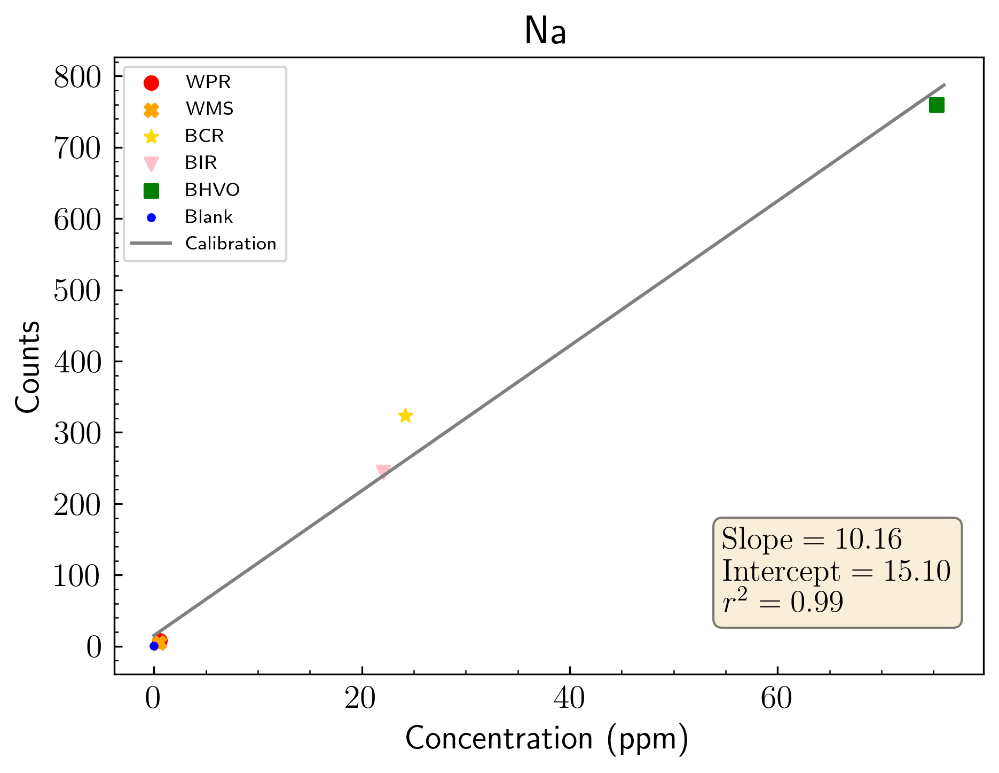

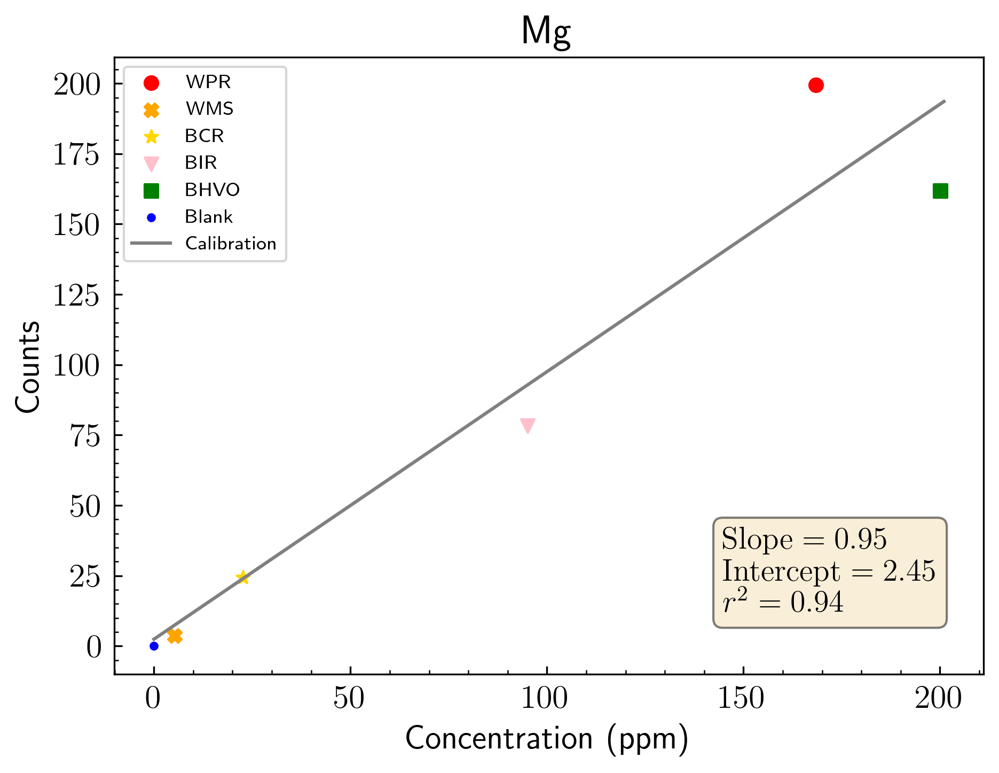

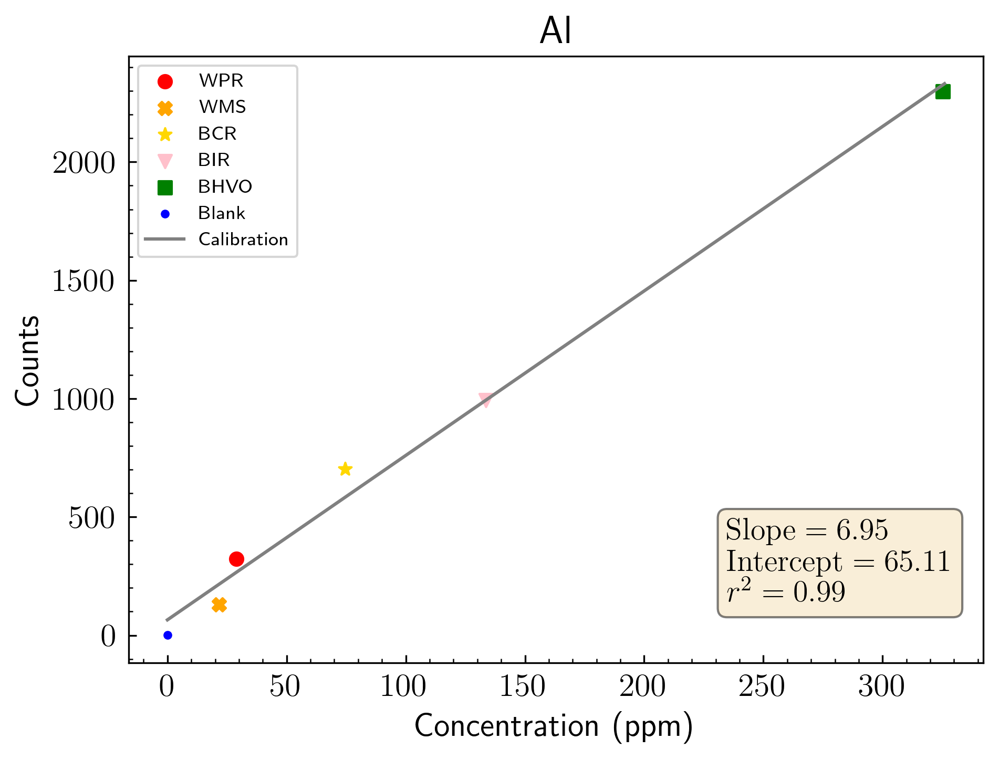

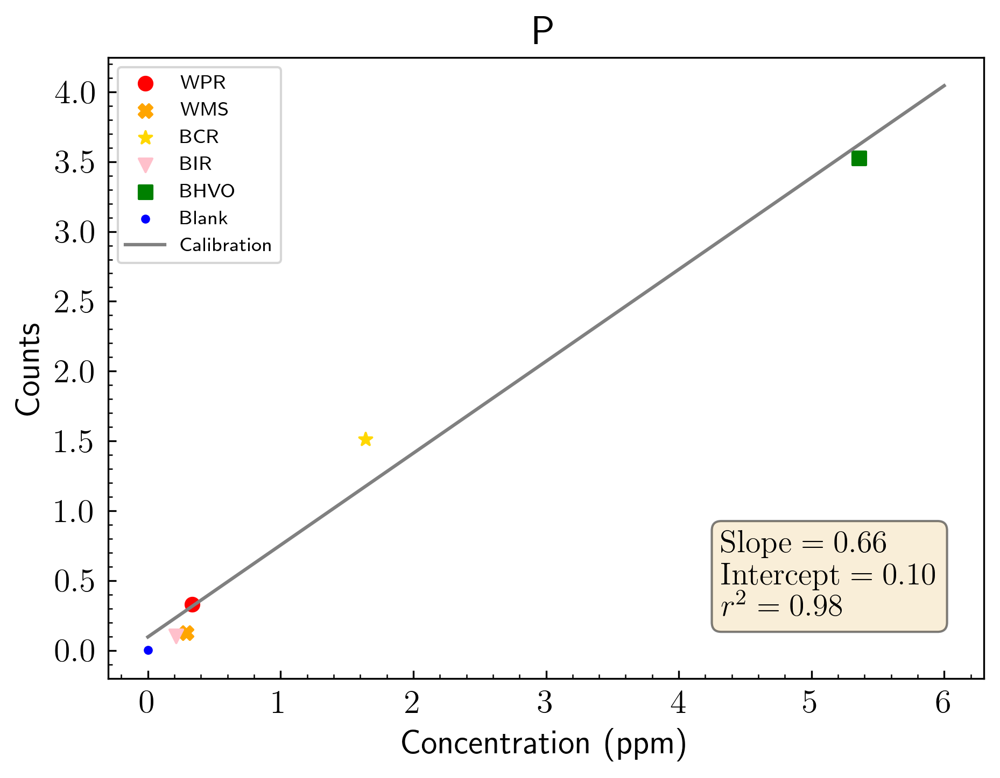

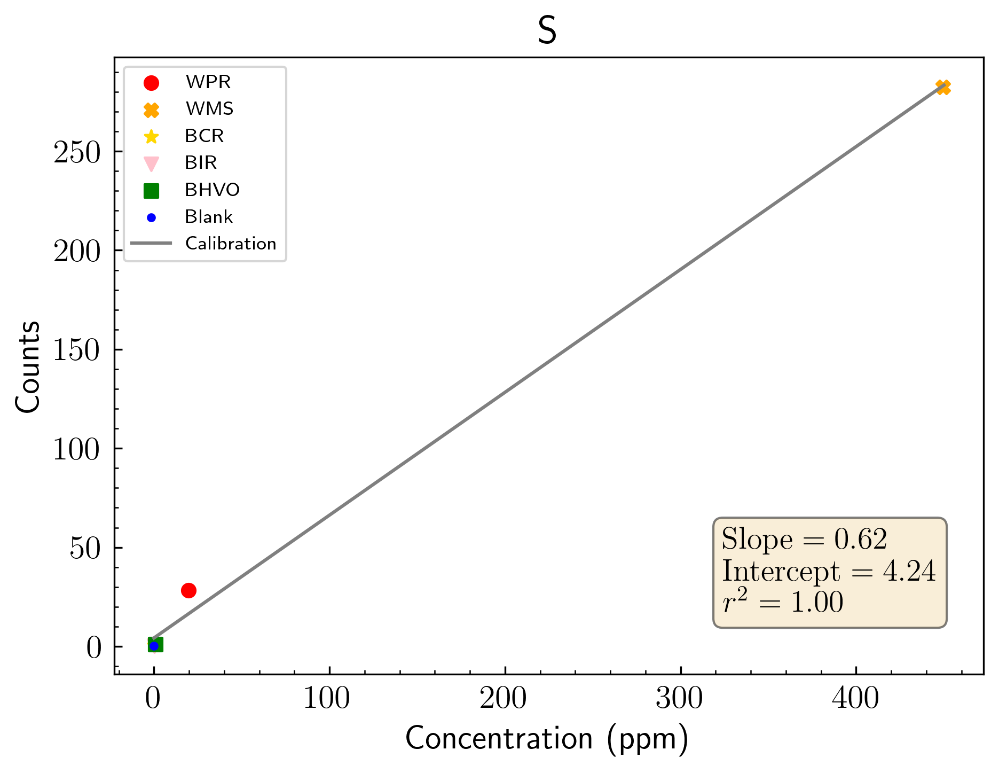

...

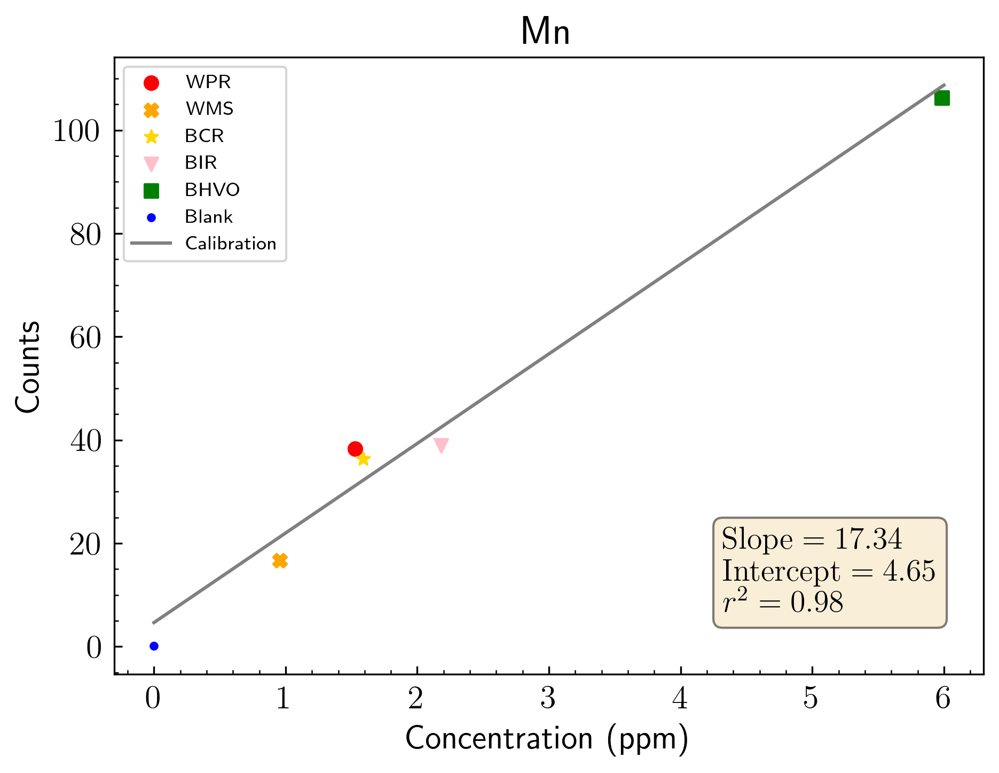

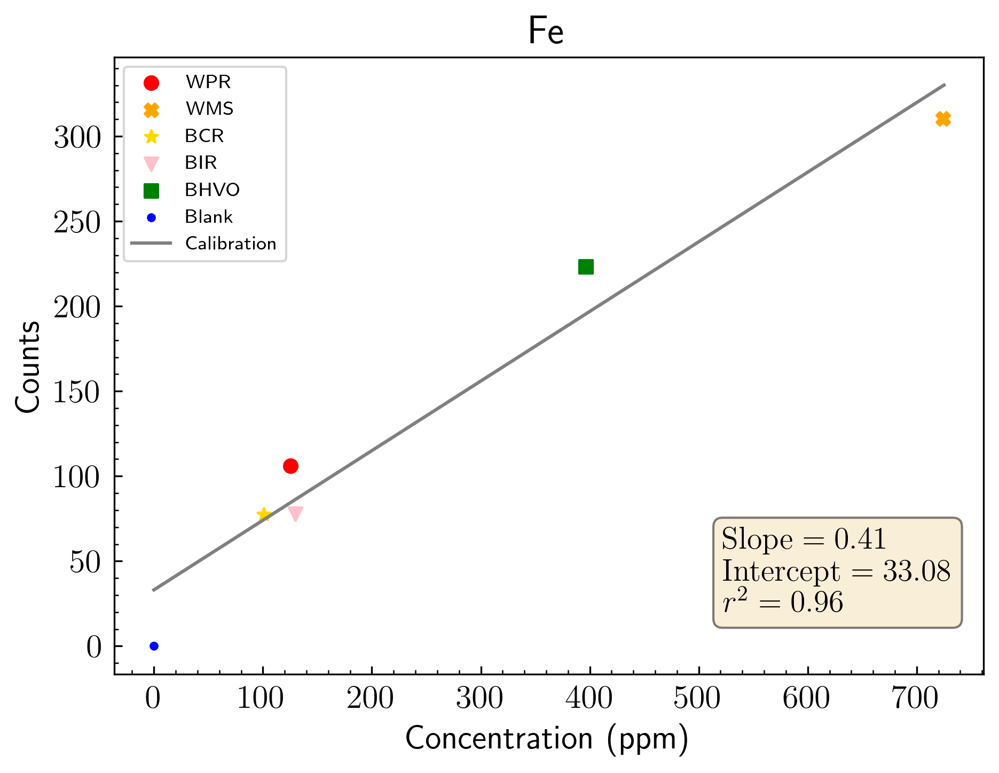

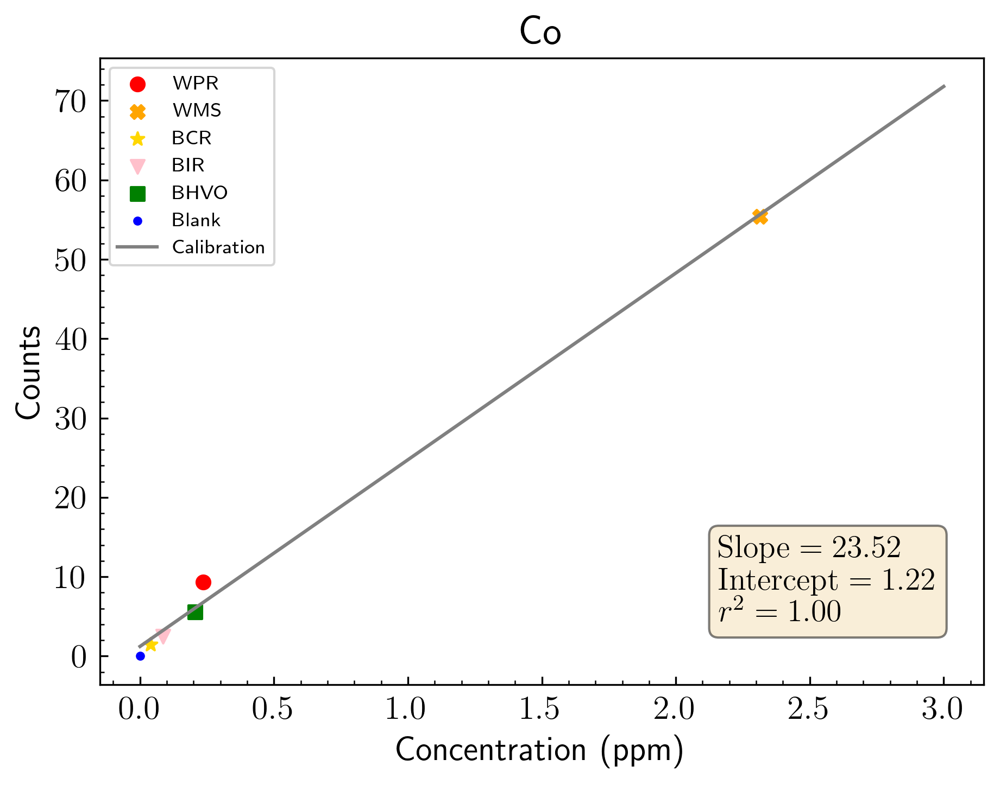

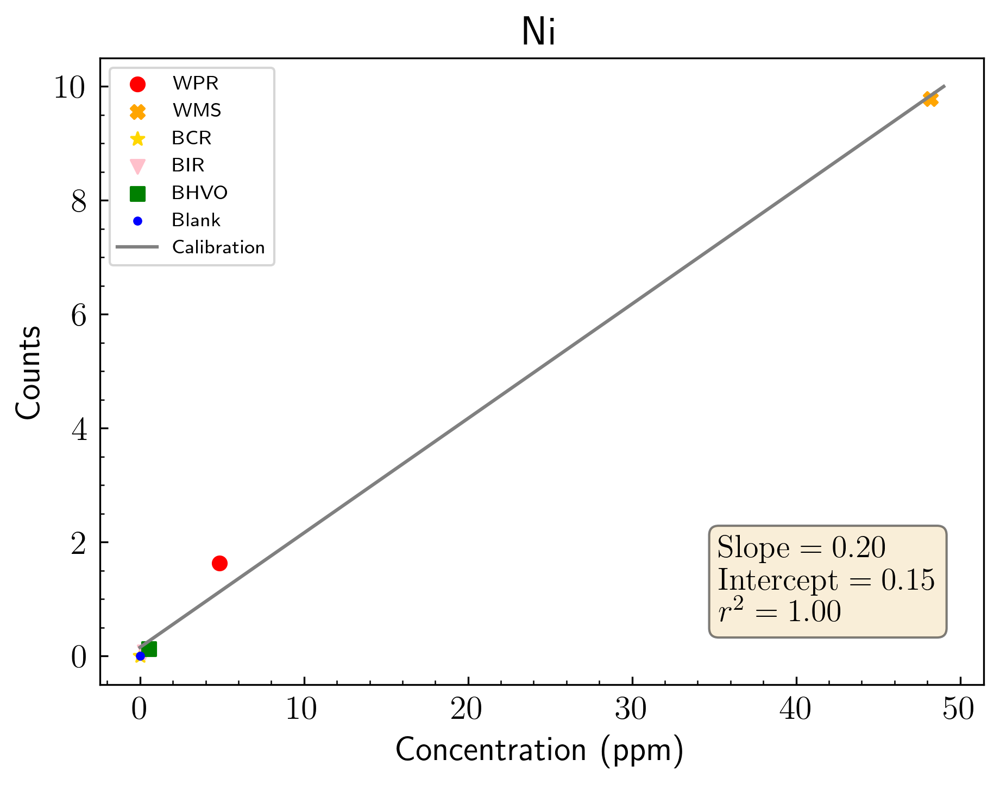

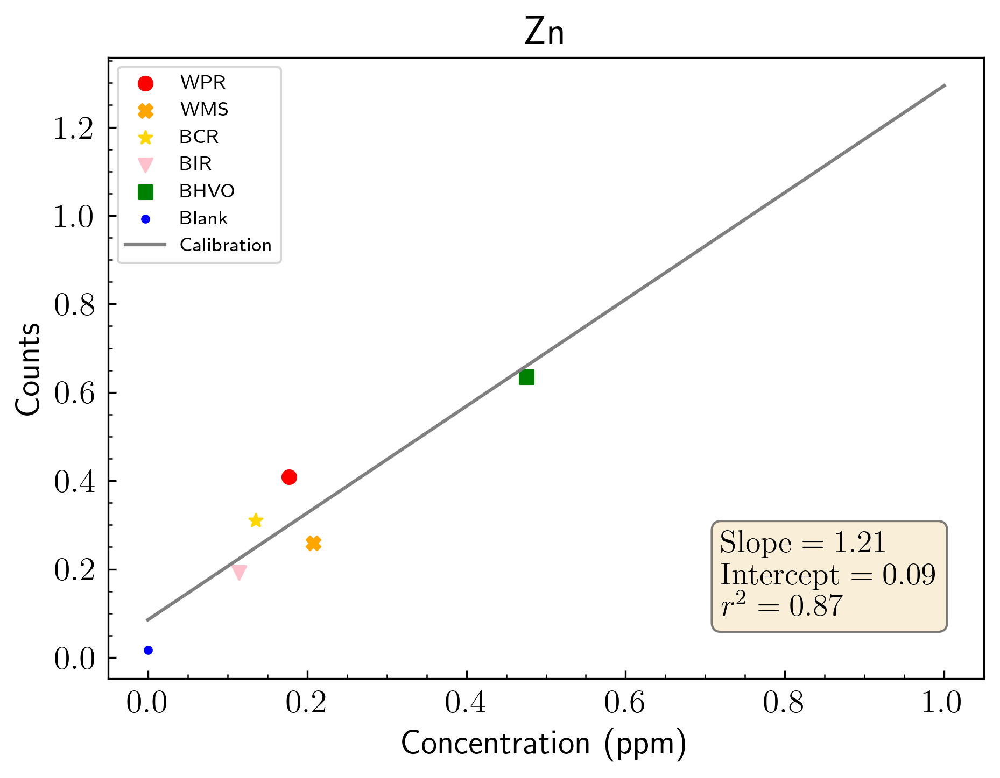

In [13]:
X_names = ['Na', 'Mg', 'Al', 'P', 'S', 'Ca', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Zn']

for i,j in zip(X,X_names):
    fig,ax = plt.subplots()
    plt.scatter(Rock_Conc[i][1], Rock_NormData[i][1],  color='red', marker='o', label='WPR')
    plt.scatter(Rock_Conc[i][2], Rock_NormData[i][2],  color='orange',marker='X',  label='WMS')
    plt.scatter(Rock_Conc[i][3], Rock_NormData[i][3],  color='gold',marker='*', label='BCR')
    plt.scatter(Rock_Conc[i][0], Rock_NormData[i][0], color='pink',marker='v', label='BIR')
    plt.scatter(Rock_Conc[i][4], Rock_NormData[i][4],  color='green',marker='s', label='BHVO')
    plt.scatter(Rock_Conc[i][5], Rock_NormData[i][5],  color='blue',marker='.', label='Blank')

    x=np.arange(np.min(Rock_Conc[i][0:6]), np.max(Rock_Conc[i][0:5])+1)
    plt.plot(x, (x*Cal_Curves_wblank[i][0])+Cal_Curves_wblank[i][1], color='gray', label='Calibration')
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    textstr = '\n'.join((
            r'$\mathrm{Slope}=%.2f$' % (Cal_Curves_wblank[i][0], ),
            r'$\mathrm{Intercept}=%.2f$' % (Cal_Curves_wblank[i][1], ),
            r'$r^2=%.2f$' % (Cal_Curves_wblank[i][3], )))
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, bbox=props, position=(0.7,0.1))

    plt.xlabel(r'Concentration (ppm)')
    plt.ylabel(r'Counts')
    plt.title(str(j))
    plt.legend(fontsize='xx-small')
    plt.minorticks_on()
    plt.savefig(str(j)+'_BIRUnknown.jpg', dpi=1000)
    plt.show()

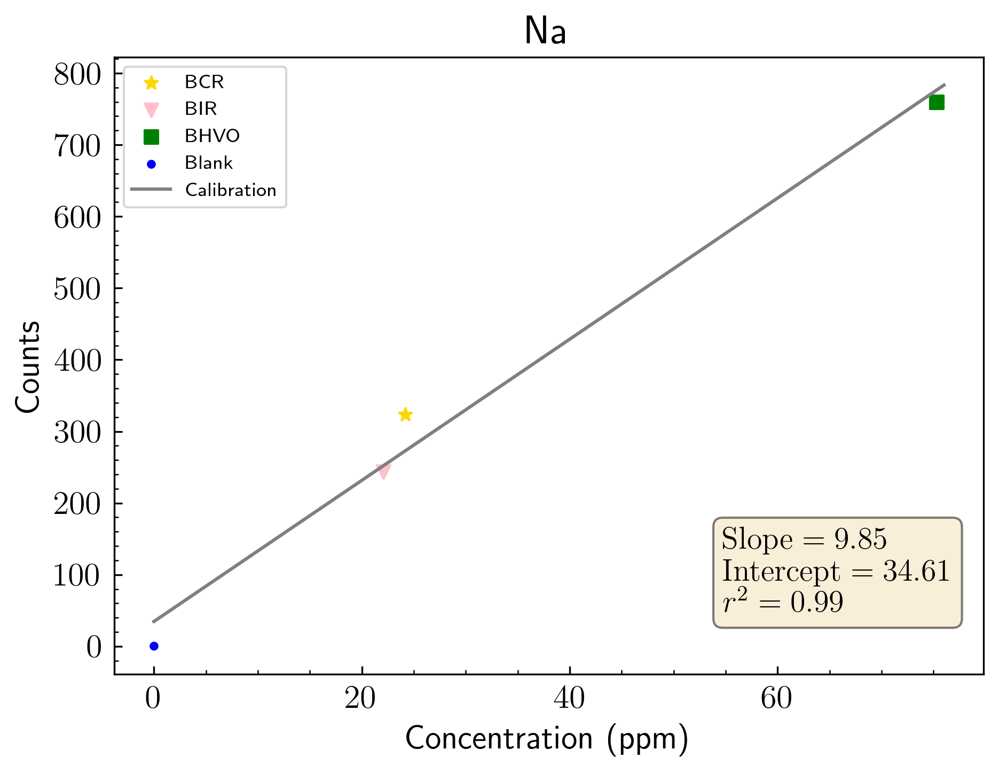

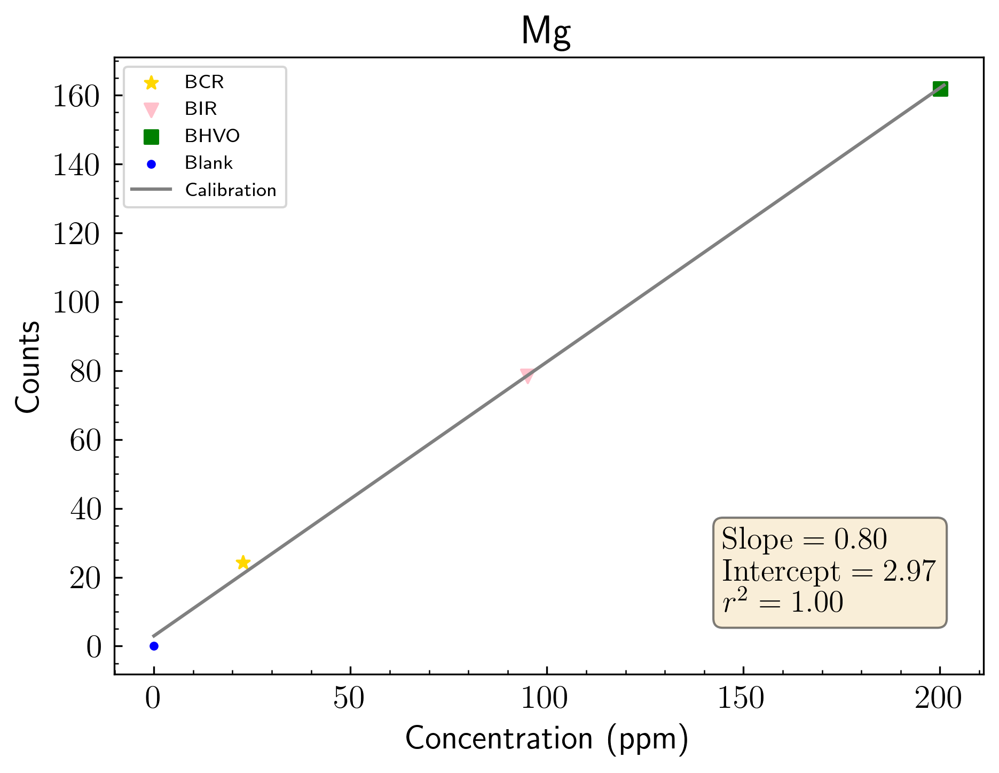

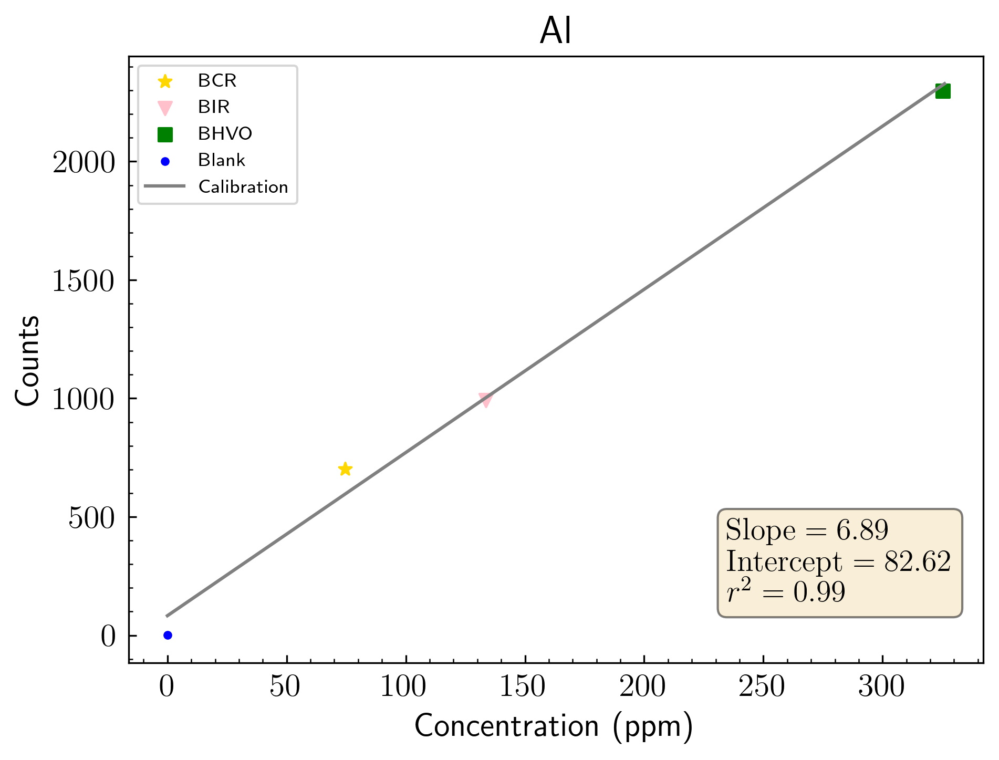

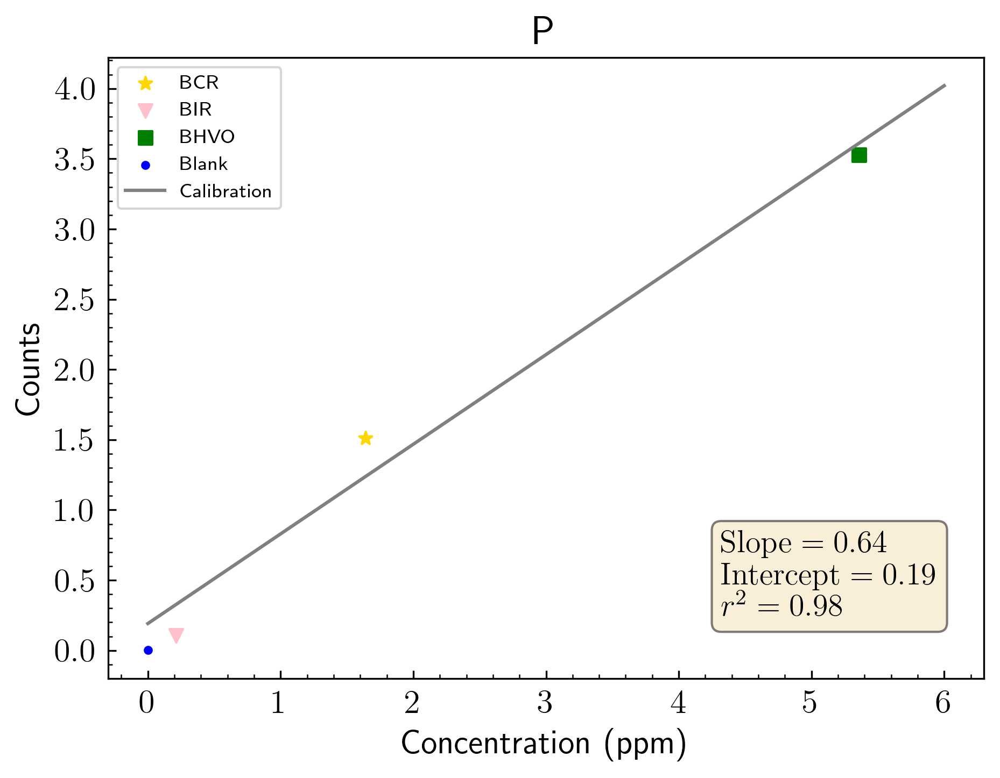

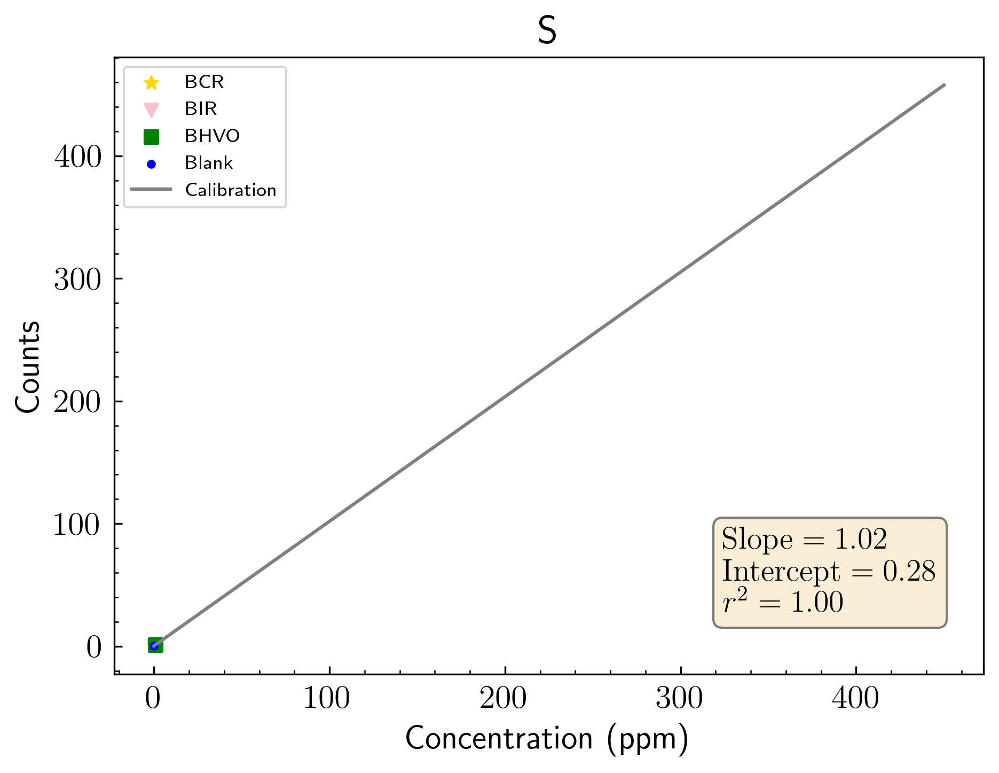

...

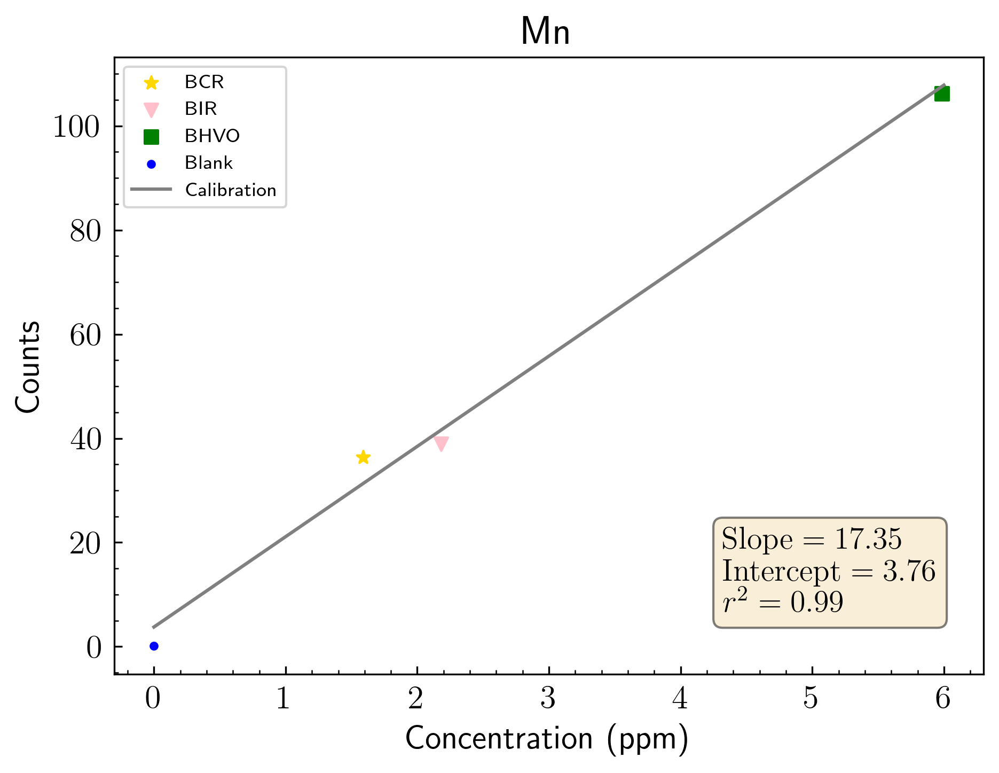

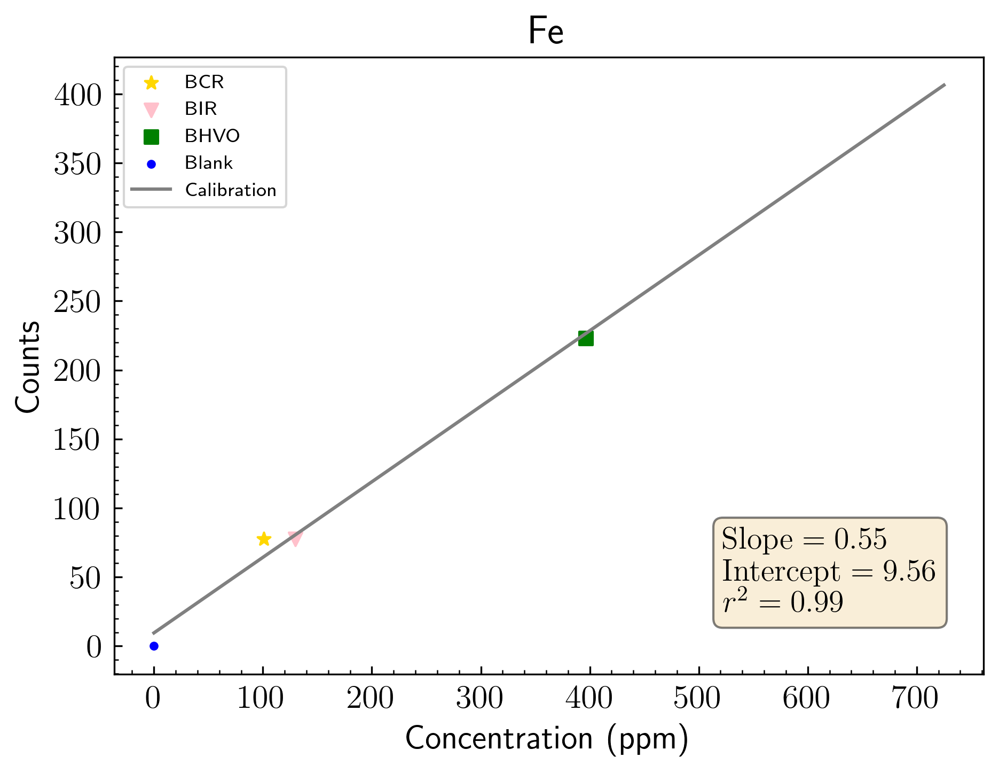

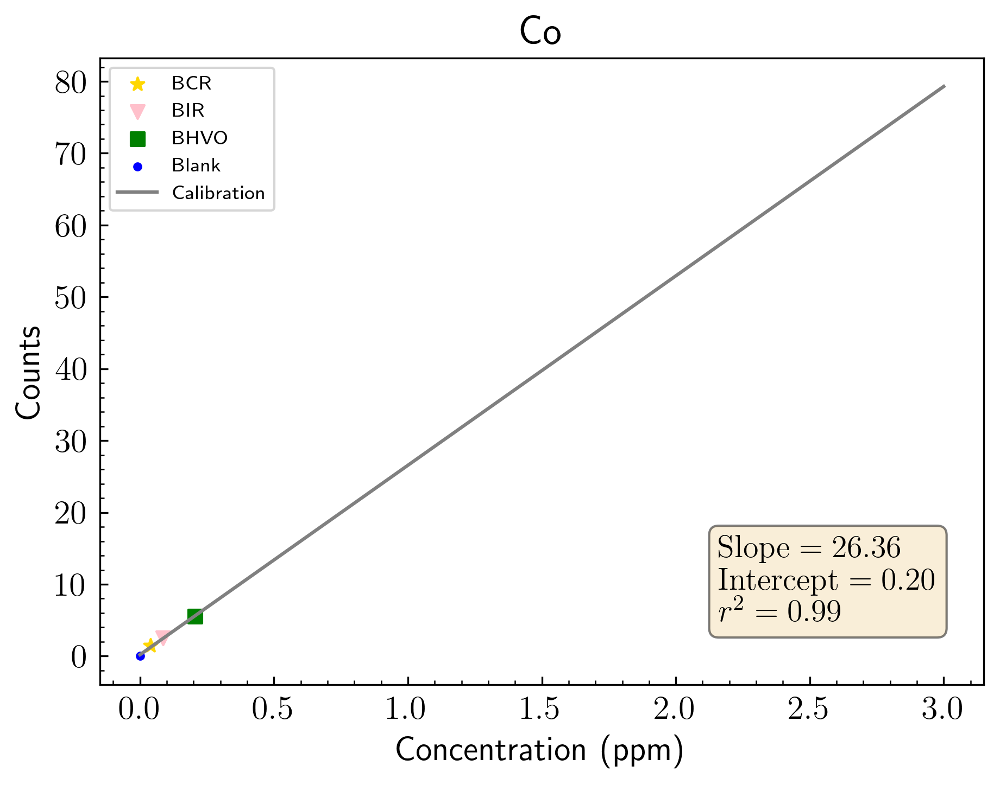

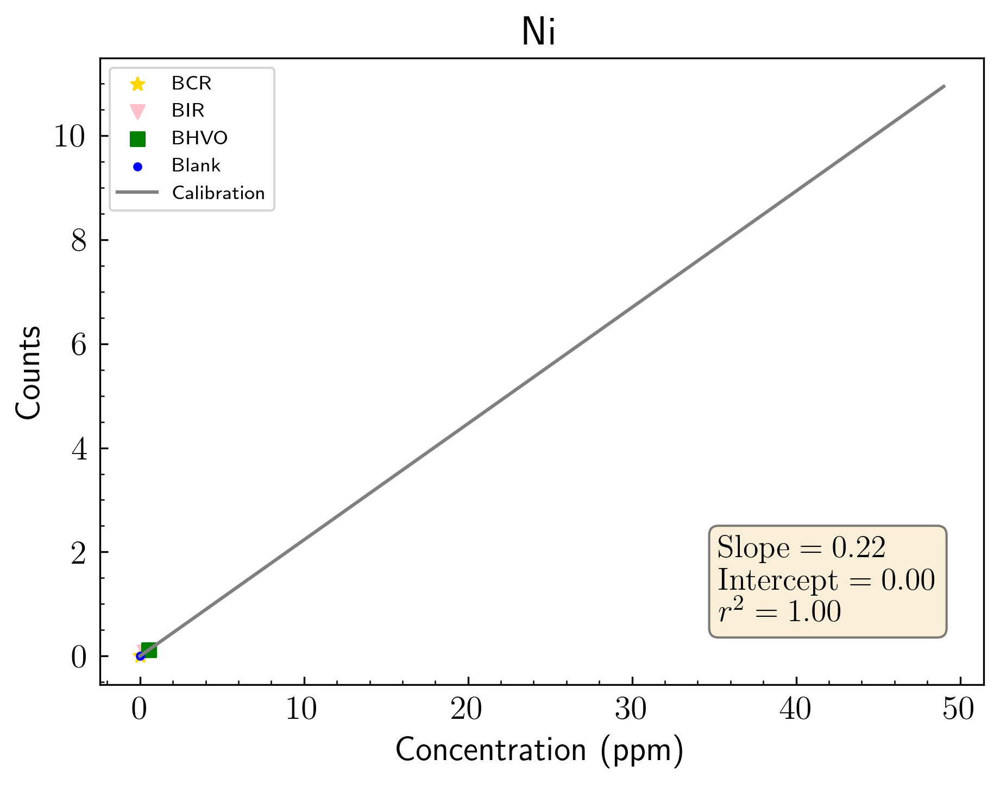

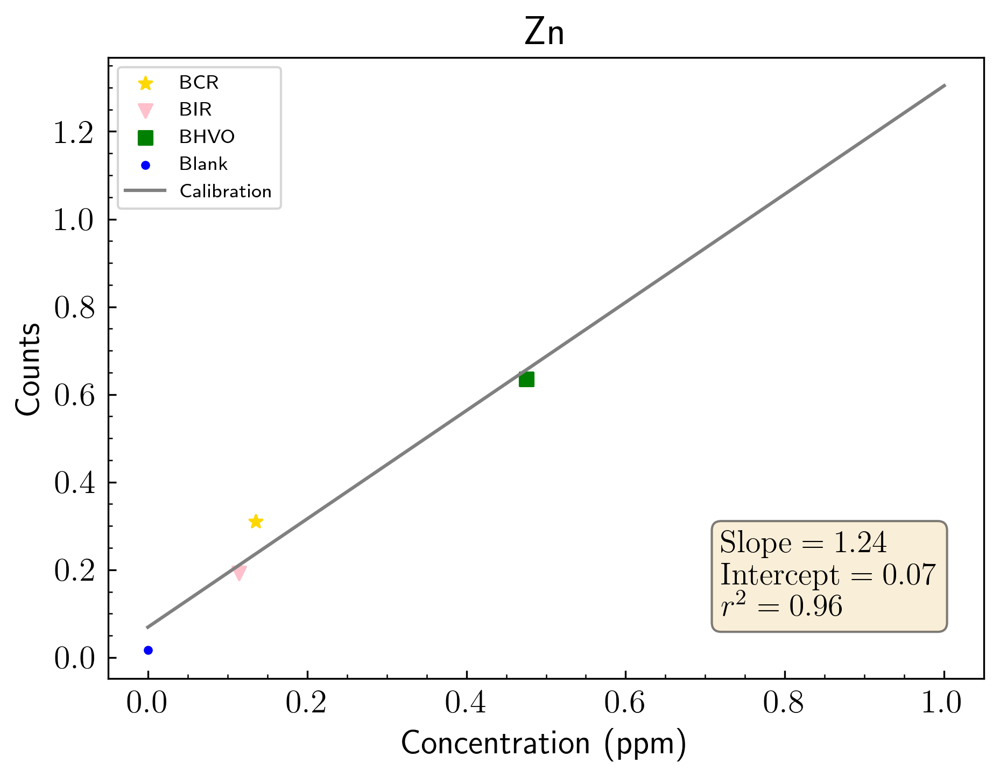

In [14]:
X_names = ['Na', 'Mg', 'Al', 'P', 'S', 'Ca', 'Ti', 'V', 'Cr', 'Mn', 'Fe', 'Co', 'Ni', 'Zn']

for i,j in zip(X,X_names):
    fig,ax = plt.subplots()
    #plt.scatter(Rock_Conc[i][1], Rock_NormData[i][1],  color='red', marker='o', label='WPR')
    #plt.scatter(Rock_Conc[i][2], Rock_NormData[i][2],  color='orange',marker='X',  label='WMS')
    plt.scatter(Rock_Conc[i][3], Rock_NormData[i][3],  color='gold',marker='*', label='BCR')
    plt.scatter(Rock_Conc[i][0], Rock_NormData[i][0], color='pink',marker='v', label='BIR')
    plt.scatter(Rock_Conc[i][4], Rock_NormData[i][4],  color='green',marker='s', label='BHVO')
    plt.scatter(Rock_Conc[i][5], Rock_NormData[i][5],  color='blue',marker='.', label='Blank')

    x=np.arange(np.min(Rock_Conc[i][0:6]), np.max(Rock_Conc[i][0:5])+1)
    plt.plot(x, (x*Cal_Curves_wblank_noW[i][0])+Cal_Curves_wblank_noW[i][1], color='gray', label='Calibration')
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    textstr = '\n'.join((
            r'$\mathrm{Slope}=%.2f$' % (Cal_Curves_wblank_noW[i][0], ),
            r'$\mathrm{Intercept}=%.2f$' % (Cal_Curves_wblank_noW[i][1], ),
            r'$r^2=%.2f$' % (Cal_Curves_wblank_noW[i][3], )))
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, bbox=props, position=(0.7,0.1))

    plt.xlabel(r'Concentration (ppm)')
    plt.ylabel(r'Counts')
    plt.title(str(j))
    plt.legend(fontsize='xx-small')
    plt.minorticks_on()
    #plt.savefig(str(j)+'_blankcorrectionBHVOUnknown.jpg', dpi=1000)
    plt.show()

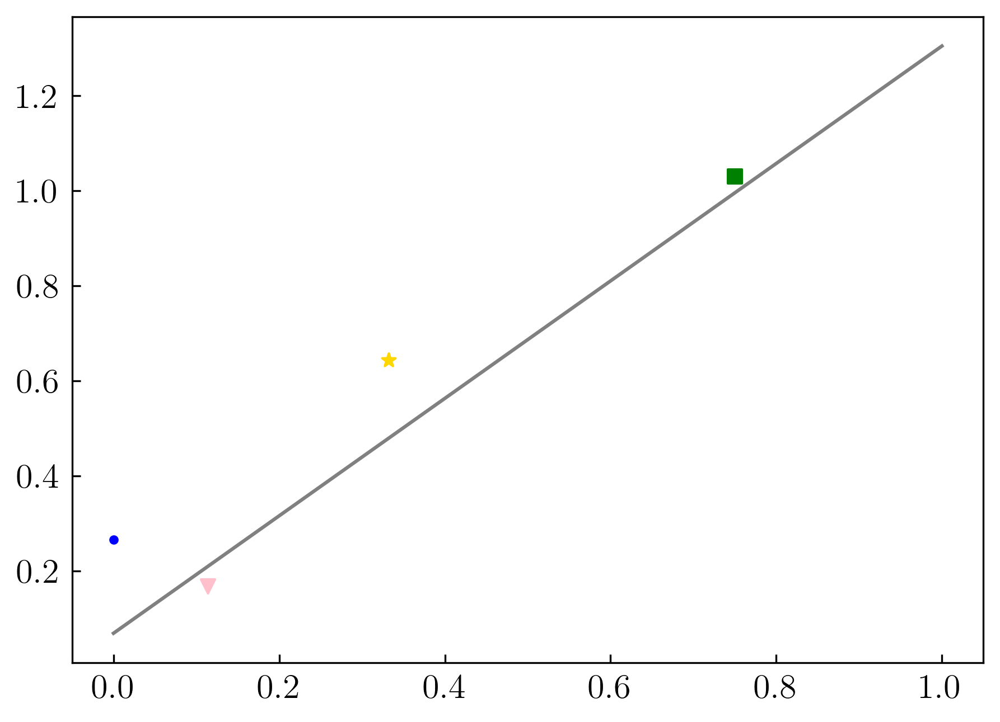

In [15]:
fig,ax = plt.subplots()
#plt.scatter(Rock_Conc['S32'][1], Rock_NormData['S32'][1],  color='red', marker='o', label='WPR')
#plt.scatter(Rock_Conc['S32'][2], Rock_NormData['S32'][2],  color='orange',marker='X',  label='WMS')
plt.scatter(Rock_Conc['S32'][3], Rock_NormData['S32'][3],  color='gold',marker='*', label='BCR')
plt.scatter(Rock_Conc['S32'][0], Rock_NormData['S32'][0], color='pink',marker='v', label='BIR')
plt.scatter(Rock_Conc['S32'][4], Rock_NormData['S32'][4],  color='green',marker='s', label='BHVO')
plt.scatter(Rock_Conc['S32'][5], Rock_NormData['S32'][5],  color='blue',marker='.', label='Blank')

x=np.arange(np.min(Rock_Conc_noW[i][0:6]), np.max(Rock_Conc_noW[i][0:5])+1)
plt.plot(x, (x*Cal_Curves_wblank_noW[i][0])+Cal_Curves_wblank_noW[i][1], color='gray', label='Calibration')
plt.show()

## Calculate Sample Concentrations in Solution

In [16]:
#Calculating concentrations in solution for samples and "unknown" standard:
def ConcinSoln(counts, slope, intercept):
    concinsoln = (counts-intercept)/slope
    return concinsoln

Sample_Names = ['M_1000_3', 'M_800_3', 'M_600_3', 'M_400_3', 'M_1000_2', 'M_800_2', 'M_600_2', 'M_400_2', 'M_1000_1', 'M_800_1', 'M_600_1', 'M_400_1', 'M_UH_2', 'M_UH_1', 'BHVO', 'BIR'] 
Sample_Names_2 = ['M_1000_3', 'M_800_3', 'M_600_3', 'M_400_3', 'M_1000_2', 'M_800_2', 'M_600_2', 'M_400_2', 'M_1000_1', 'M_800_1', 'M_600_1', 'M_400_1', 'M_UH_2', 'M_UH_1', 'BHVO', 'BCR'] 
Sample_Names_3 = ['M_1000_3', 'M_800_3', 'M_600_3', 'M_400_3', 'M_1000_2', 'M_800_2', 'M_600_2', 'M_400_2', 'M_1000_1', 'M_800_1', 'M_600_1', 'M_400_1', 'M_UH_2', 'M_UH_1', 'BHVO', 'WMS'] 





In [17]:
#Sample Concentrations in Solution for Calibrations that Include Blank in Cal Curve:

Samples_NormData_df = [df_norm[6:20], df_norm[5:6], df_norm[1:2]]
Samples_NormData = pd.concat(Samples_NormData_df)
Samples_NormData.index=Sample_Names

Samples_NormData_BCR_df = [df_norm[6:20], df_norm[5:6], df_norm[4:5]]
Samples_NormData_BCR = pd.concat(Samples_NormData_BCR_df)
Samples_NormData_BCR.index=Sample_Names_2

Samples_NormData_df_wBHVO_WMS = [df_norm[6:20], df_norm[5:6], df_norm[3:4]]
Samples_NormData_wBHVO_WMS = pd.concat(Samples_NormData_df_wBHVO_WMS)
Samples_NormData_wBHVO_WMS.index = Sample_Names_3


#Treat BIR as Unknown:
CinS_wblank = []
for i in X:
    concinsoln_wblank = ConcinSoln(Samples_NormData[i], Cal_Curves_wblank[i][0], Cal_Curves_wblank[i][1])
    CinS_wblank.append(concinsoln_wblank)
CinS_wblank_df = pd.DataFrame(data=CinS_wblank)
Samples_CinS_wblank = CinS_wblank_df

#Use All Standards:
CinS_wblank_all = []
for i in X:
    concinsoln_wblank_all = ConcinSoln(Samples_NormData[i], Cal_Curves_wblank_all[i][0], Cal_Curves_wblank_all[i][1])
    CinS_wblank_all.append(concinsoln_wblank_all)
CinS_wblank_all_df = pd.DataFrame(data=CinS_wblank_all)
Samples_CinS_wblank_all = CinS_wblank_all_df

#Treat BHVO as Unknown:
CinS_wblank_BHVO = []
for i in X:
    concinsoln_wblank_BHVO = ConcinSoln(Samples_NormData[i], Cal_Curves_wblank_BHVO[i][0], Cal_Curves_wblank_BHVO[i][1])
    CinS_wblank_BHVO.append(concinsoln_wblank_BHVO)
CinS_wblank_BHVO_df = pd.DataFrame(data=CinS_wblank_BHVO)
Samples_CinS_wblank_BHVO = CinS_wblank_BHVO_df

#Treat BHVO as Unknown, no WMS:
CinS_wblank_noWMS = []
for i in X:
    concinsoln_wblank_noWMS = ConcinSoln(Samples_NormData_wBHVO_WMS[i], Cal_Curves_wblank_noWMS[i][0], Cal_Curves_wblank_noWMS[i][1])
    CinS_wblank_noWMS.append(concinsoln_wblank_noWMS)
CinS_wblank_noWMS_df = pd.DataFrame(data=CinS_wblank_noWMS)
Samples_CinS_wblank_noWMS = CinS_wblank_noWMS_df

#Treat BIR as Unknown, no WMS and WPR:
CinS_wblank_noW = []
for i in X:
    concinsoln_wblank_noW = ConcinSoln(Samples_NormData[i], Cal_Curves_wblank_noW[i][0], Cal_Curves_wblank_noW[i][1])
    CinS_wblank_noW.append(concinsoln_wblank_noW)
CinS_wblank_noW_df = pd.DataFrame(data=CinS_wblank_noW)
Samples_CinS_wblank_noW = CinS_wblank_noW_df

#Treat BCR as Unknown, no WMS:
CinS_wblank_BCRnoWMS = []
for i in X:
    concinsoln_wblank_BCRnoWMS = ConcinSoln(Samples_NormData_BCR[i], Cal_Curves_wblank_BCRnoWMS[i][0], Cal_Curves_wblank_BCRnoWMS[i][1])
    CinS_wblank_BCRnoWMS.append(concinsoln_wblank_BCRnoWMS)
CinS_wblank_BCRnoWMS_df = pd.DataFrame(data=CinS_wblank_BCRnoWMS)
Samples_CinS_wblank_BCRnoWMS = CinS_wblank_BCRnoWMS_df

#Treat BIR as Unknown, no WMS:
CinS_wblank_BIRnoWMS = []
for i in X:
    concinsoln_wblank_BIRnoWMS = ConcinSoln(Samples_NormData[i], Cal_Curves_wblank_BIRnoWMS[i][0], Cal_Curves_wblank_BIRnoWMS[i][1])
    CinS_wblank_BIRnoWMS.append(concinsoln_wblank_BIRnoWMS)
CinS_wblank_BIRnoWMS_df = pd.DataFrame(data=CinS_wblank_BIRnoWMS)
Samples_CinS_wblank_BIRnoWMS = CinS_wblank_BIRnoWMS_df


print(Samples_CinS_wblank_BCRnoWMS)

    

            M_1000_3     M_800_3     M_600_3    M_400_3    M_1000_2  \
Na23        0.117446    0.792198    1.120412   0.535386    0.881857   
Mg26       83.121294   76.465163  101.160362  50.950238   95.123332   
Al27        2.437689    1.424051    4.341986  -1.685356    4.457025   
P31         0.729063    0.723586    0.969217   0.455789    0.927410   
S32         0.235090    7.533202   14.380115   8.108662    0.453629   
Ca43        3.760370    3.065635    5.340349   0.574427    4.817097   
Ti47       -0.513540   -0.573414   -0.417539  -0.749231   -0.435450   
V51         0.026080    0.021932    0.037062   0.005501    0.032793   
Cr52        1.918544    1.743478    2.221668   1.175985    2.156620   
Mn55        1.105805    0.984466    1.365589   0.553422    1.297437   
Fe57      160.413616  145.636471  198.173756  89.291208  189.781749   
Co59        0.378904    0.348619    0.448367   0.232811    0.430437   
Ni61        7.356543    6.842781    8.598398   4.667831    8.246999   
Zn66  

## Determine Sample Concentrations (ppm)

In [18]:
def SampleConc(ConcSoln, Mass_Sample, Mass_Soln):
    conc = []
    for i in X:
        SampConc = (ConcSoln[i] * Mass_Soln)/Mass_Sample
        conc.append(SampConc)
    df = pd.DataFrame(data=conc)
    DF = df.T
    DF.columns=X
    DF = DF.clip(lower=0)
    return DF

In [19]:
MeteoriteSample_Names = ['M_1000_3', 'M_800_3', 'M_600_3', 'M_400_3', 'M_1000_2', 'M_800_2', 'M_600_2', 'M_400_2', 'M_1000_1', 'M_800_1', 'M_600_1', 'M_400_1', 'M_UH_2', 'M_UH_1'] 

Conc_wblank_arr = [] #Include Blank, BIR Unknown
Conc_wblank_all_arr = [] #Include Blank, All Standards
Conc_wblank_BHVO_arr = [] #Include Blank, BHVO Unknown
Conc_wblank_noWMS_arr = [] #Include Blank, BHVO Unknown, WMS removed
Conc_wblank_noW_arr = [] #Include Blank, BIR Unknown, WMS and WPR removed
Conc_wblank_BCRnoWMS_arr = [] #Include Blank, BCR Unknown, WMS removed
Conc_wblank_BIRnoWMS_arr = [] #Include Blank, BIR Unknown, WMS removed


for i,j,k in zip(MeteoriteSample_Names, Mass_arr, SolnMass_arr):
    
    Conc_wblank = SampleConc(Samples_CinS_wblank[i], j, k)
    Conc_wblank_arr.append(Conc_wblank)
    
    Conc_wblank_all = SampleConc(Samples_CinS_wblank_all[i], j, k)
    Conc_wblank_all_arr.append(Conc_wblank_all)
    
    Conc_wblank_BHVO = SampleConc(Samples_CinS_wblank_BHVO[i], j, k)
    Conc_wblank_BHVO_arr.append(Conc_wblank_BHVO)
    
    Conc_wblank_noWMS = SampleConc(Samples_CinS_wblank_noWMS[i], j, k)
    Conc_wblank_noWMS_arr.append(Conc_wblank_noWMS)
    
    Conc_wblank_noW = SampleConc(Samples_CinS_wblank_noW[i], j, k)
    Conc_wblank_noW_arr.append(Conc_wblank_noW)
    
    Conc_wblank_BCRnoWMS = SampleConc(Samples_CinS_wblank_BCRnoWMS[i], j, k)
    Conc_wblank_BCRnoWMS_arr.append(Conc_wblank_BCRnoWMS)
    
    Conc_wblank_BIRnoWMS = SampleConc(Samples_CinS_wblank_BIRnoWMS[i], j, k)
    Conc_wblank_BIRnoWMS_arr.append(Conc_wblank_BIRnoWMS)
    
    
    
#CALIBRATIONS WITH BLANK IN CAL CURVES:

#Calibration with Blank, BIR-Unknown:
BHVO_Conc_wblank = SampleConc(Samples_CinS_wblank['BHVO'], BHVO, BHVO_S)
Conc_wblank_arr.append(BHVO_Conc_wblank)

BIR_Conc_wblank = SampleConc(Samples_CinS_wblank['BIR'], BIR, BIR_S)
Conc_wblank_arr.append(BIR_Conc_wblank)

Conc_Samples_wblank = pd.concat(Conc_wblank_arr)
Conc_Samples_wblank.index = Sample_Names
SampleConcentrations_wblank = Conc_Samples_wblank.T

#Calibration with Blank, All Standards:
BHVO_Conc_wblank_all = SampleConc(Samples_CinS_wblank_all['BHVO'], BHVO, BHVO_S)
Conc_wblank_all_arr.append(BHVO_Conc_wblank_all)

BIR_Conc_wblank_all = SampleConc(Samples_CinS_wblank_all['BIR'], BIR, BIR_S)
Conc_wblank_all_arr.append(BIR_Conc_wblank_all)

Conc_Samples_wblank_all = pd.concat(Conc_wblank_all_arr)
Conc_Samples_wblank_all.index = Sample_Names
SampleConcentrations_wblank_all = Conc_Samples_wblank_all.T

#Calibration with Blank, BHVO-Unknown:
BHVO_Conc_wblank_BHVO = SampleConc(Samples_CinS_wblank_BHVO['BHVO'], BHVO, BHVO_S)
Conc_wblank_BHVO_arr.append(BHVO_Conc_wblank_BHVO)

BIR_Conc_wblank_BHVO = SampleConc(Samples_CinS_wblank_BHVO['BIR'], BIR, BIR_S)
Conc_wblank_BHVO_arr.append(BIR_Conc_wblank_BHVO)

Conc_Samples_wblank_BHVO = pd.concat(Conc_wblank_BHVO_arr)
Conc_Samples_wblank_BHVO.index = Sample_Names
SampleConcentrations_wblank_BHVO = Conc_Samples_wblank_BHVO.T

#Calibration with Blank, BHVO-Unknown, WMS Removed:
BHVO_Conc_wblank_noWMS = SampleConc(Samples_CinS_wblank_noWMS['BHVO'], BHVO, BHVO_S)
Conc_wblank_noWMS_arr.append(BHVO_Conc_wblank_noWMS)

WMS_Conc_wblank_noWMS = SampleConc(Samples_CinS_wblank_noWMS['WMS'], WMS, WMS_S)
Conc_wblank_noWMS_arr.append(WMS_Conc_wblank_noWMS)

Conc_Samples_wblank_noWMS = pd.concat(Conc_wblank_noWMS_arr)
Conc_Samples_wblank_noWMS.index = Sample_Names
SampleConcentrations_wblank_noWMS = Conc_Samples_wblank_noWMS.T

#Calibration with Blank, BIR-Unknown, WMS and WPR Removed:
BHVO_Conc_wblank_noW = SampleConc(Samples_CinS_wblank_noW['BHVO'], BHVO, BHVO_S)
Conc_wblank_noW_arr.append(BHVO_Conc_wblank_noW)

BIR_Conc_wblank_noW = SampleConc(Samples_CinS_wblank_noW['BIR'], BIR, BIR_S)
Conc_wblank_noW_arr.append(BIR_Conc_wblank_noW)

Conc_Samples_wblank_noW = pd.concat(Conc_wblank_noW_arr)
Conc_Samples_wblank_noW.index = Sample_Names
SampleConcentrations_wblank_noW = Conc_Samples_wblank_noW.T

#Calibration with Blank, BCR-Unknown, WMS Removed:
BHVO_Conc_wblank_BCRnoWMS = SampleConc(Samples_CinS_wblank_BCRnoWMS['BHVO'], BHVO, BHVO_S)
Conc_wblank_BCRnoWMS_arr.append(BHVO_Conc_wblank_BCRnoWMS)

BCR_Conc_wblank_BCRnoWMS = SampleConc(Samples_CinS_wblank_BCRnoWMS['BCR'], BCR, BCR_S)
Conc_wblank_BCRnoWMS_arr.append(BCR_Conc_wblank_BCRnoWMS)

Conc_Samples_wblank_BCRnoWMS = pd.concat(Conc_wblank_BCRnoWMS_arr)
Conc_Samples_wblank_BCRnoWMS.index = Sample_Names_2
SampleConcentrations_wblank_BCRnoWMS = Conc_Samples_wblank_BCRnoWMS.T

#Calibration with Blank, BIR-Unknown, WMS Removed:
BHVO_Conc_wblank_BIRnoWMS = SampleConc(Samples_CinS_wblank_BIRnoWMS['BHVO'], BHVO, BHVO_S)
Conc_wblank_BIRnoWMS_arr.append(BHVO_Conc_wblank_BIRnoWMS)

BIR_Conc_wblank_BIRnoWMS = SampleConc(Samples_CinS_wblank_BIRnoWMS['BIR'], BIR, BIR_S)
Conc_wblank_BIRnoWMS_arr.append(BIR_Conc_wblank_BIRnoWMS)

Conc_Samples_wblank_BIRnoWMS = pd.concat(Conc_wblank_BIRnoWMS_arr)
Conc_Samples_wblank_BIRnoWMS.index = Sample_Names
SampleConcentrations_wblank_BIRnoWMS = Conc_Samples_wblank_BIRnoWMS.T



In [20]:
#print(SampleConcentrations_wblank)
#SampleConcentrationprint(SampleConcentrations_wblank)
print(SampleConcentrations_wblank_noW)


               M_1000_3        M_800_3        M_600_3        M_400_3  \
Na23           0.000000       0.000000       0.000000       0.000000   
Mg26      386592.117370  220869.503537  148252.445816  136559.728473   
Al27           0.000000       0.000000    1033.120913       0.000000   
P31         2023.141946    1239.461079     937.639003     541.485274   
S32          638.013985   24949.112415   24574.800156   24479.282631   
Ca43        9681.735092    4345.575207    4990.559256       0.000000   
Ti47           0.000000       0.000000       0.000000       0.000000   
V51           49.018086      20.523939      28.866599       0.000000   
Cr52        8685.097858    4859.163839    3213.576824    2894.563033   
Mn55        4508.234056    2506.653284    1741.650772    1361.590923   
Fe57      649200.007462  367264.650658  251258.604076  213949.390366   
Co59        1872.662760    1064.041028     705.913000     636.531726   
Ni61       42397.176467   24394.745572   15741.241080   15058.14

## Check Calibrations

### Plot Reference Standard Published vs. Calculated Values

In [21]:
Y_compare = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
X_compare = ['Al27', 'Ti47', 'Ca43', 'V51', 'Ni61', 'Co59', 'Mg26', 'Fe57', 'Cr52', 'P31', 'Mn55', 'Na23', 'Zn66', 'S32']
X_compare_names = ['Al', 'Ti', 'Ca', 'V', 'Ni', 'Co', 'Mg', 'Fe', 'Cr', 'P', 'Mn', 'Na', 'Zn', 'S']

def reference_comparison(calculated, published, std, title, title2):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare,Y_compare):
        plt.errorbar(j, calculated[std][i]/published[std][i], fmt='o', color='forestgreen')
    plt.axhline(y=1.0, ls='--', color='gray')
    plt.ylim(0, 1.4)
    ax.set_xticks(Y_compare)
    ax.set_xticklabels(X_compare_names, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylabel('Calculated/Published Concentration')
    plt.title(title)
    plt.savefig(title2, dpi=1000)
    plt.show()

Y_compare_up = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
X_compare_up = ['V51', 'Ni61', 'Co59', 'Mg26', 'Fe57', 'Cr52', 'P31', 'Mn55', 'Zn66', 'S32']
X_compare_names_up = ['V', 'Ni', 'Co', 'Mg', 'Fe', 'Cr', 'P', 'Mn', 'Zn', 'S']

    
def reference_comparison_update(calculated, published, std, title, title2):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare_up,Y_compare_up):
        plt.errorbar(j, calculated[std][i]/published[std][i], fmt='o', color='forestgreen')
    plt.axhline(y=1.0, ls='--', color='gray')
    plt.ylim(0, 1.4)
    ax.set_xticks(Y_compare_up)
    ax.set_xticklabels(X_compare_names_up, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylabel('Calculated/Published Concentration')
    plt.title(title)
    plt.savefig(title2, dpi=1000)
    plt.show()
    
def reference_comparison_update_unc(calculated, published, unc, std, title, title2):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare_up,Y_compare_up):
        plt.scatter(j, calculated[std][i]/published[std][i], alpha=0.7, color='forestgreen')
        plt.errorbar(j, calculated[std][i]/published[std][i], yerr=(calculated[std][i]/published[std][i])*(StdUncData[std][i]/published[std][i]), color='forestgreen')
    plt.axhline(y=1.0, ls='--', color='gray')
    plt.ylim(0, 1.4)
    ax.set_xticks(Y_compare_up)
    ax.set_xticklabels(X_compare_names_up, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylabel('Calculated/Published Concentration')
    plt.title(title)
    plt.savefig(title2, dpi=1000)
    plt.show()
    
    

In [22]:
print('Calculated BIR:')
print(SampleConcentrations_wblank['BIR'])
print('Calculated BHVO:')
print(SampleConcentrations_wblank['BHVO'])


print('Published Values BIR:')
print(StdData['BIR'])

print('Published Values BHVO:')
print(StdData['BHVO'])

Calculated BIR:
Na23        13853.970864
Mg26        49087.175793
Al27        82108.905405
P31             7.739918
S32             0.000000
Ca43        89850.857441
Ti47         5531.832910
V51           304.893055
Cr52          340.974707
Mn55         1214.948065
Fe57        66930.629520
Co59           33.779569
Ni61            0.000000
Zn66           54.644207
In115                NaN
K39_HR      16047.196796
In115_HR        0.526039
Name: BIR, dtype: float64
Calculated BHVO:
Na23         16033.607118
Mg26         36651.790523
Al27         70287.772112
P31           1140.192674
S32              0.000000
Ca43         81481.175038
Ti47         16199.006445
V51            315.383460
Cr52           244.578351
Mn55          1281.168931
Fe57        101507.223168
Co59            40.396045
Ni61             0.000000
Zn66            99.479808
In115                 NaN
K39_HR        4067.511166
In115_HR         0.074184
Name: BHVO, dtype: float64
Published Values BIR:
Sample        BIR_S
Na23 

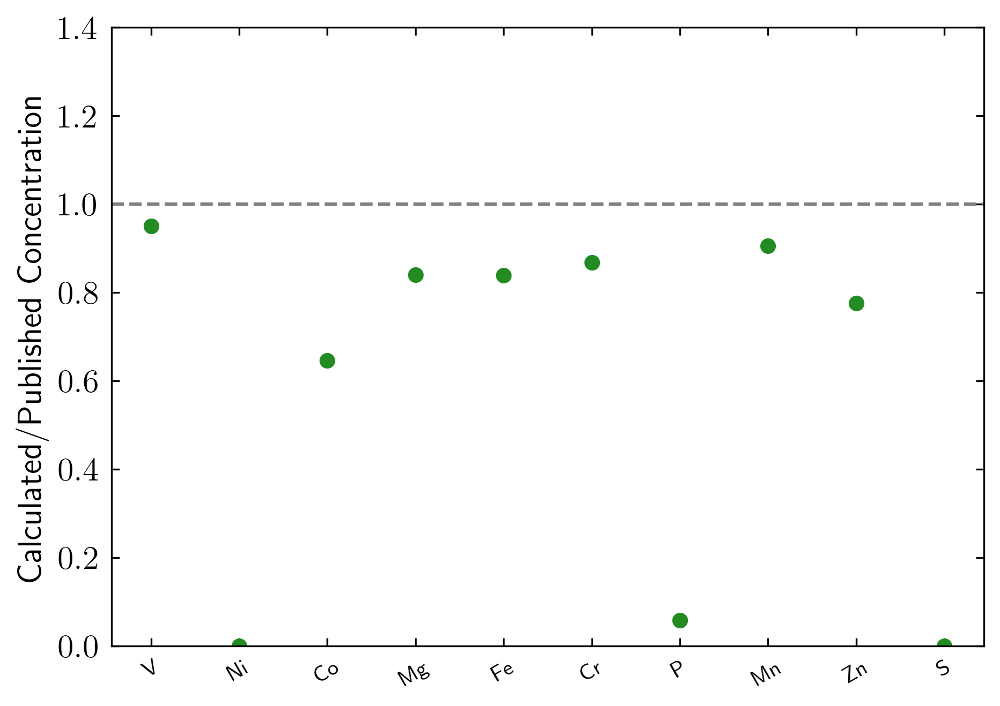

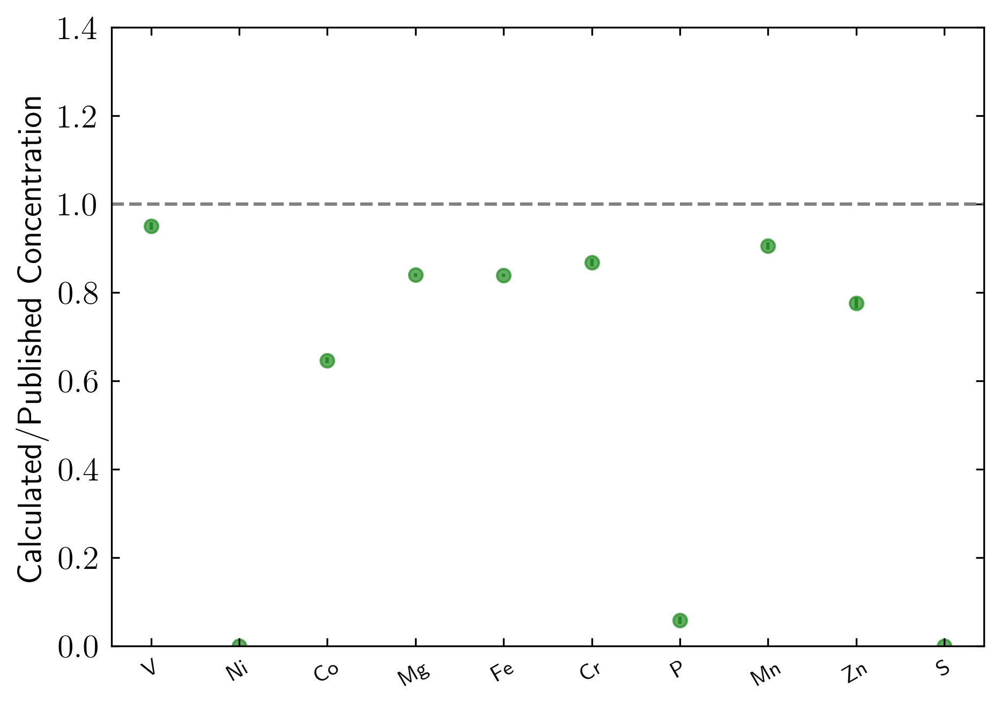

In [23]:
reference_comparison_update(SampleConcentrations_wblank, StdData, 'BIR', '', 'BIRUnknown_wBlank_update.jpg')
reference_comparison_update_unc(SampleConcentrations_wblank, StdData, StdUncData, 'BIR', '', 'BIRUnknown_wBlank_update_unc.jpg')


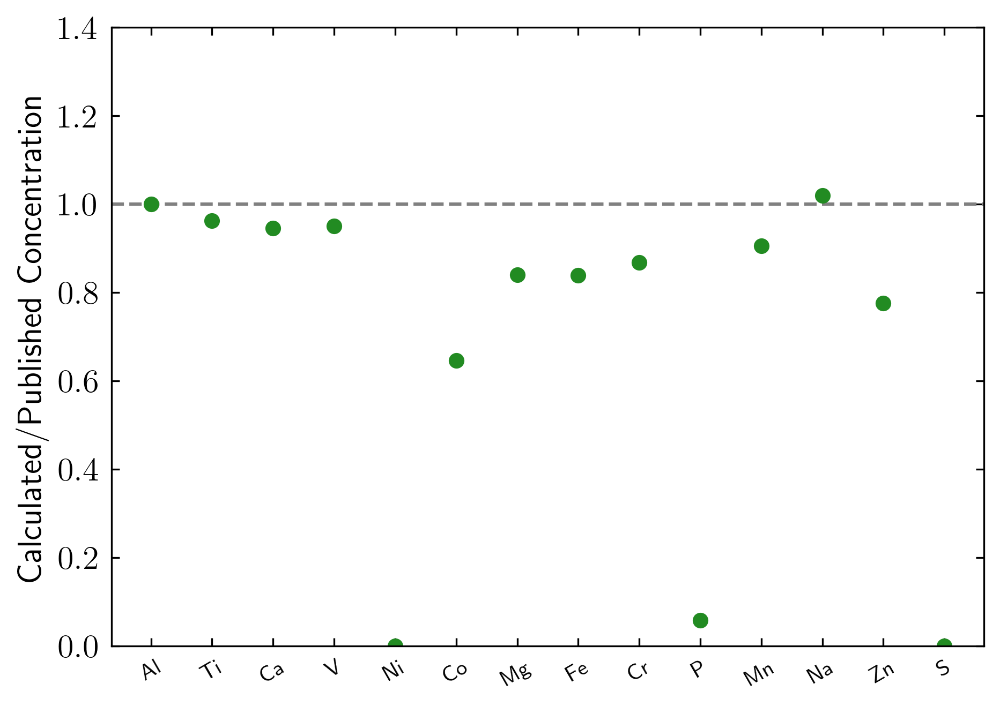

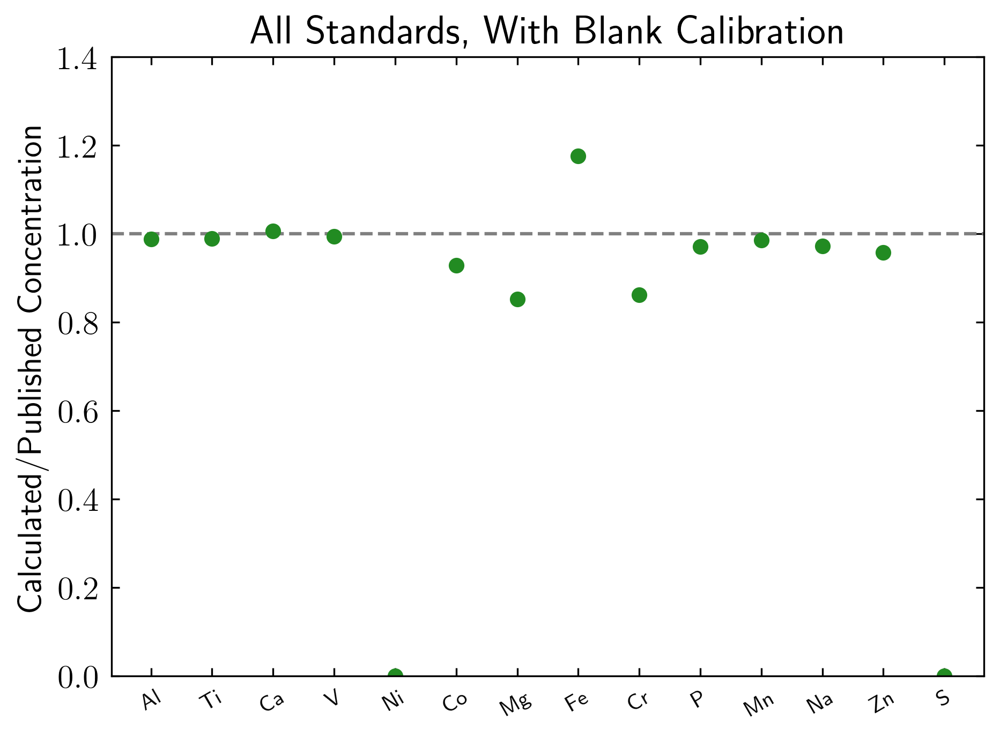

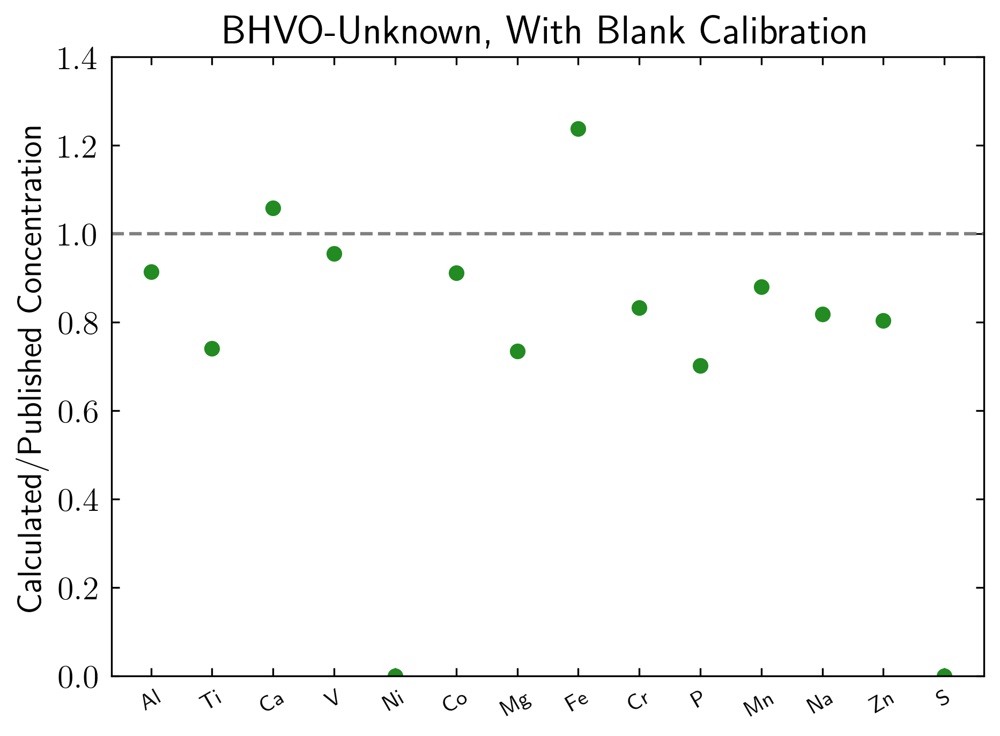

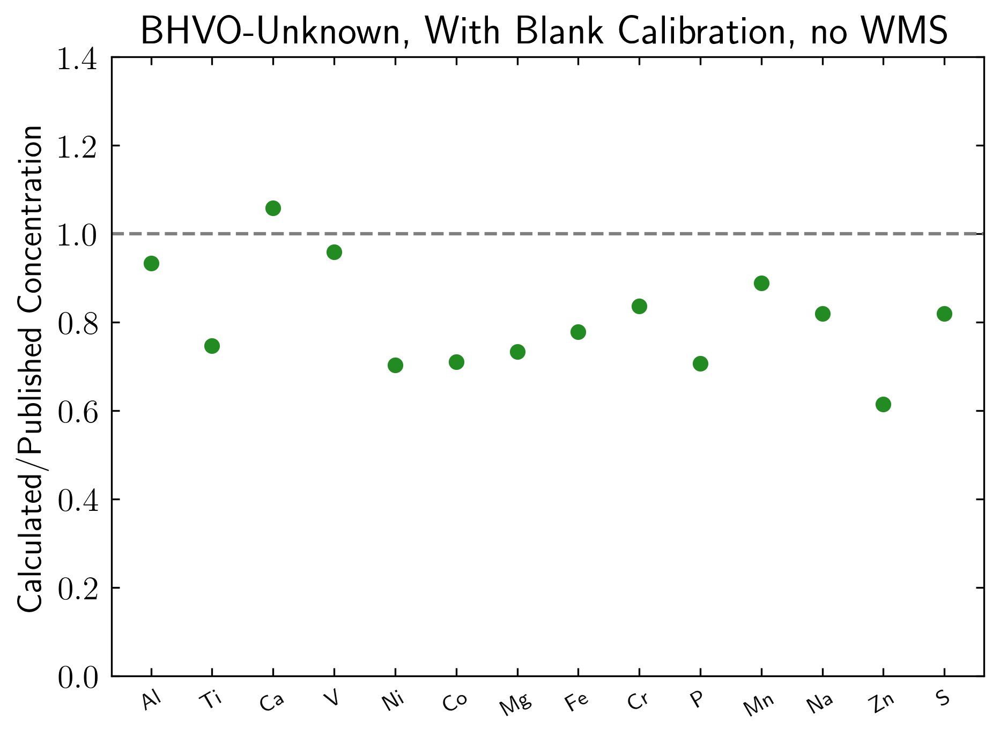

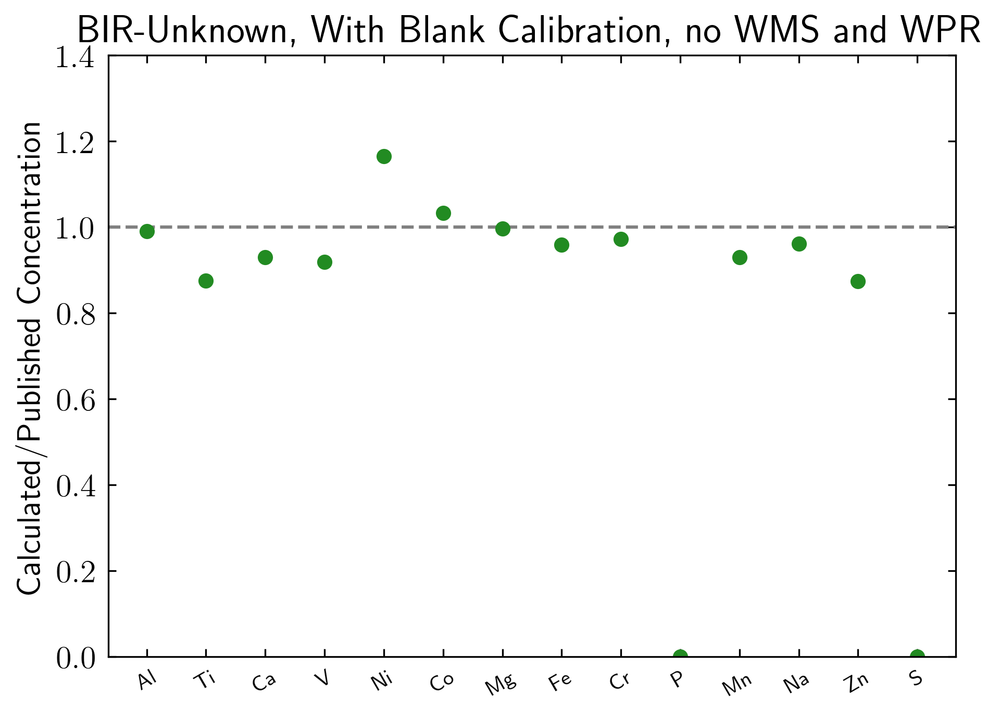

In [24]:

reference_comparison(SampleConcentrations_wblank, StdData, 'BIR', '', 'BIRUnknown_wBlank.jpg')
reference_comparison(SampleConcentrations_wblank_all, StdData, 'BHVO', 'All Standards, With Blank Calibration', 'AllStds_wBlank.jpg')
reference_comparison(SampleConcentrations_wblank_BHVO, StdData, 'BHVO', 'BHVO-Unknown, With Blank Calibration', 'BHVOUnkown_wBlank.jpg')
reference_comparison(SampleConcentrations_wblank_noWMS, StdData, 'BHVO', 'BHVO-Unknown, With Blank Calibration, no WMS', 'BHVOUnkown_noWMS_wBlank.jpg')
reference_comparison(SampleConcentrations_wblank_noW, StdData, 'BIR', 'BIR-Unknown, With Blank Calibration, no WMS and WPR', 'BIRUnkown_noW_wBlank.jpg')



### Calculate % Error

In [25]:
def calc_percerr(val1,val2):
    top = np.abs(val2-val1) #val1: accepted/published value; val2: calculated/experimental value
    bottom = val1
    diff = top/bottom
    return(diff*100)

def std(val1, val2, mean):
    s1=(val1-mean)**2
    s2=(val2-mean)**2
    vsum = s1+s2
    STD = np.sqrt(vsum)
    return STD

def ConfidenceInterval95(val1, val2, mean):
    interval = (12.706*std(val1, val2, mean))/(np.sqrt(2.0))
    int_up = mean + interval
    int_down = mean - interval
    return interval
#, int_down, int_up

X_mod = ['Na23', 'Mg26', 'Al27', 'P31', 'S32', 'Ca43', 'Ti47', 'V51', 'Cr52', 'Mn55', 'Fe57', 'Co59', 'Ni61', 'Zn66']

def calc_std(file1, file2):
    collect_std=[]
    for i in X_mod:
        std_dat = std(file1[i], file2[i], (file1[i]+file2[i])/2.0)
        collect_std.append(std_dat)
    Std_df = pd.DataFrame(data=collect_std)
    STD_df=Std_df.T
    STD_df.columns=X_mod
    return(STD_df)

def calc_unc(file1, file2):
    collect_unc = []
    for i in X_mod:
        confidenceint = ConfidenceInterval95(file1[i], file2[i], (file1[i]+file2[i])/2.0)
        collect_unc.append(confidenceint)
    Unc_df = pd.DataFrame(data=collect_unc)
    UNC_df = Unc_df.T
    UNC_df.columns=X_mod
    return(UNC_df)

In [26]:
#Reference Standards Published Values vs. Calculated Values:

print('Blank-Included, BIR-Unknown Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BIR'][i], SampleConcentrations_wblank['BIR'][i]), '%')
print('')
print('Blank-Included, BHVO-Unknown Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BHVO'][i], SampleConcentrations_wblank_BHVO['BHVO'][i]), '%')
print('')
print('Blank-Included, All Standards Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BHVO'][i], SampleConcentrations_wblank_all['BHVO'][i]), '%')
print('')

print('Blank-Included, BHVO-Unknown, no WMS Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BHVO'][i], SampleConcentrations_wblank_noWMS['BHVO'][i]), '%')
print('')

print('Blank-Included, BIR-Unknown, no WMS and no WPR Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BIR'][i], SampleConcentrations_wblank_noW['BIR'][i]), '%')
print('')

print('Blank-Included, BCR-Unknown, no WMS Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BCR'][i], SampleConcentrations_wblank_BCRnoWMS['BCR'][i]), '%')
print('')

print('Blank-Included, BIR-Unknown, no WMS Calibration:')
for i in X_compare:
    print(i, calc_percerr(StdData['BIR'][i], SampleConcentrations_wblank_BIRnoWMS['BIR'][i]), '%')
print('')

Blank-Included, BIR-Unknown Calibration:
Al27 0.024979661761799804 %
Ti47 3.7272379087988314 %
Ca43 5.403321810805773 %
V51 4.89923413714878 %
Ni61 100.0 %
Co59 35.31296653294574 %
Mg26 15.987903559179564 %
Fe57 16.05876267791669 %
Cr52 13.215905498473044 %
P31 94.0871522637167 %
Mn55 9.372813276510895 %
Na23 1.9356397603574735 %
Zn66 22.380388044852005 %
S32 100.0 %

Blank-Included, BHVO-Unknown Calibration:
Al27 8.514132712321945 %
Ti47 25.93274953888145 %
Ca43 5.9089700071049425 %
V51 4.4799154519740885 %
Ni61 100.0 %
Co59 8.807017871842598 %
Mg26 26.559967359959956 %
Fe57 23.776065013963528 %
Cr52 16.720407585864145 %
P31 29.762977322879554 %
Mn55 11.984712291318846 %
Na23 18.12910040801348 %
Zn66 19.6229239089676 %
S32 100.0 %

Blank-Included, All Standards Calibration:
Al27 1.1906552284034333 %
Ti47 1.007013061701738 %
Ca43 0.6564706961704876 %
V51 0.5201266918878109 %
Ni61 100.0 %
Co59 7.167793495562504 %
Mg26 14.750223782861479 %
Fe57 17.636234747922906 %
Cr52 13.80798171231929

In [27]:
def perc_err_plot(calculated, published, std, title):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare,Y_compare):
        plt.scatter(j, calc_percerr(published[std][i], calculated[std][i]), color='forestgreen')
    plt.ylim(-1, 101)
    ax.set_xticks(Y_compare)
    ax.set_xticklabels(X_compare_names, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylabel('Percent Error')
    plt.title(title)
    plt.show()
    

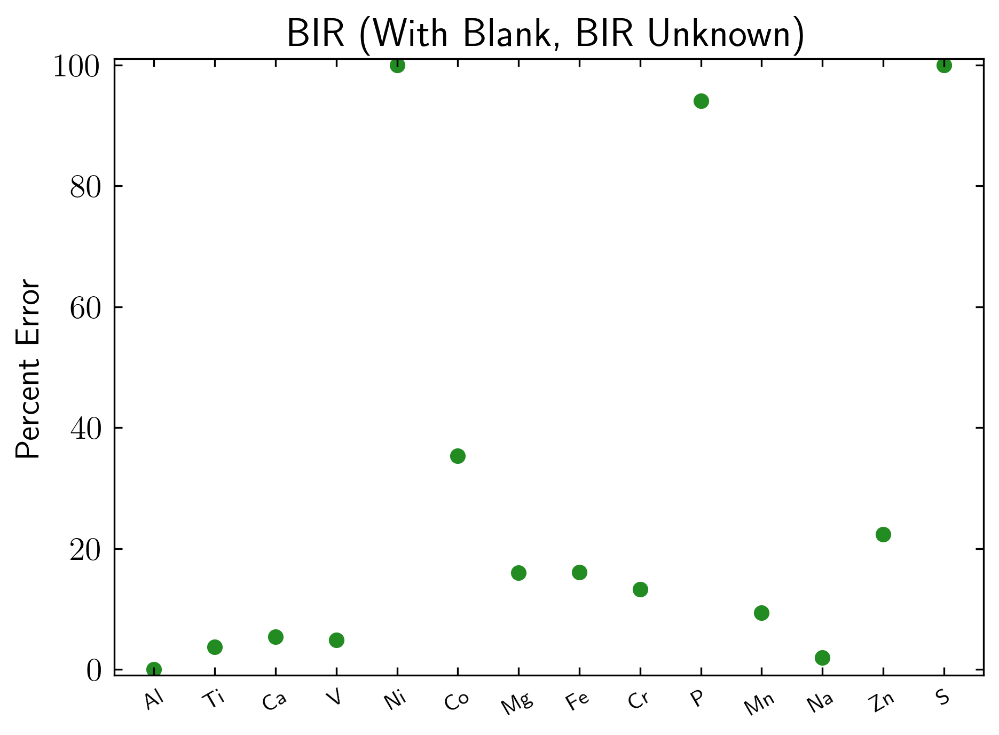

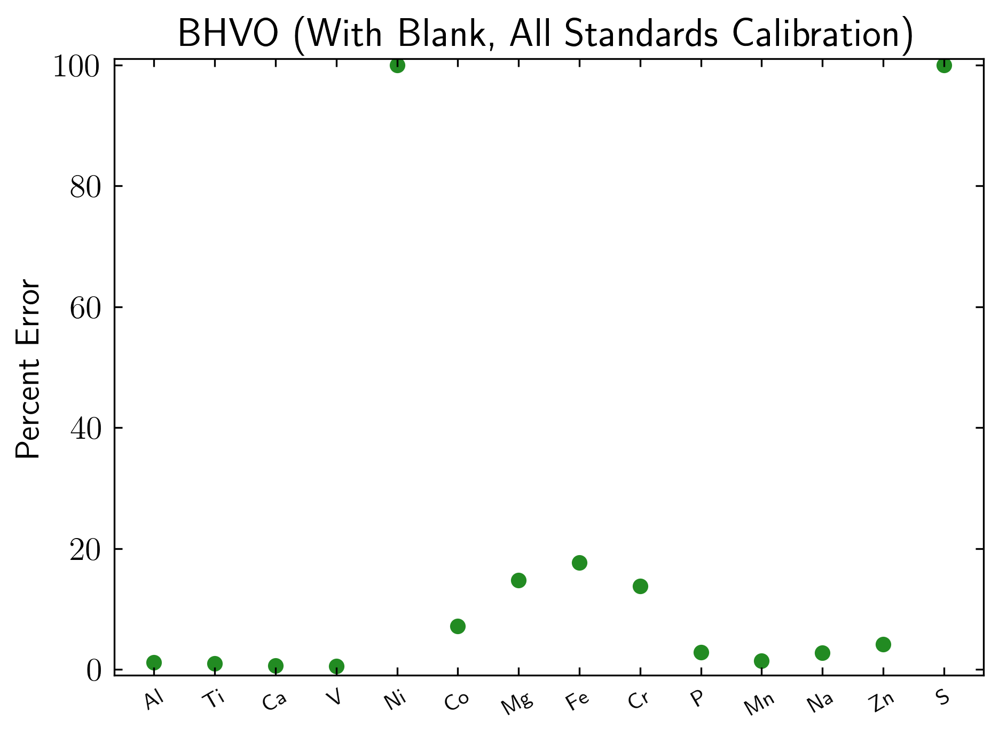

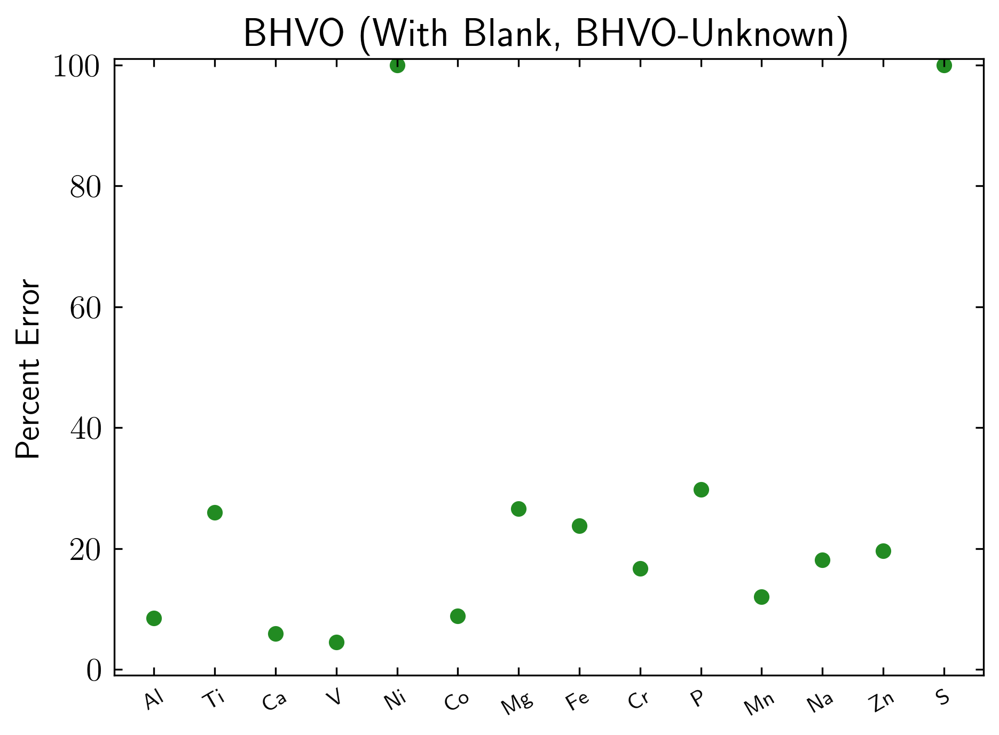

In [28]:

perc_err_plot(SampleConcentrations_wblank, StdData, 'BIR', 'BIR (With Blank, BIR Unknown)')
perc_err_plot(SampleConcentrations_wblank_all, StdData, 'BHVO', 'BHVO (With Blank, All Standards Calibration)')
perc_err_plot(SampleConcentrations_wblank_BHVO, StdData, 'BHVO', 'BHVO (With Blank, BHVO-Unknown)')


### Plot Unheated Murchison Values vs. Braukmuller

In [29]:
# Data from Braukmuller for Unheated Murchison:

data_B_Murch = {'Na23': [875], 'Mg26': [121196], 'Al27': [11438], 'P31': [996], 'Ca43': [11759], 'Ti47': [564], 'V51': [68.6], 'Cr52':[3202], 'Mn55': [1761], 'Fe57':[218752], 'Co59':[600], 'Zn66':[192], 'Ni61': [12944], 'S32':[24536] }
df_B_Murch = pd.DataFrame(data=data_B_Murch)


data_B_MurchNC = {'Na23': [871], 'Mg26': [123113], 'Al27': [12091], 'P31': [1108], 'Ca43': [11525], 'Ti47': [579], 'V51': [70.2], 'Cr52':[3300], 'Mn55': [1860], 'Fe57':[226411], 'Co59':[612], 'Zn66':[201], 'Ni61':[13376], 'S32':[26347] }
df_B_MurchNC = pd.DataFrame(data=data_B_MurchNC)

B_Murch_Unc = calc_unc(df_B_Murch, df_B_MurchNC)
B_Murch_Std = calc_std(df_B_Murch, df_B_MurchNC)
df_B_MurchAvg = (df_B_Murch+df_B_MurchNC)/2.0




In [30]:
M_UH_std = calc_std(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'])
M_UH_unc = calc_unc(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'])

print(df_B_MurchAvg)
print(B_Murch_Unc)

print((SampleConcentrations_wblank['M_UH_1']+SampleConcentrations_wblank['M_UH_2'])/2)
print(calc_unc(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2']))

    Na23      Mg26     Al27     P31     Ca43   Ti47   V51    Cr52    Mn55  \
0  873.0  122154.5  11764.5  1052.0  11642.0  571.5  69.4  3251.0  1810.5   

       Fe57   Co59   Zn66     Ni61      S32  
0  222581.5  606.0  196.5  13160.0  25441.5  
     Na23       Mg26      Al27      P31        S32      Ca43    Ti47      V51  \
0  25.412  12178.701  4148.509  711.536  11505.283  1486.602  95.295  10.1648   

      Cr52     Mn55       Fe57    Co59      Ni61    Zn66  
0  622.594  628.947  48657.627  76.236  2744.496  57.177  
Na23           591.330605
Mg26        103087.790304
Al27          7034.132745
P31            940.456399
S32          30443.632352
Ca43          8238.307509
Ti47             0.000000
V51             46.673272
Cr52          2093.427045
Mn55          1438.355169
Fe57        249877.264500
Co59           612.749334
Ni61         13404.218384
Zn66           185.215112
In115                 NaN
K39_HR       11417.935720
In115_HR         2.122187
dtype: float64
         Na23  

In [31]:
print(df_B_MurchAvg)

print(StdData)

    Na23      Mg26     Al27     P31     Ca43   Ti47   V51    Cr52    Mn55  \
0  873.0  122154.5  11764.5  1052.0  11642.0  571.5  69.4  3251.0  1810.5   

       Fe57   Co59   Zn66     Ni61      S32  
0  222581.5  606.0  196.5  13160.0  25441.5  
              BIR       WPR       WMS      BCR     BHVO
Sample      BIR_S     WPR_R     WMS_Q    BCR_P   BHVO_O
Na23      13590.9     500.0     329.0  23146.1  16461.9
Mg26      58428.7  152200.0    3310.0  21703.5  43762.7
Al27      82088.4   26210.0   13500.0  71344.4  71132.7
P31         130.9     303.0     180.0   1568.1   1171.8
S32            70     17680    281700      318      164
Ca43      94983.1   25280.0   30900.0  50843.5  81475.3
Ti47       5746.0    3527.0     840.0  13575.3  16368.2
V51         320.6     135.0     140.0    417.6    318.2
Cr52        392.9    3220.0      68.0    15.85    287.2
Mn55       1340.6    1380.0     600.0   1522.6   1308.8
Fe57      79735.1  113400.0  454000.0  96311.6  86659.5
Co59        52.22     213

In [32]:
def plot_compare_norm(file1, file2, file3, file4, title, title2):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare,Y_compare):
        avg = (file1[i]+file2[i])/2.0
        avg2 = (file3[i]+file4[i])/2.0
        plt.scatter(j, avg/avg2, color='darkviolet')
    plt.axhline(y=1.0, ls='--', color='gray')
    #plt.yscale('log')
    ax.set_xticks(Y_compare)
    ax.set_xticklabels(X_compare_names, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylim(0, 2)
    plt.title(title)
    plt.ylabel('Calculated/Published Concentration')
    plt.savefig(title2, dpi=1000)
    
def plot_compare_norm_update(file1, file2, file3, file4, title, title2):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare_up,Y_compare_up):
        avg = (file1[i]+file2[i])/2.0
        avg2 = (file3[i]+file4[i])/2.0
        plt.scatter(j, avg/avg2, color='darkviolet')
    plt.axhline(y=1.0, ls='--', color='gray')
    #plt.yscale('log')
    ax.set_xticks(Y_compare_up)
    ax.set_xticklabels(X_compare_names_up, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylim(0, 2)
    plt.title(title)
    plt.ylabel('Calculated/Published Concentration')
    plt.savefig(title2, dpi=1000)
    
def plot_compare_norm_update_withunc(file1, file2, file3, file4, fileunc_1, fileunc_2, title, title2):
    fig, ax = plt.subplots()
    for (i,j) in zip(X_compare_up,Y_compare_up):
        avg = (file1[i]+file2[i])/2.0
        avg2 = (file3[i]+file4[i])/2.0
        plt.scatter(j, avg/avg2, color='darkviolet')
        plt.errorbar(j, avg/avg2, yerr=(avg/avg2)*np.sqrt((fileunc_1[i]/avg)**2+(fileunc_2[i]/avg2)**2), alpha=0.5, color='darkviolet')
    plt.axhline(y=1.0, ls='--', color='gray')
    #plt.yscale('log')
    ax.set_xticks(Y_compare_up)
    ax.set_xticklabels(X_compare_names_up, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.ylim(0, 2)
    plt.title(title)
    plt.ylabel('Calculated/Published Concentration')
    plt.savefig(title2, dpi=1000)

In [33]:
print(M_UH_unc)

         Na23          Mg26         Al27         P31           S32  \
0  106.977484  46113.385359  4116.671129  465.435039  16112.944241   

          Ca43  Ti47        V51        Cr52        Mn55          Fe57  \
0  4090.851918   0.0  16.618131  832.613607  572.056764  93665.709279   

        Co59         Ni61       Zn66  
0  290.19119  6798.851187  85.431679  


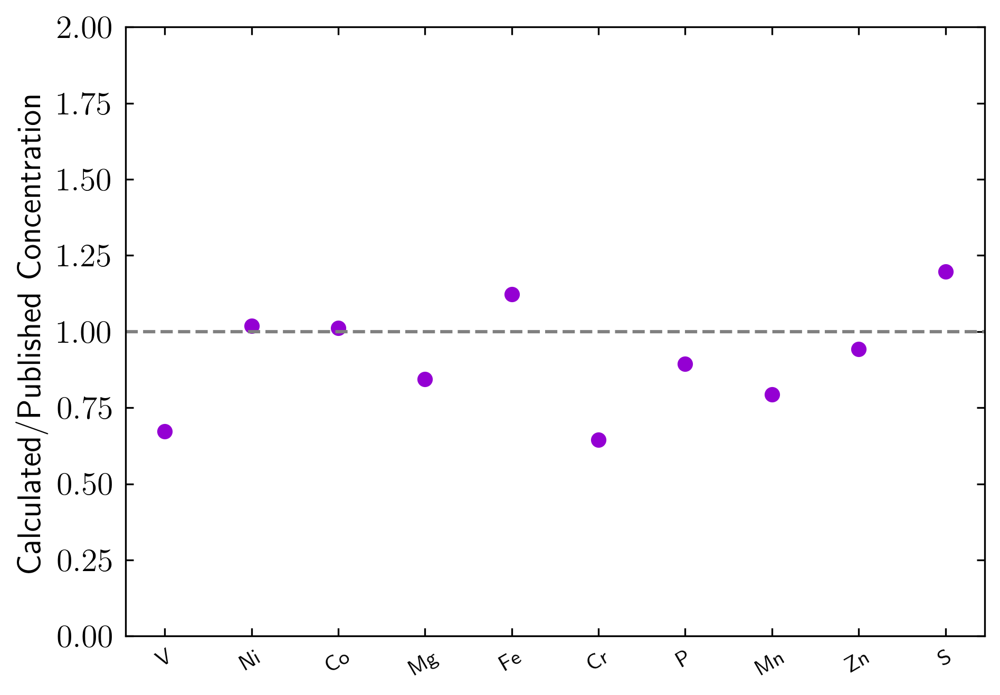

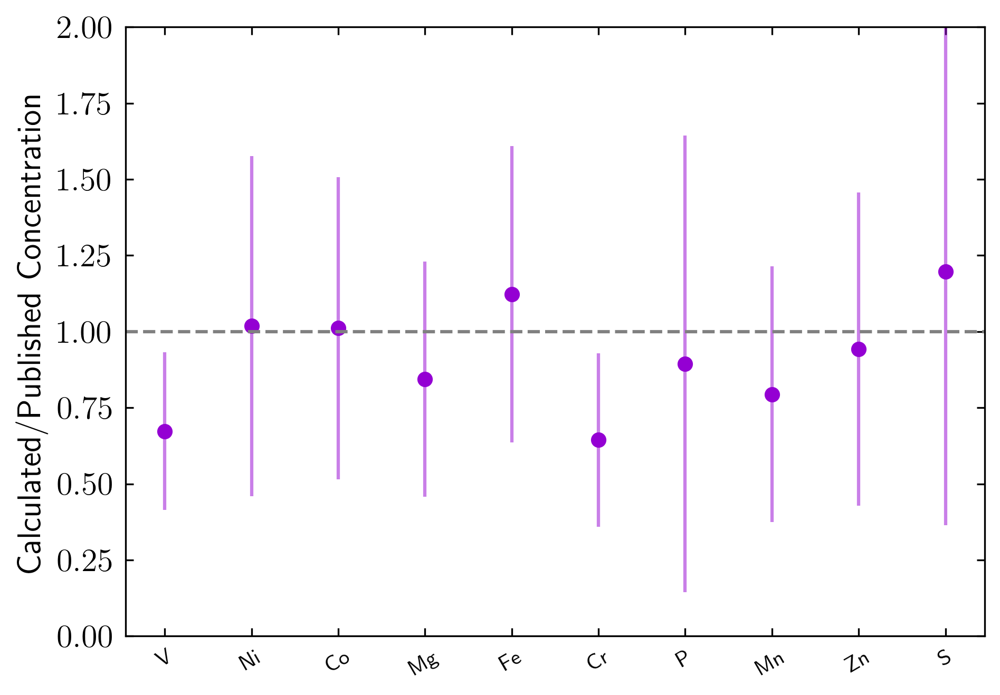

In [34]:
plot_compare_norm_update(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'], df_B_Murch, df_B_MurchNC, '', 'MUH_BIRUnknown_wBlank_update.jpg')
plot_compare_norm_update_withunc(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'], df_B_Murch, df_B_MurchNC, M_UH_unc, B_Murch_Unc, '', 'MUH_BIRUnknown_wBlank_update_withunc.jpg')




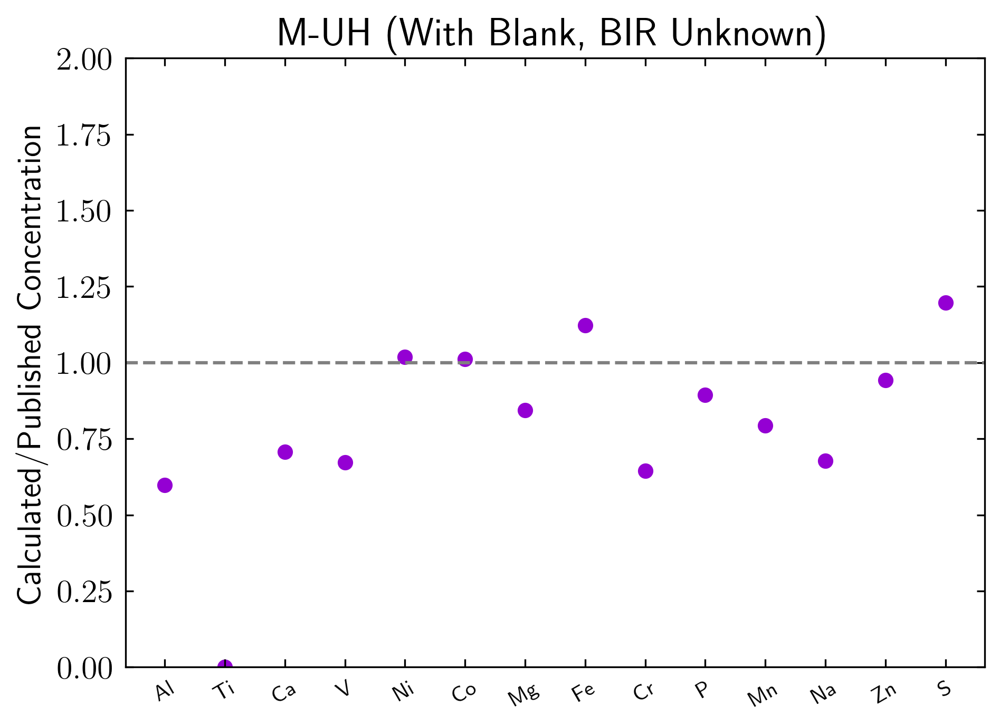

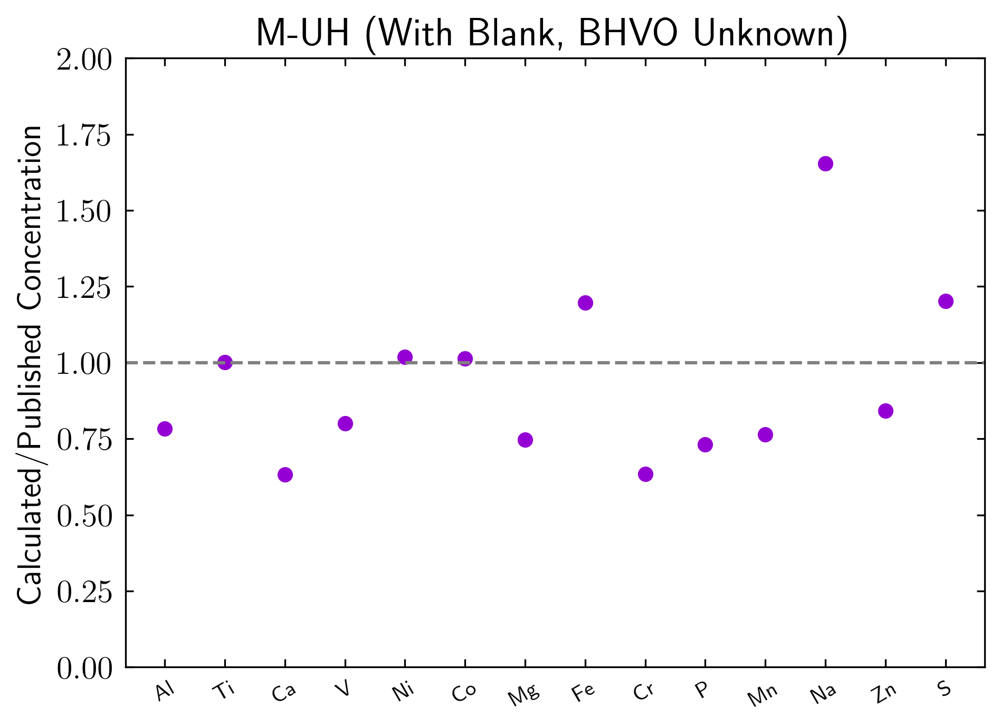

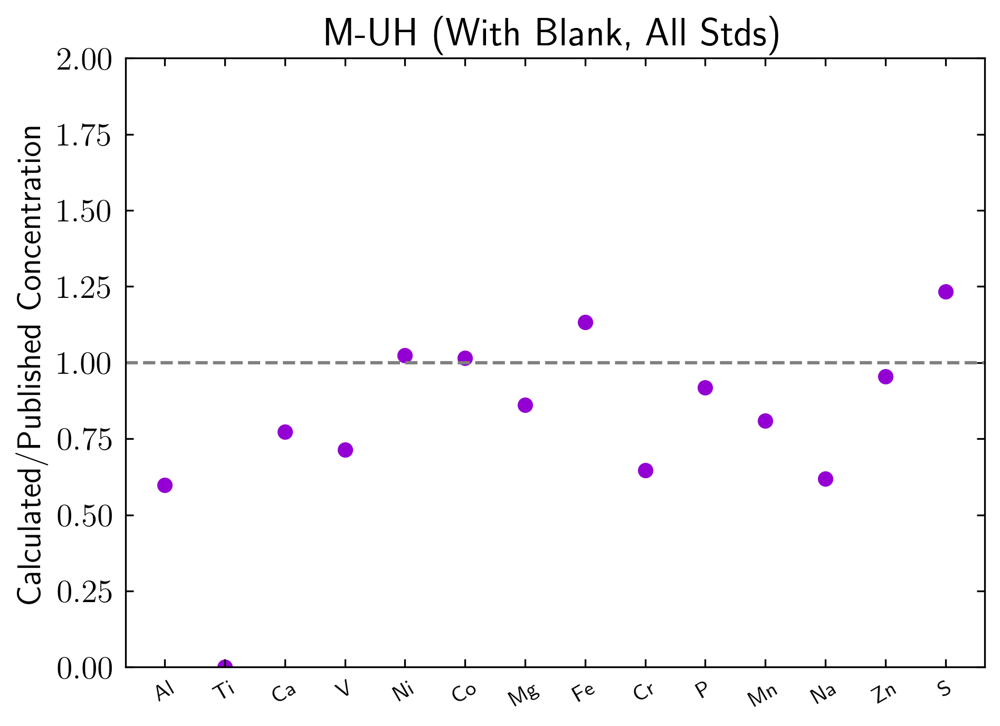

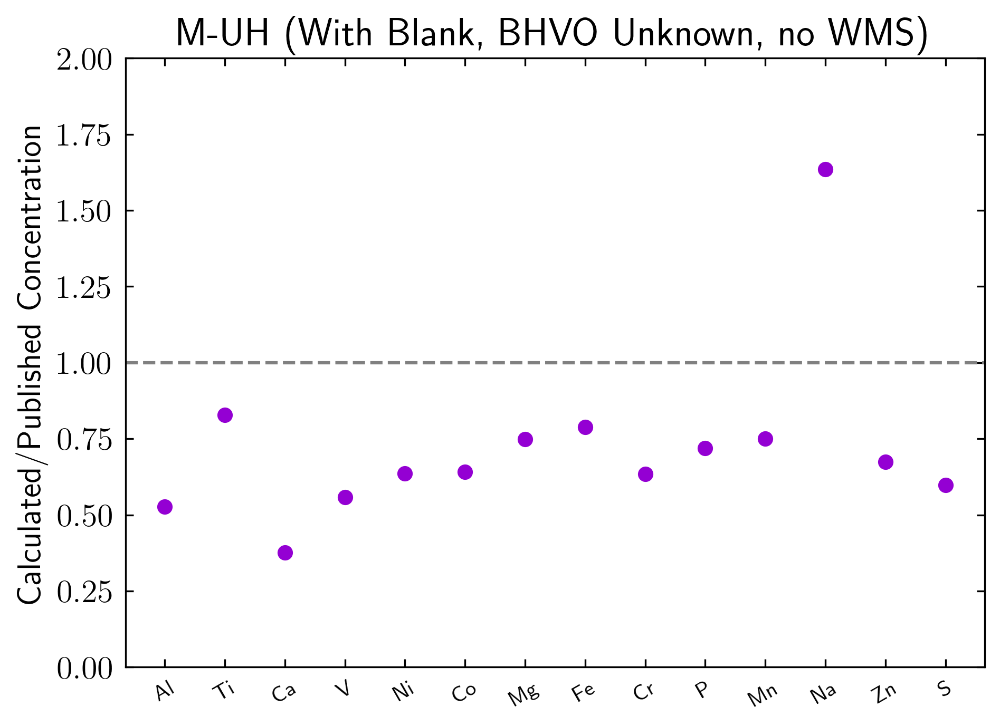

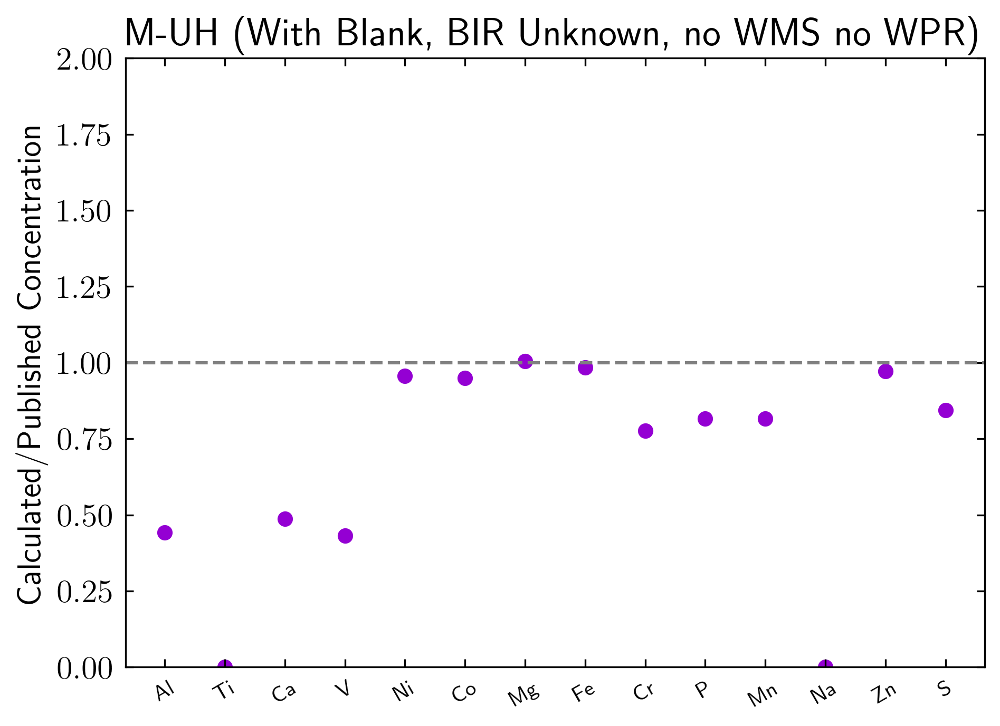

In [35]:
plot_compare_norm(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'], df_B_Murch, df_B_MurchNC, 'M-UH (With Blank, BIR Unknown)', 'MUH_BIRUnknown_wBlank.jpg')
plot_compare_norm(SampleConcentrations_wblank_BHVO['M_UH_1'], SampleConcentrations_wblank_BHVO['M_UH_2'], df_B_Murch, df_B_MurchNC, 'M-UH (With Blank, BHVO Unknown)', 'MUH_BHVOUnknown_wBlank.jpg')
plot_compare_norm(SampleConcentrations_wblank_all['M_UH_1'], SampleConcentrations_wblank_all['M_UH_2'], df_B_Murch, df_B_MurchNC, 'M-UH (With Blank, All Stds)', 'MUH_AllStds_wBlank.jpg')
plot_compare_norm(SampleConcentrations_wblank_noWMS['M_UH_1'], SampleConcentrations_wblank_noWMS['M_UH_2'], df_B_Murch, df_B_MurchNC, 'M-UH (With Blank, BHVO Unknown, no WMS)', 'MUH_BHVOUnknown_wBlank_noWMS.jpg')
plot_compare_norm(SampleConcentrations_wblank_noW['M_UH_1'], SampleConcentrations_wblank_noW['M_UH_2'], df_B_Murch, df_B_MurchNC, 'M-UH (With Blank, BIR Unknown, no WMS no WPR)', 'MUH_BIRUnknown_wBlank_noW.jpg')



### Calculate % Error Between Our Unheated Murchison and Braukmuller

In [36]:
#Calculate % Error:


print('Blank-Included, BIR-Unknown Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank['M_UH_1'][i]+SampleConcentrations_wblank['M_UH_2'][i])/2.0), '%')
print('')
print('Blank-Included, BHVO-Unknown Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank_BHVO['M_UH_1'][i]+SampleConcentrations_wblank_BHVO['M_UH_2'][i])/2.0), '%')
print('')
print('Blank-Included, All Standards Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank_all['M_UH_1'][i]+SampleConcentrations_wblank_all['M_UH_2'][i])/2.0), '%')
print('')

print('Blank-Included, BHVO-Unknown, No WMS Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank_noWMS['M_UH_1'][i]+SampleConcentrations_wblank_noWMS['M_UH_2'][i])/2.0), '%')
print('')

print('Blank-Included, BCR-Unknown, No WMS Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank_BCRnoWMS['M_UH_1'][i]+SampleConcentrations_wblank_BCRnoWMS['M_UH_2'][i])/2.0), '%')
print('')

print('Blank-Included, BIR-Unknown, No WMS No WPR Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank_noW['M_UH_1'][i]+SampleConcentrations_wblank_noW['M_UH_2'][i])/2.0), '%')
print('')

print('Blank-Included, BIR-Unknown, No WMS Calibration:')
for i in X_compare:
    print(i, calc_percerr(df_B_MurchAvg[i], (SampleConcentrations_wblank_BIRnoWMS['M_UH_1'][i]+SampleConcentrations_wblank_BIRnoWMS['M_UH_2'][i])/2.0), '%')
print('')

Blank-Included, BIR-Unknown Calibration:
Al27 0    40.208825
Name: Al27, dtype: float64 %
Ti47 0    100.0
Name: Ti47, dtype: float64 %
Ca43 0    29.236321
Name: Ca43, dtype: float64 %
V51 0    32.747446
Name: V51, dtype: float64 %
Ni61 0    1.855763
Name: Ni61, dtype: float64 %
Co59 0    1.113751
Name: Co59, dtype: float64 %
Mg26 0    15.608684
Name: Mg26, dtype: float64 %
Fe57 0    12.263267
Name: Fe57, dtype: float64 %
Cr52 0    35.606673
Name: Cr52, dtype: float64 %
P31 0    10.603004
Name: P31, dtype: float64 %
Mn55 0    20.55481
Name: Mn55, dtype: float64 %
Na23 0    32.264536
Name: Na23, dtype: float64 %
Zn66 0    5.742945
Name: Zn66, dtype: float64 %
S32 0    19.661311
Name: S32, dtype: float64 %

Blank-Included, BHVO-Unknown Calibration:
Al27 0    21.71631
Name: Al27, dtype: float64 %
Ti47 0    0.168445
Name: Ti47, dtype: float64 %
Ca43 0    36.674541
Name: Ca43, dtype: float64 %
V51 0    19.954479
Name: V51, dtype: float64 %
Ni61 0    1.833405
Name: Ni61, dtype: float64 %
Co59

In [37]:
M_UH_wblank_unc = calc_unc(SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'])
print(M_UH_wblank_unc)

         Na23          Mg26         Al27         P31           S32  \
0  106.977484  46113.385359  4116.671129  465.435039  16112.944241   

          Ca43  Ti47        V51        Cr52        Mn55          Fe57  \
0  4090.851918   0.0  16.618131  832.613607  572.056764  93665.709279   

        Co59         Ni61       Zn66  
0  290.19119  6798.851187  85.431679  


## Heating Experiments Results

In [38]:
#Organize Arrays for Plotting:

def results_dataframe_atm(data):
    UH_avg = (data['M_UH_1']+data['M_UH_2'])/2.0
    Avg1000 = (data['M_1000_1']+data['M_1000_2'])/2.0
    Avg800 = (data['M_800_1']+data['M_800_2'])/2.0
    Avg600 = (data['M_600_1']+data['M_600_2'])/2.0
    Avg400 = (data['M_400_1']+data['M_400_2'])/2.0
    d = {'UH': UH_avg, '400': Avg400, '600': Avg600, '800': Avg800, '1000':Avg1000}
    Data_Avg = pd.DataFrame(data=d)
    Samples_Data = Data_Avg.T
    return Samples_Data

def results_dataframe_vac(data, UH1, UH2):
    UH_avg = (data['M_UH_1']+data['M_UH_2'])/2.0
    M1000 = data['M_1000_3']
    M800 = data['M_800_3']
    M600 = data['M_600_3']
    M400 = data['M_400_3']
    d = {'UH': UH_avg, '400': M400, '600': M600, '800': M800, '1000':M1000}
    Data_Avg = pd.DataFrame(data=d)
    Samples_Data = Data_Avg.T
    return Samples_Data

In [39]:

SC_blank_BHVOu_atm = results_dataframe_atm(SampleConcentrations_wblank_BHVO)
SC_blank_all_atm = results_dataframe_atm(SampleConcentrations_wblank_all)
SC_blank_atm = results_dataframe_atm(SampleConcentrations_wblank)
SC_blank_noW_atm = results_dataframe_atm(SampleConcentrations_wblank_noW) #BIR unknown, no WMS no WPR
SC_blank_BIRnoWMS_atm = results_dataframe_atm(SampleConcentrations_wblank_BIRnoWMS) #BIR unknown, no WMS 
SC_blank_noWMS_atm = results_dataframe_atm(SampleConcentrations_wblank_noWMS) #BHVO unknown, no WMS 
SC_blank_BCRnoWMS_atm = results_dataframe_atm(SampleConcentrations_wblank_BCRnoWMS) #BCR unknown, no WMS 



SC_blank_BHVOu_vac = results_dataframe_vac(SampleConcentrations_wblank_BHVO, SampleConcentrations_wblank_BHVO['M_UH_1'], SampleConcentrations_wblank_BHVO['M_UH_2'])
SC_blank_all_vac = results_dataframe_vac(SampleConcentrations_wblank_all, SampleConcentrations_wblank_all['M_UH_1'], SampleConcentrations_wblank_all['M_UH_2'])
SC_blank_vac = results_dataframe_vac(SampleConcentrations_wblank, SampleConcentrations_wblank['M_UH_1'], SampleConcentrations_wblank['M_UH_2'])
SC_blank_noW_vac = results_dataframe_vac(SampleConcentrations_wblank_noW, SampleConcentrations_wblank_noW['M_UH_1'], SampleConcentrations_wblank_noW['M_UH_2'])
SC_blank_BIRnoWMS_vac = results_dataframe_vac(SampleConcentrations_wblank_BIRnoWMS, SampleConcentrations_wblank_BIRnoWMS['M_UH_1'], SampleConcentrations_wblank_BIRnoWMS['M_UH_2'])
SC_blank_noWMS_vac = results_dataframe_vac(SampleConcentrations_wblank_noWMS, SampleConcentrations_wblank_noWMS['M_UH_1'], SampleConcentrations_wblank_noWMS['M_UH_2'])
SC_blank_BCRnoWMS_vac = results_dataframe_vac(SampleConcentrations_wblank_BCRnoWMS, SampleConcentrations_wblank_BCRnoWMS['M_UH_1'], SampleConcentrations_wblank_BCRnoWMS['M_UH_2'])




### Plot Results

In [40]:
X_axis = ['Unheated', '400 C', '600 C', '800 C', '1000 C']

def plot_results(file, title, savetitle, yupperlim):
    fig, ax = plt.subplots()
    #plt.plot(list(range(1,6)), file.Al27, '.-', alpha=0.7, color='black', label='Al')
    #plt.plot(list(range(1,6)), file.Ti47, '.-', alpha=0.7, color='darkgrey', label='Ti')
    #plt.plot(list(range(1,6)), file.Ca43, '.-', alpha=0.7, color='#a6bddb', label='Ca')
    plt.plot(list(range(1,6)), file.V51, '.-', alpha=0.7, color='#67a9cf', label='V')
    plt.plot(list(range(1,6)), file.Ni61, '.-', alpha=0.7, color='#3690c0', label='Ni')
    plt.plot(list(range(1,6)), file.Co59, '.-', alpha=0.7, color='#02818a', label='Co')
    plt.plot(list(range(1,6)), file.Mg26, '.-', alpha=0.7, color='#016c59', label='Mg')
    plt.plot(list(range(1,6)), file.Fe57, '.-', alpha=0.7, color='#014636', label='Fe')
    plt.plot(list(range(1,6)), file.Cr52, '.-', alpha=0.7, color='dodgerblue', label='Cr')
    plt.plot(list(range(1,6)), file.P31, '.-', alpha=0.7, color='navy', label='P')
    plt.plot(list(range(1,6)), file.Mn55, '.-', alpha=0.7, color='forestgreen', label='Mn')
    #plt.plot(list(range(1,6)), file.Na23, '-o', alpha=0.7, color='fuchsia', label='Na')
    plt.plot(list(range(1,6)), file.Zn66, '-o', alpha=0.7, color='#dd3497', label='Zn')
    plt.plot(list(range(1,6)), file.S32, '-o', alpha=0.7, color='#7a0177', label='S')
    ax.tick_params(top=True, right=True)
    plt.yscale('symlog')
    plt.ylim(0,yupperlim)
    ax.set_xticks(list(range(1,6)))
    ax.set_xticklabels(X_axis, rotation=30, fontsize=10)
    plt.ylabel('Concentration (ppm)')
    plt.legend(fontsize='xx-small', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.title(title)
    #plt.savefig(savetitle, dpi=1000, bbox_inches='tight')
    plt.show()

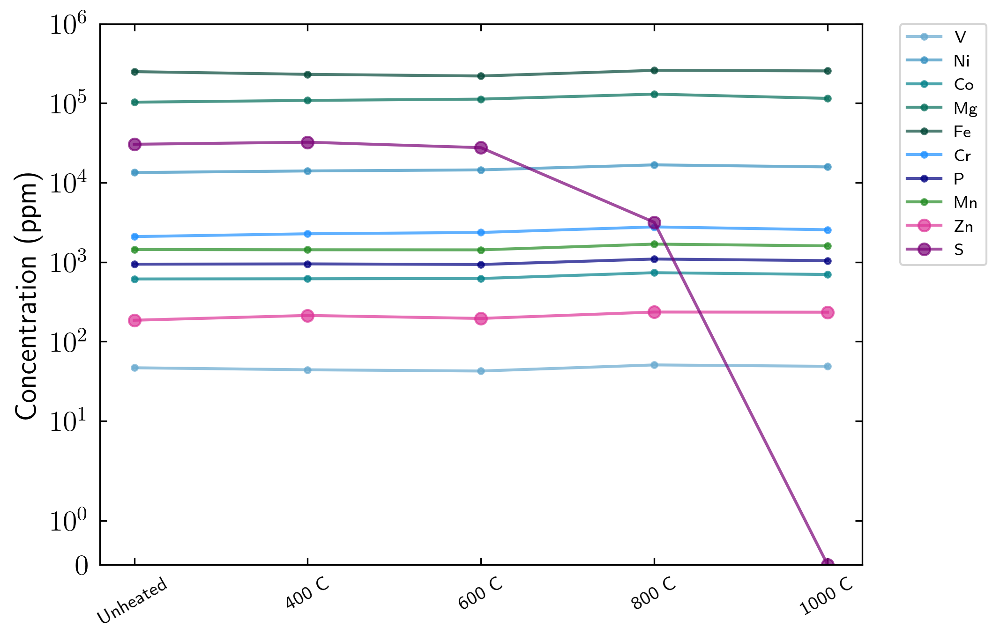

In [41]:
plot_results(SC_blank_atm, '', 'BIRUnknownwithblank_MainResultsAtm_Update.jpg', 1.0e6)


In [42]:
print(SC_blank_atm)

            Na23           Mg26         Al27          P31           S32  \
UH    591.330605  103087.790304  7034.132745   940.456399  30443.632352   
400     0.000000  108566.081758  4173.698930   948.393241  32317.218300   
600     0.000000  112689.627788  2111.900963   932.383623  27584.871549   
800     0.000000  130253.271382  2924.430898  1092.315829   3169.419587   
1000    0.000000  115130.333344  4352.997421  1042.715327      0.000000   

             Ca43  Ti47        V51         Cr52         Mn55           Fe57  \
UH    8238.307509   0.0  46.673272  2093.427045  1438.355169  249877.264500   
400   7594.689576   0.0  44.026500  2271.311750  1428.806450  231128.290882   
600   7443.346824   0.0  42.476343  2360.129097  1424.830867  220255.953757   
800   8507.768976   0.0  50.707420  2772.205999  1684.412557  259403.573245   
1000  8228.527837   0.0  48.700541  2551.978326  1599.166151  255324.658742   

            Co59          Ni61        Zn66  In115        K39_HR  In115_HR 

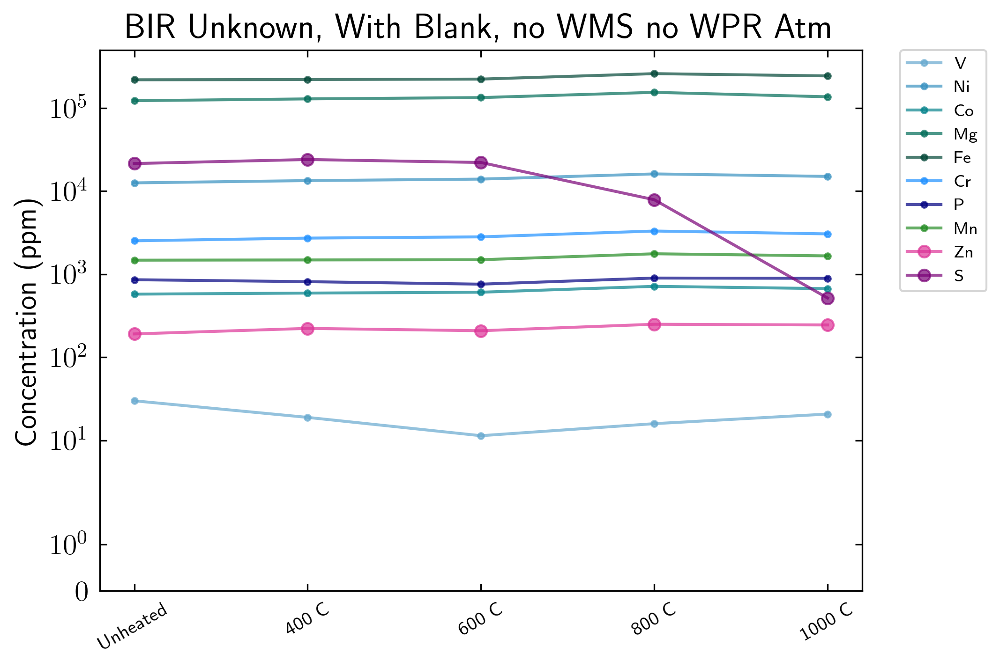

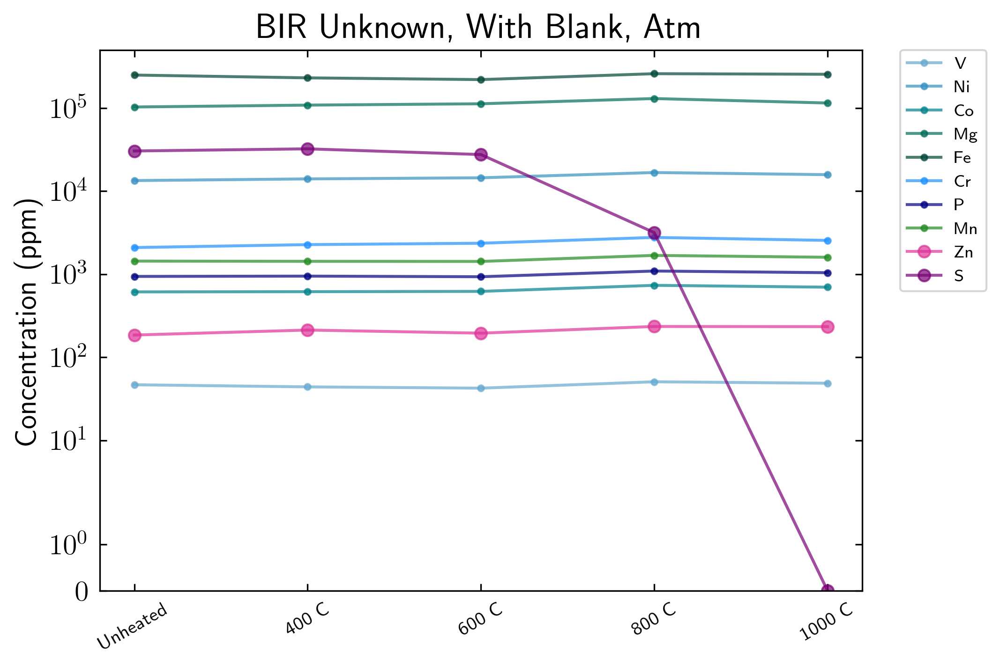

In [43]:
plot_results(SC_blank_noW_atm, 'BIR Unknown, With Blank, no WMS no WPR Atm', 'BIRUnknownnoWMSnoWPR_MainResults.jpg', 5.0e5)

plot_results(SC_blank_atm, 'BIR Unknown, With Blank, Atm', 'BIRUnknownwithblank_MainResults.jpg', 5.0e5)


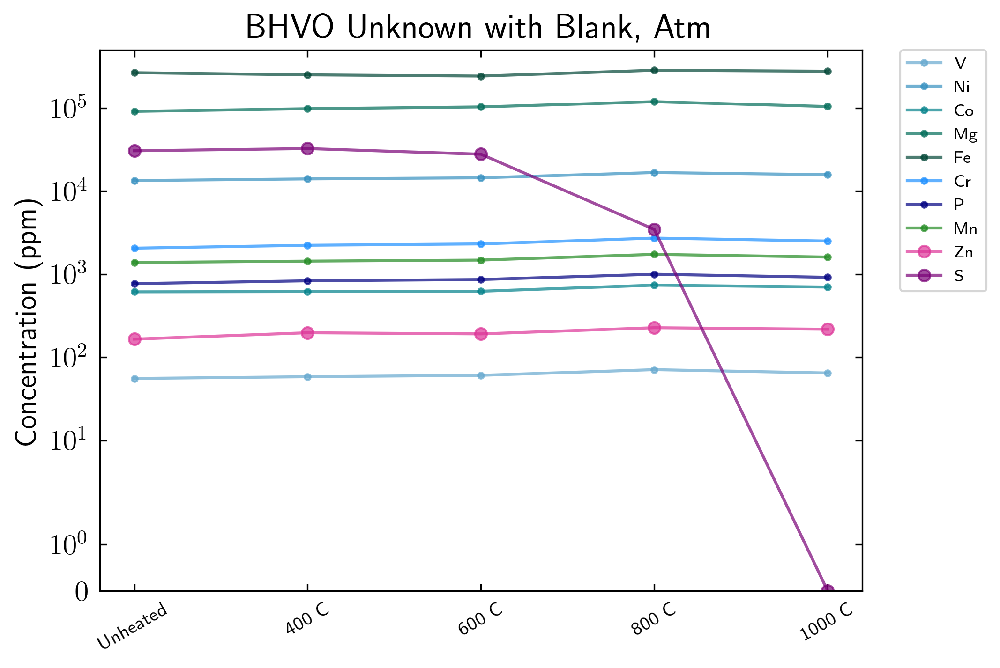

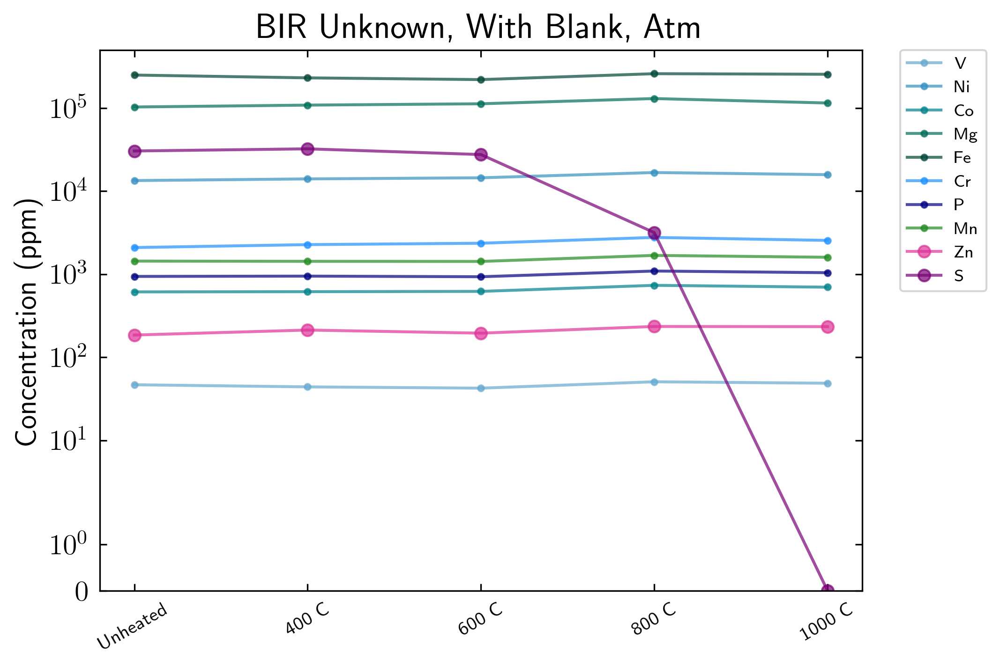

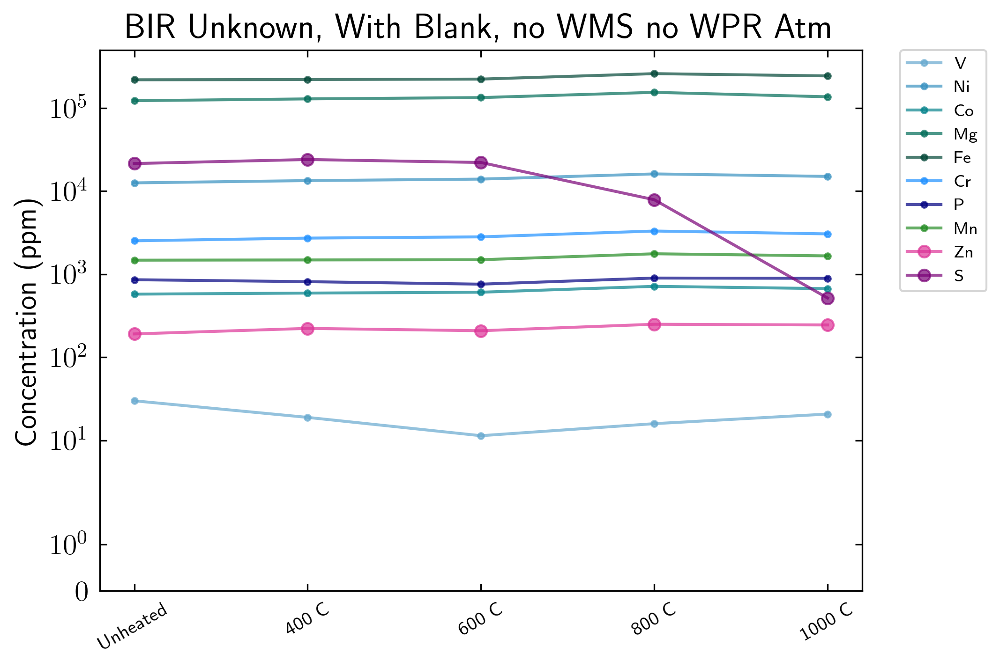

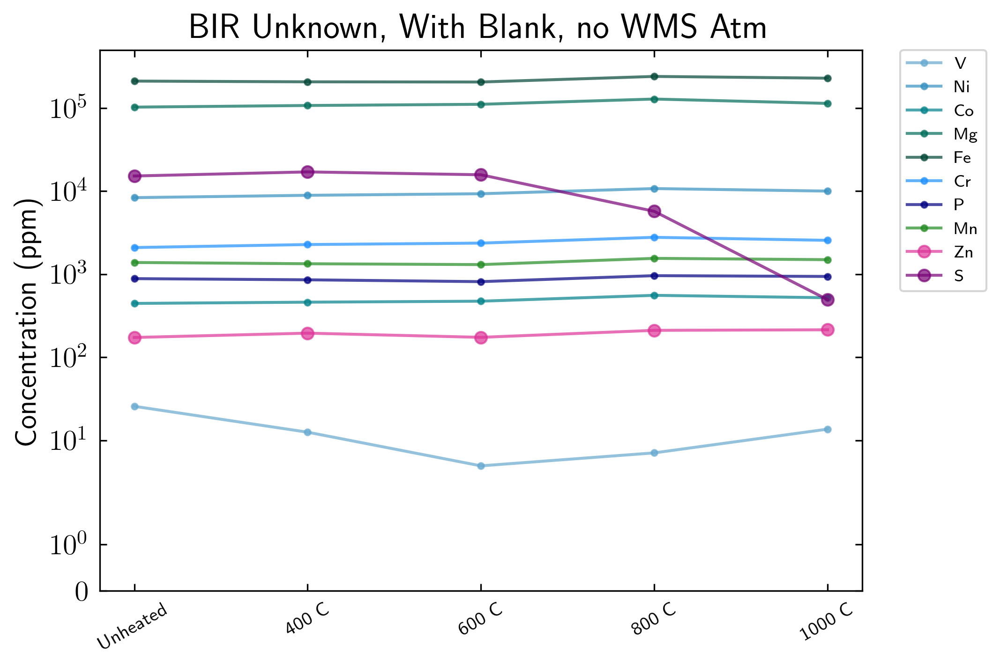

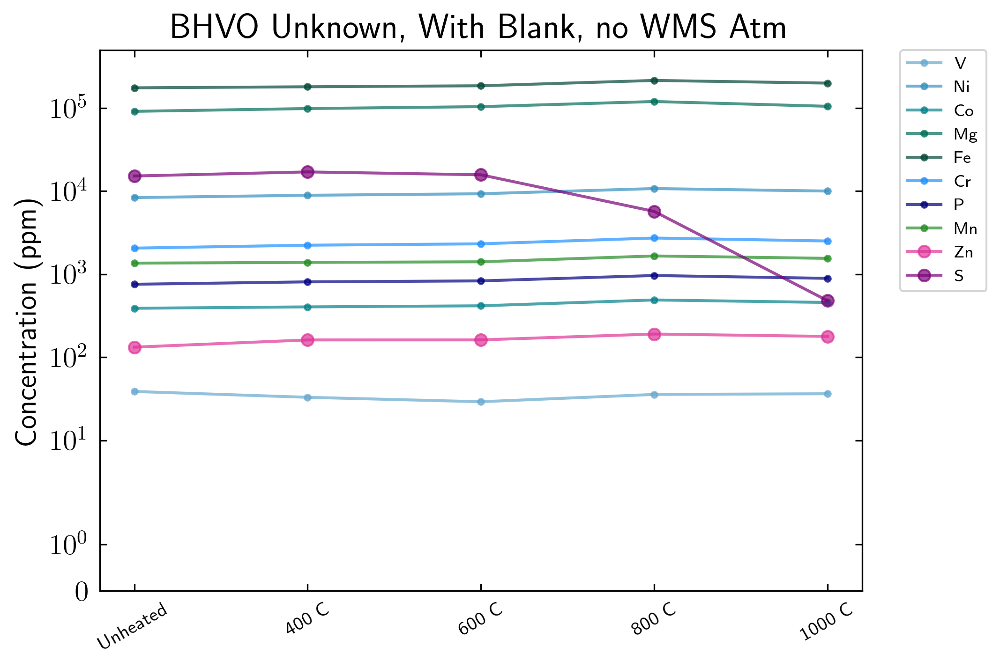

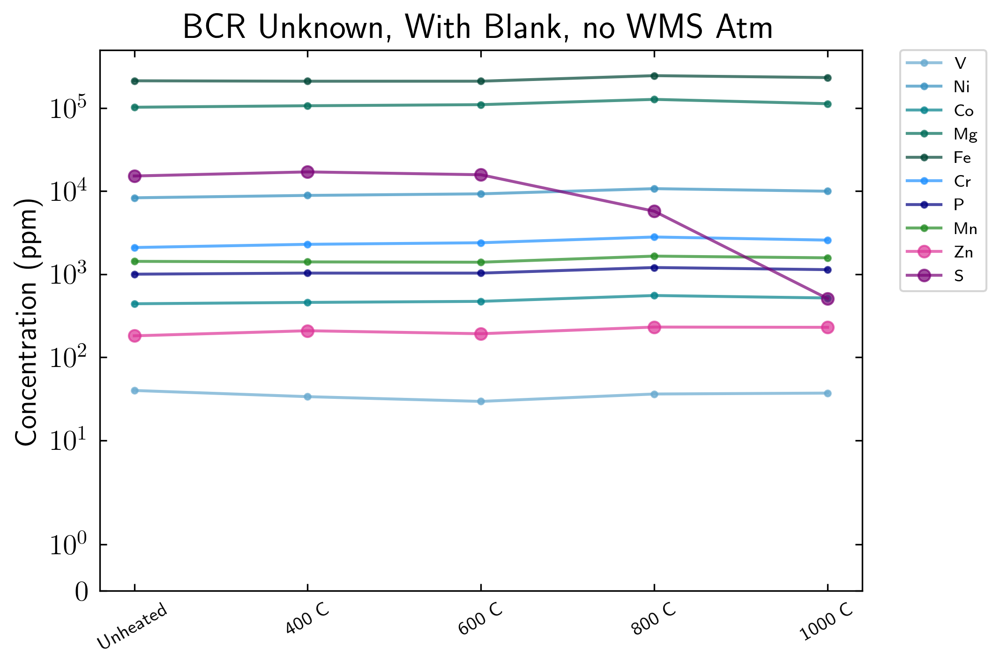

In [44]:
plot_results(SC_blank_BHVOu_atm, 'BHVO Unknown with Blank, Atm', 'BHVOUnknown_wblank_MainResults.jpg', 5.0e5)
plot_results(SC_blank_atm, 'BIR Unknown, With Blank, Atm', 'BIRUnknownwithblank_MainResults.jpg', 5.0e5)
plot_results(SC_blank_noW_atm, 'BIR Unknown, With Blank, no WMS no WPR Atm', 'BIRUnknownnoWMSnoWPR_MainResults.jpg', 5.0e5)
plot_results(SC_blank_BIRnoWMS_atm, 'BIR Unknown, With Blank, no WMS Atm', 'BIRUnknownnoWMS_MainResults.jpg', 5.0e5)
plot_results(SC_blank_noWMS_atm, 'BHVO Unknown, With Blank, no WMS Atm', 'BHVOUnknownnoWMS_MainResults.jpg', 5.0e5)
plot_results(SC_blank_BCRnoWMS_atm, 'BCR Unknown, With Blank, no WMS Atm', 'BCRUnknownnoWMS_MainResults.jpg', 5.0e5)




In [45]:
#Determining which Element has the least variation among the different heating steps:

SC_blank_BHVOu_atm_T = SC_blank_BHVOu_atm.T
print('BHVO Unknown, With Blank, Under Atm:')
print(SC_blank_BHVOu_atm_T['UH']-SC_blank_BHVOu_atm_T['400'])
print('')
print(SC_blank_BHVOu_atm_T['400']-SC_blank_BHVOu_atm_T['600'])
print('')
print(SC_blank_BHVOu_atm_T['600']-SC_blank_BHVOu_atm_T['800'])
print('')
print(SC_blank_BHVOu_atm_T['800']-SC_blank_BHVOu_atm_T['1000'])


BHVO Unknown, With Blank, Under Atm:
Na23          440.483525
Mg26        -6936.038656
Al27         1282.275921
P31           -63.007802
S32         -1942.593446
Ca43         1353.288567
Ti47          -69.000517
V51            -2.777487
Cr52         -171.539952
Mn55          -55.368624
Fe57        15287.462195
Co59           -4.597400
Ni61         -635.347120
Zn66          -31.883684
In115                NaN
K39_HR       8974.380572
In115_HR       -0.402712
dtype: float64

Na23         -61.997122
Mg26       -5128.536770
Al27         940.598295
P31          -29.972177
S32         4680.262640
Ca43         637.903049
Ti47         -49.549529
V51           -2.303681
Cr52         -84.718918
Mn55         -41.963127
Fe57        8322.200500
Co59          -5.512170
Ni61        -435.054210
Zn66           6.180321
In115               NaN
K39_HR      2066.625965
In115_HR      -0.061439
dtype: float64

Na23         -163.030696
Mg26       -15794.137200
Al27        -1362.266896
P31          -136.97321

In [46]:
#Determining which Element has the least variation among the different heating steps:


SC_blank_BHVOu_vac_T = SC_blank_BHVOu_vac.T
print('BHVO Unknown, With Blank, Under Vacuum:')
print(SC_blank_BHVOu_vac_T['UH']-SC_blank_BHVOu_vac_T['400'])
print('')
print(SC_blank_BHVOu_vac_T['400']-SC_blank_BHVOu_vac_T['600'])
print('')
print(SC_blank_BHVOu_vac_T['600']-SC_blank_BHVOu_vac_T['800'])
print('')
print(SC_blank_BHVOu_vac_T['800']-SC_blank_BHVOu_vac_T['1000'])



BHVO Unknown, With Blank, Under Vacuum:
Na23          124.873074
Mg26       -19580.994988
Al27         6366.206273
P31          -154.602549
S32          3836.166812
Ca43         4880.159324
Ti47         -265.349286
V51            -7.833527
Cr52         -348.125608
Mn55          -88.427630
Fe57        74709.489562
Co59          -11.072433
Ni61        -1673.647958
Zn66           -4.973005
In115                NaN
K39_HR      11041.006537
In115_HR        0.521785
dtype: float64

Na23           -2.011801
Mg26        -1589.901751
Al27        -5399.518796
P31           -19.822727
S32         -6001.427225
Ca43        -5031.459407
Ti47           73.263053
V51            -8.281500
Cr52         -224.153045
Mn55         -204.402901
Fe57       -96704.369397
Co59         -115.952331
Ni61        -1485.333784
Zn66           21.683370
In115                NaN
K39_HR          0.000000
In115_HR        0.936068
dtype: float64

Na23          -624.463382
Mg26        -59002.220065
Al27         -1572.231803


In [47]:
print(SC_blank_vac)

            Na23           Mg26         Al27          P31           S32  \
UH    591.330605  103087.790304  7034.132745   940.456399  30443.632352   
400     0.000000  115441.525562     0.000000   836.683175  26330.561678   
600     0.000000  124713.518349  4080.101657  1084.569263  32518.946888   
800     0.000000  186105.500350  1097.921710  1544.210453  25745.563532   
1000    0.000000  325570.133279  5627.098004  2514.697481      0.000000   

              Ca43  Ti47         V51         Cr52         Mn55           Fe57  \
UH     8238.307509   0.0   46.673272  2093.427045  1438.355169  249877.264500   
400    6123.523766   0.0   33.014836  2462.802669  1251.834508  162004.176073   
600    9197.824493   0.0   56.341600  2677.926247  1680.069887  266059.644373   
800   12597.762109   0.0   74.655281  4074.692611  2386.268705  354692.721719   
1000  22991.522591   0.0  136.231251  7263.512459  4313.874201  647735.246182   

             Co59          Ni61        Zn66  In115        K39_

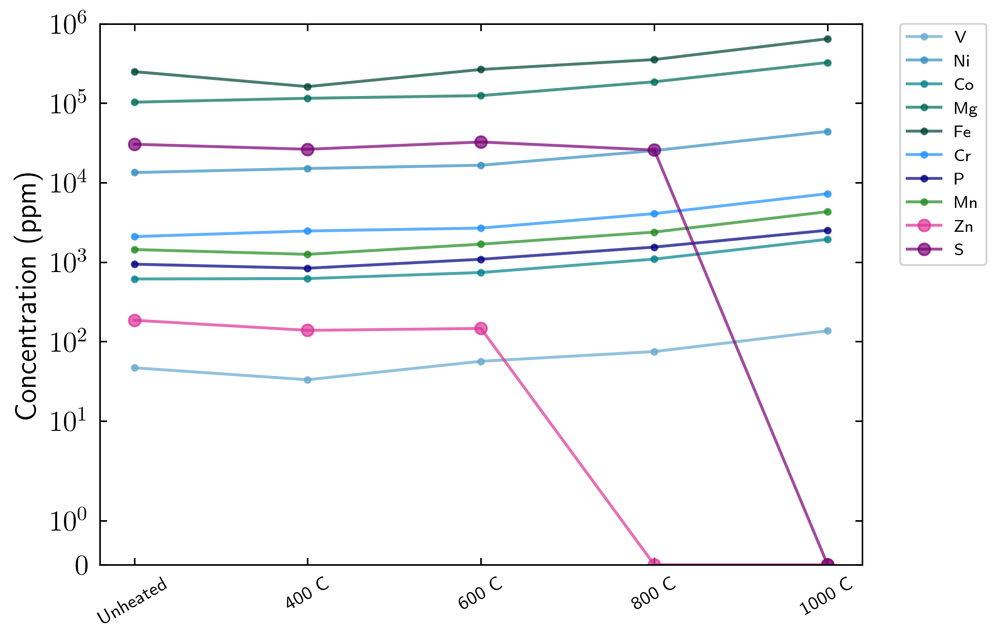

In [48]:
plot_results(SC_blank_vac, '', 'BIRUnknownwithblank_MainResults_VacUpdate.jpg', 1.0e6)


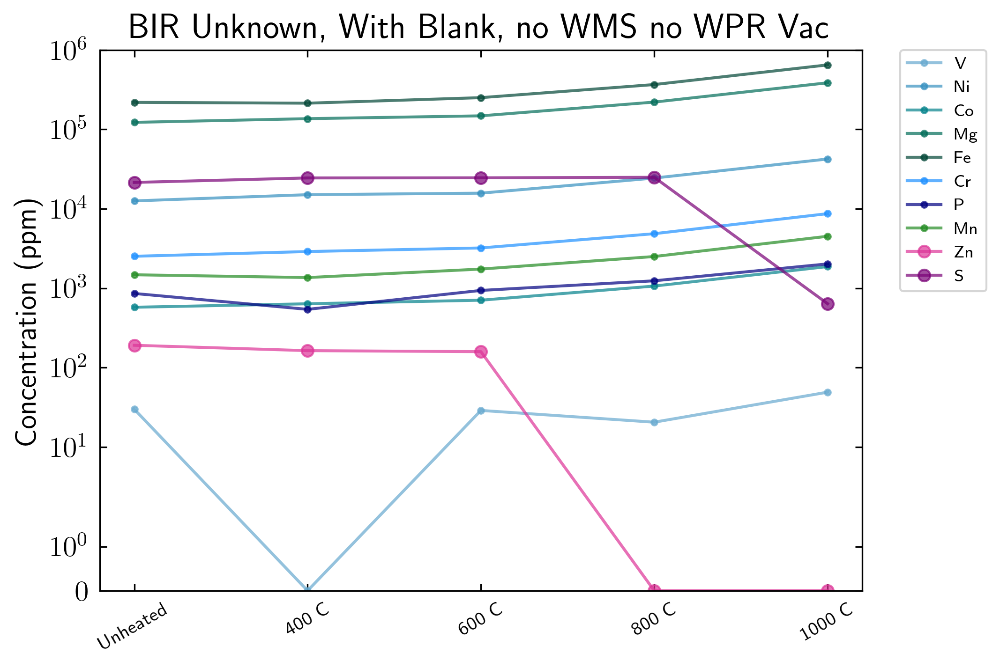

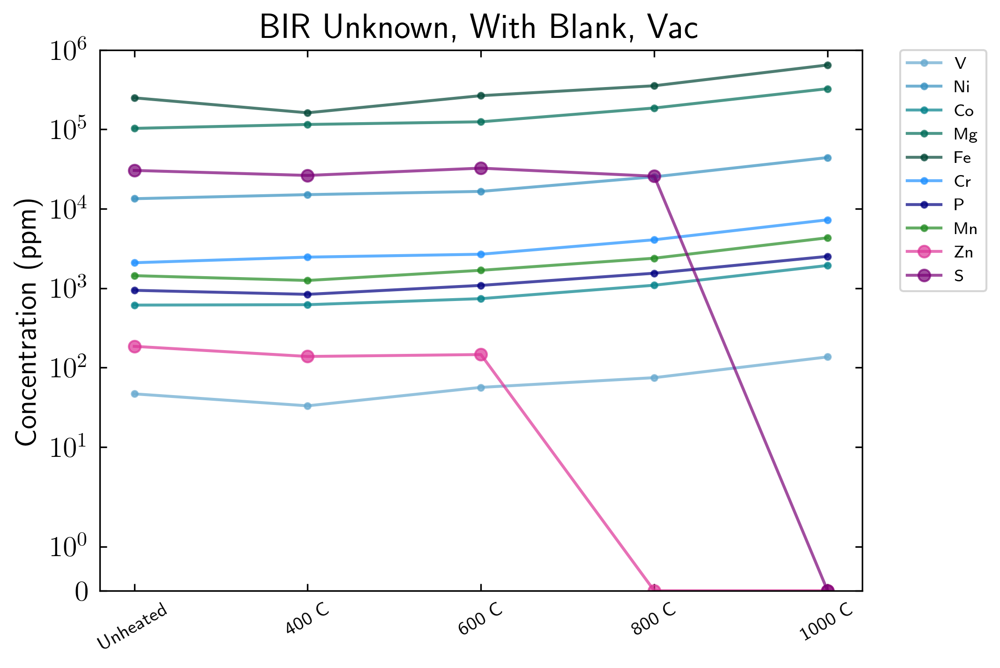

In [49]:
plot_results(SC_blank_noW_vac, 'BIR Unknown, With Blank, no WMS no WPR Vac', 'BIRUnknownnoWMSnoWPR_MainResults_Vac.jpg', 1.0e6)
plot_results(SC_blank_vac, 'BIR Unknown, With Blank, Vac', 'BIRUnknownwithblank_MainResults_Vac.jpg', 1.0e6)


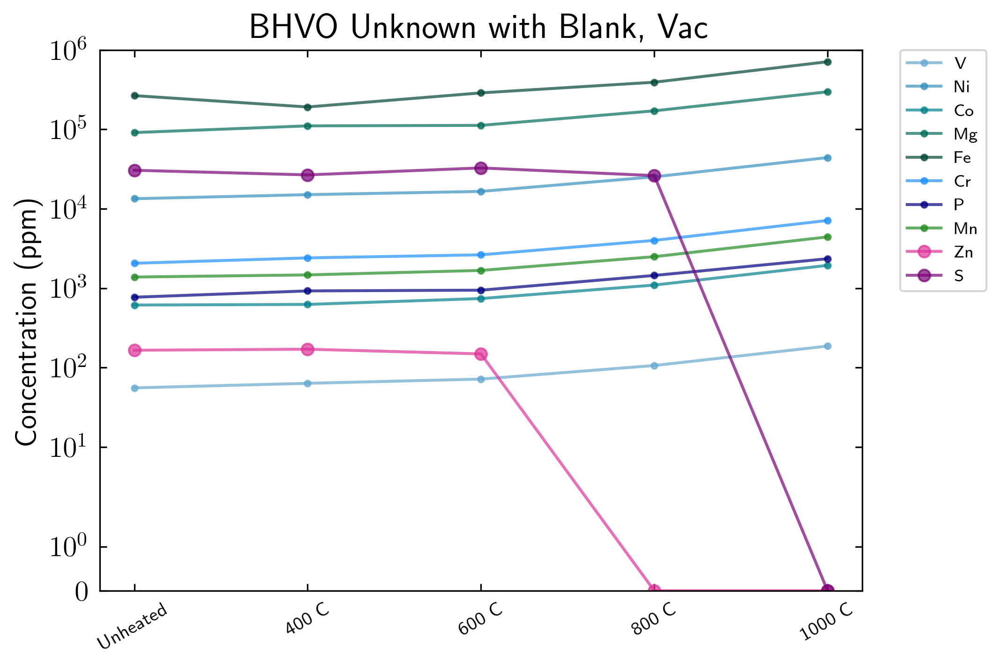

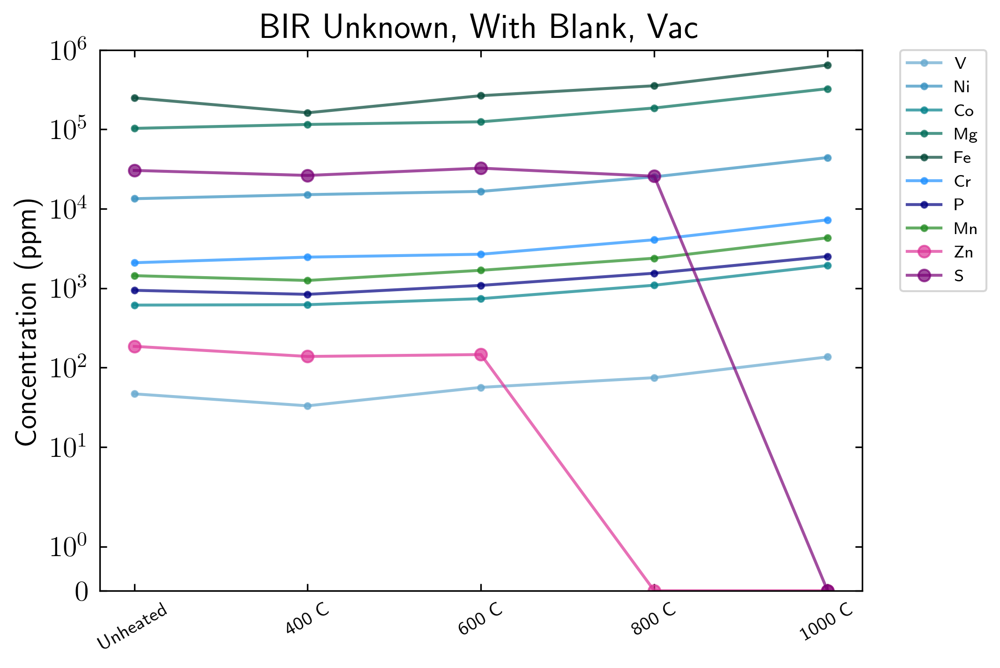

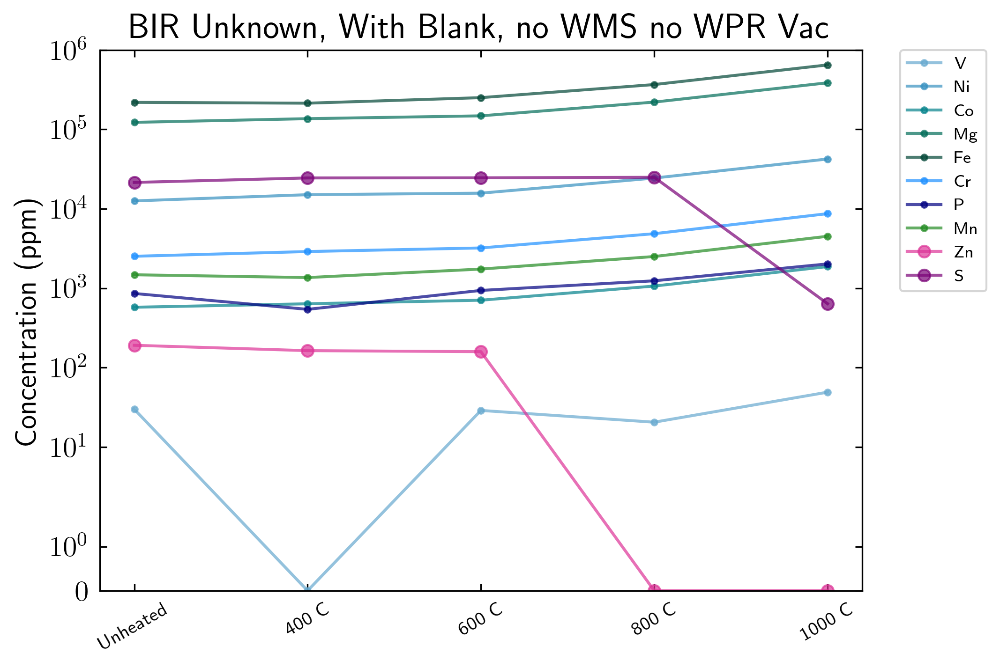

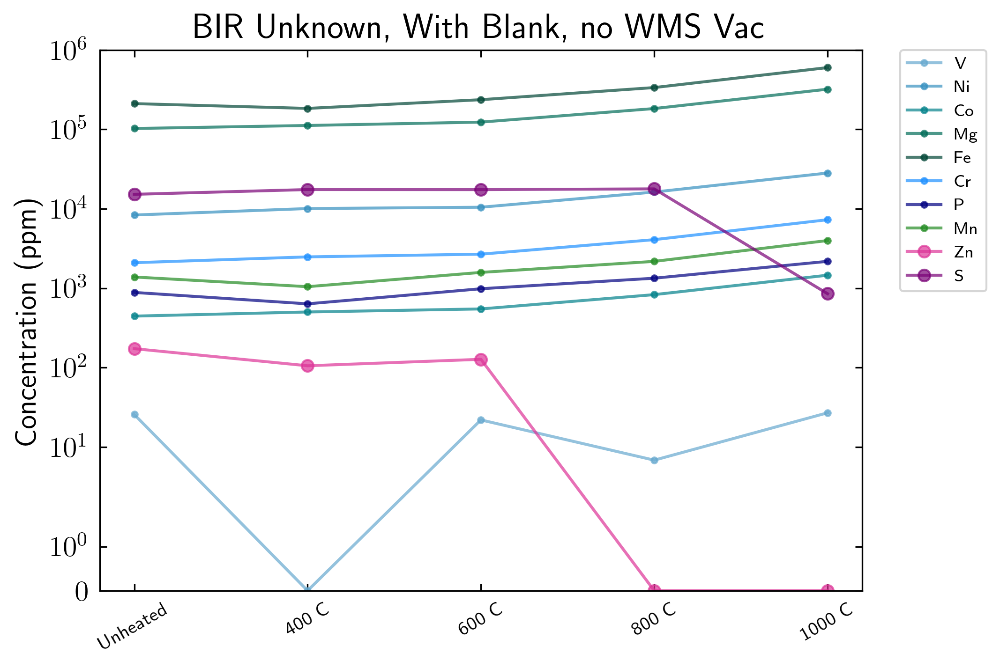

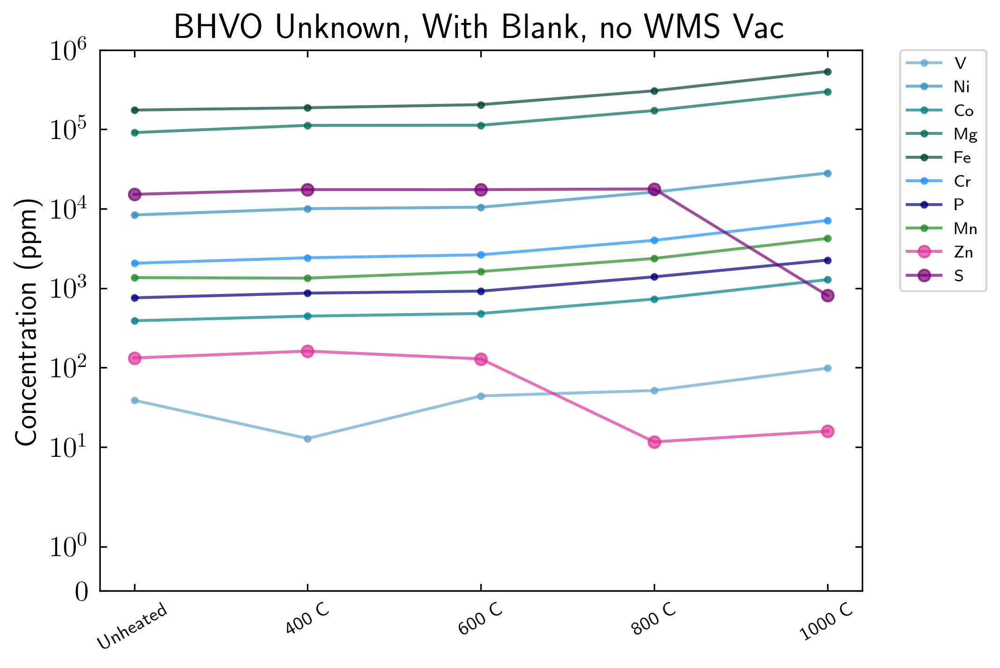

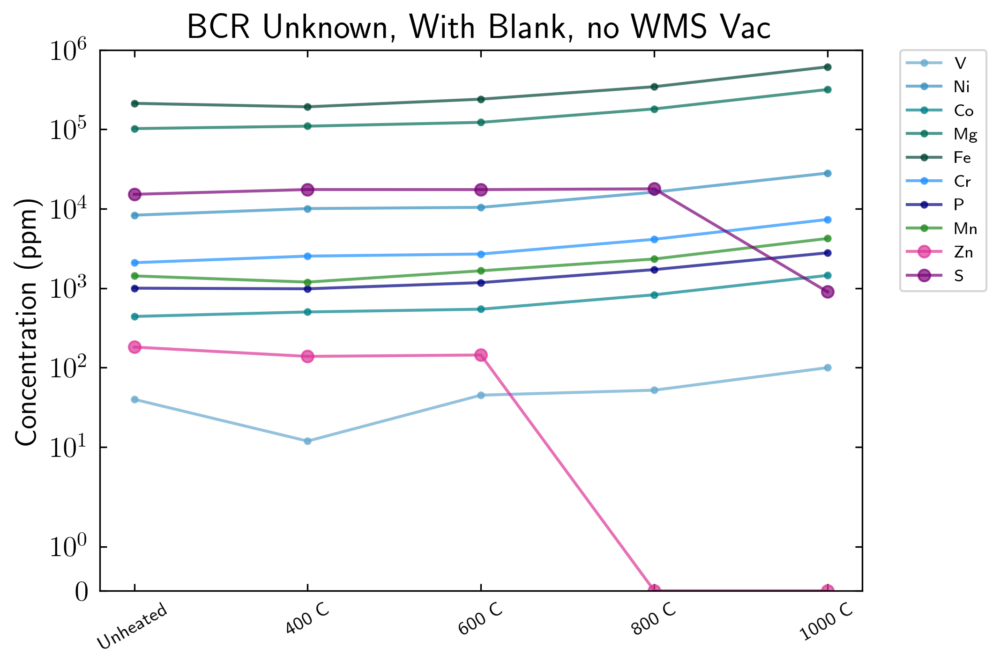

In [50]:
plot_results(SC_blank_BHVOu_vac, 'BHVO Unknown with Blank, Vac', 'BHVOUnknown_wblank_MainResults_Vac.jpg', 1.0e6)
plot_results(SC_blank_vac, 'BIR Unknown, With Blank, Vac', 'BIRUnknownwithblank_MainResults_Vac.jpg', 1.0e6)
plot_results(SC_blank_noW_vac, 'BIR Unknown, With Blank, no WMS no WPR Vac', 'BIRUnknownnoWMSnoWPR_MainResults_Vac.jpg', 1.0e6)
plot_results(SC_blank_BIRnoWMS_vac, 'BIR Unknown, With Blank, no WMS Vac', 'BIRUnknownnoWMS_MainResults_Vac.jpg', 1.0e6)
plot_results(SC_blank_noWMS_vac, 'BHVO Unknown, With Blank, no WMS Vac', 'BHVOUnknownnoWMS_MainResults_Vac.jpg',1.0e6)
plot_results(SC_blank_BCRnoWMS_vac, 'BCR Unknown, With Blank, no WMS Vac', 'BCRUnknownnoWMS_MainResults_Vac.jpg',1.0e6)



### Normalize Results to CI Chondrites and Mg & Plot

In [51]:
#Load CI Chondrite Composition:
#Data for Ivuna from Braukmuller et al 2018, Table A.3

data_CI = {'Na23': 4932, 'Mg26': 95468, 'Al27': 7967, 'P31': 845, 'Ca43': 8957, 'Ti47': 381, 'V51': 47.5, 'Cr52':2575, 'Mn55': 2040, 'Fe57':182348, 'Co59':507, 'Zn66':321, 'Ni61': 11226, 'S32':49686 }
df_CI = pd.DataFrame(data=[data_CI,data_CI,data_CI,data_CI,data_CI])
df_CI_onerow = pd.DataFrame(data=[data_CI])
print(df_CI)


   Na23   Mg26  Al27  P31  Ca43  Ti47   V51  Cr52  Mn55    Fe57  Co59  Zn66  \
0  4932  95468  7967  845  8957   381  47.5  2575  2040  182348   507   321   
1  4932  95468  7967  845  8957   381  47.5  2575  2040  182348   507   321   
2  4932  95468  7967  845  8957   381  47.5  2575  2040  182348   507   321   
3  4932  95468  7967  845  8957   381  47.5  2575  2040  182348   507   321   
4  4932  95468  7967  845  8957   381  47.5  2575  2040  182348   507   321   

    Ni61    S32  
0  11226  49686  
1  11226  49686  
2  11226  49686  
3  11226  49686  
4  11226  49686  


In [82]:
def plot_results_norm(file, title, savetitle):
    fig, ax = plt.subplots()
    #plt.plot(list(range(1,6)), file.Al27, '.-', alpha=0.7, color='black', label='Al')
    #plt.plot(list(range(1,6)), file.Ti47, '.-', alpha=0.7, color='darkgrey', label='Ti')
    #plt.plot(list(range(1,6)), file.Ca43, '.-', alpha=0.7, color='#a6bddb', label='Ca')
    plt.plot(list(range(1,6)), file.V51, '.-', alpha=0.7, color='#67a9cf', label='V')
    plt.plot(list(range(1,6)), file.Ni61, '.-', alpha=0.7, color='#3690c0', label='Ni')
    plt.plot(list(range(1,6)), file.Co59, '.-', alpha=0.7, color='#02818a', label='Co')
    plt.plot(list(range(1,6)), file.Mg26, '.-', alpha=0.7, color='#016c59', label='Mg')
    plt.plot(list(range(1,6)), file.Fe57, '.-', alpha=0.7, color='#014636', label='Fe')
    plt.plot(list(range(1,6)), file.Cr52, '.-', alpha=0.7, color='dodgerblue', label='Cr')
    plt.plot(list(range(1,6)), file.P31, '.-', alpha=0.7, color='navy', label='P')
    plt.plot(list(range(1,6)), file.Mn55, '.-', alpha=0.7, color='forestgreen', label='Mn')
    #plt.plot(list(range(1,6)), file.Na23, '-o', alpha=0.7, color='fuchsia', label='Na')
    plt.plot(list(range(1,6)), file.Zn66, '-o', alpha=0.7, color='#dd3497', label='Zn')
    plt.plot(list(range(1,6)), file.S32, '-o', alpha=0.7, color='#7a0177', label='S')
    ax.tick_params(top=True, right=True) 
    plt.ylim(0, 1.75)
    ax.set_xticks(list(range(1,6)))
    ax.set_xticklabels(X_axis, rotation=30, fontsize=10)
    plt.ylabel('Concentration Normalized to CI and Mg')
    plt.legend(fontsize='xx-small', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.title(title)
    plt.savefig(savetitle, dpi=1000, bbox_inches='tight')
    plt.show()
    
def plot_results_normCICo(file, title, savetitle):
    fig, ax = plt.subplots()
    #plt.plot(list(range(1,6)), file.Al27, '.-', alpha=0.7, color='black', label='Al')
    #plt.plot(list(range(1,6)), file.Ti47, '.-', alpha=0.7, color='darkgrey', label='Ti')
    #plt.plot(list(range(1,6)), file.Ca43, '.-', alpha=0.7, color='#a6bddb', label='Ca')
    plt.plot(list(range(1,6)), file.V51, '.-', alpha=0.7, color='#67a9cf', label='V')
    plt.plot(list(range(1,6)), file.Ni61, '.-', alpha=0.7, color='#3690c0', label='Ni')
    plt.plot(list(range(1,6)), file.Co59, '.-', alpha=0.7, color='#02818a', label='Co')
    plt.plot(list(range(1,6)), file.Mg26, '.-', alpha=0.7, color='#016c59', label='Mg')
    plt.plot(list(range(1,6)), file.Fe57, '.-', alpha=0.7, color='#014636', label='Fe')
    plt.plot(list(range(1,6)), file.Cr52, '.-', alpha=0.7, color='dodgerblue', label='Cr')
    plt.plot(list(range(1,6)), file.P31, '.-', alpha=0.7, color='navy', label='P')
    plt.plot(list(range(1,6)), file.Mn55, '.-', alpha=0.7, color='forestgreen', label='Mn')
    #plt.plot(list(range(1,6)), file.Na23, '-o', alpha=0.7, color='fuchsia', label='Na')
    plt.plot(list(range(1,6)), file.Zn66, '-o', alpha=0.7, color='#dd3497', label='Zn')
    plt.plot(list(range(1,6)), file.S32, '-o', alpha=0.7, color='#7a0177', label='S')
    ax.tick_params(top=True, right=True) 
    plt.ylim(0, 1.75)
    ax.set_xticks(list(range(1,6)))
    ax.set_xticklabels(X_axis, rotation=30, fontsize=10)
    plt.ylabel('Concentration Normalized to CI and Co')
    plt.legend(fontsize='xx-small', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.title(title)
    plt.savefig(savetitle, dpi=1000, bbox_inches='tight')
    plt.show()
    
    
def plot_results_normCIV(file, title, savetitle):
    fig, ax = plt.subplots()
    #plt.plot(list(range(1,6)), file.Al27, '.-', alpha=0.7, color='black', label='Al')
    #plt.plot(list(range(1,6)), file.Ti47, '.-', alpha=0.7, color='darkgrey', label='Ti')
    #plt.plot(list(range(1,6)), file.Ca43, '.-', alpha=0.7, color='#a6bddb', label='Ca')
    plt.plot(list(range(1,6)), file.V51, '.-', alpha=0.7, color='#67a9cf', label='V')
    plt.plot(list(range(1,6)), file.Ni61, '.-', alpha=0.7, color='#3690c0', label='Ni')
    plt.plot(list(range(1,6)), file.Co59, '.-', alpha=0.7, color='#02818a', label='Co')
    plt.plot(list(range(1,6)), file.Mg26, '.-', alpha=0.7, color='#016c59', label='Mg')
    plt.plot(list(range(1,6)), file.Fe57, '.-', alpha=0.7, color='#014636', label='Fe')
    plt.plot(list(range(1,6)), file.Cr52, '.-', alpha=0.7, color='dodgerblue', label='Cr')
    plt.plot(list(range(1,6)), file.P31, '.-', alpha=0.7, color='navy', label='P')
    plt.plot(list(range(1,6)), file.Mn55, '.-', alpha=0.7, color='forestgreen', label='Mn')
    #plt.plot(list(range(1,6)), file.Na23, '-o', alpha=0.7, color='fuchsia', label='Na')
    plt.plot(list(range(1,6)), file.Zn66, '-o', alpha=0.7, color='#dd3497', label='Zn')
    plt.plot(list(range(1,6)), file.S32, '-o', alpha=0.7, color='#7a0177', label='S')
    ax.tick_params(top=True, right=True) 
    plt.ylim(0, 2.0)
    ax.set_xticks(list(range(1,6)))
    ax.set_xticklabels(X_axis, rotation=30, fontsize=10)
    plt.ylabel('Concentration Normalized to CI and V')
    plt.legend(fontsize='xx-small', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.title(title)
    plt.savefig(savetitle, dpi=1000, bbox_inches='tight')
    plt.show()
    
def plot_results_normV(file, title, savetitle):
    fig, ax = plt.subplots()
    plt.plot(list(range(1,6)), file.V51, '.-', alpha=0.7, color='#67a9cf', label='V')
    plt.plot(list(range(1,6)), file.Ni61, '.-', alpha=0.7, color='#3690c0', label='Ni')
    plt.plot(list(range(1,6)), file.Co59, '.-', alpha=0.7, color='#02818a', label='Co')
    plt.plot(list(range(1,6)), file.Mg26, '.-', alpha=0.7, color='#016c59', label='Mg')
    plt.plot(list(range(1,6)), file.Fe57, '.-', alpha=0.7, color='#014636', label='Fe')
    plt.plot(list(range(1,6)), file.Cr52, '.-', alpha=0.7, color='dodgerblue', label='Cr')
    plt.plot(list(range(1,6)), file.P31, '.-', alpha=0.7, color='navy', label='P')
    plt.plot(list(range(1,6)), file.Mn55, '.-', alpha=0.7, color='forestgreen', label='Mn')
    plt.plot(list(range(1,6)), file.Zn66, '-o', alpha=0.7, color='#dd3497', label='Zn')
    plt.plot(list(range(1,6)), file.S32, '-o', alpha=0.7, color='#7a0177', label='S')
    ax.tick_params(top=True, right=True) 
    #plt.ylim(0, 6000)
    plt.yscale('symlog')
    ax.set_xticks(list(range(1,6)))
    ax.set_xticklabels(X_axis, rotation=30, fontsize=10)
    plt.ylabel('Concentration Normalized to V')
    plt.legend(fontsize='xx-small', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.title(title)
    plt.savefig(savetitle, dpi=1000, bbox_inches='tight')
    plt.show()

In [78]:
def normCIMg(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i]/df_CI[i].values/(file['Mg26']/df_CI.Mg26.values)
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_norm = Norm_Data.T
    return Samples_norm

def normCICo(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i]/df_CI[i].values/(file['Co59']/df_CI.Co59.values)
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_norm = Norm_Data.T
    return Samples_norm

def normCIV(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i]/df_CI[i].values/(file['V51']/df_CI.V51.values)
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_norm = Norm_Data.T
    return Samples_norm


def normV(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i]/(file['V51'])
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_norm = Norm_Data.T
    return Samples_norm


In [79]:
SC_blank_atm_normup = normCIV(SC_blank_atm)
SC_blank_vac_normup = normCIV(SC_blank_vac)

SC_blank_vac_normup.to_csv('ICPMS_VacConcentrationsNorm.csv')

SC_blank_atm_normV = normV(SC_blank_atm)
SC_blank_vac_normV = normV(SC_blank_vac)


In [55]:

SC_blank_BHVOu_atm_norm = normCIMg(SC_blank_BHVOu_atm)
SC_blank_BHVOu_vac_norm = normCIMg(SC_blank_BHVOu_vac)

SC_blank_atm_norm = normCIMg(SC_blank_atm)
SC_blank_vac_norm = normCIMg(SC_blank_vac)

SC_blank_noW_atm_norm = normCIMg(SC_blank_noW_atm)
SC_blank_noW_vac_norm = normCIMg(SC_blank_noW_vac)

SC_blank_BIRnoWMS_atm_norm = normCIMg(SC_blank_BIRnoWMS_atm)
SC_blank_BIRnoWMS_vac_norm = normCIMg(SC_blank_BIRnoWMS_vac)

SC_blank_noWMS_atm_norm = normCIMg(SC_blank_noWMS_atm)
SC_blank_noWMS_vac_norm = normCIMg(SC_blank_noWMS_vac)

SC_blank_BCRnoWMS_atm_norm = normCIMg(SC_blank_BCRnoWMS_atm)
SC_blank_BCRnoWMS_vac_norm = normCIMg(SC_blank_BCRnoWMS_vac)



print(SC_blank_vac_normup)


          Al27  Ti47      Ca43       V51      Ni61  Co59      Mg26      Fe57  \
UH    0.730535   0.0  0.761028  0.813017  0.987965   1.0  0.893459  1.133838   
400   0.000000   0.0  0.559136  0.568453  1.098904   1.0  0.988970  0.726615   
600   0.351498   0.0  0.704805  0.814108  1.012780   1.0  0.896607  1.001439   
800   0.064101   0.0  0.654216  0.731068  1.048193   1.0  0.906759  0.904778   
1000  0.185233   0.0  0.673182  0.752161  1.032319   1.0  0.894364  0.931589   

          Cr52       P31      Mn55      Na23      Zn66       S32  
UH    0.672676  0.920889  0.583393  0.099205  0.477415  0.506976  
400   0.782224  0.809810  0.501875  0.000000  0.351985  0.433416  
600   0.713786  0.880942  0.565254  0.000000  0.312098  0.449210  
800   0.736052  0.850042  0.544101  0.000000  0.000000  0.241023  
1000  0.739771  0.780471  0.554581  0.000000  0.000000  0.000000  


/var/folders/48/rykhh41s6ds_xk4143_5pyv00000gn/T/ipykernel_5005/1726708518.py:68: UserWarning: All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 
  ax.set_xticks(list(range(1,6)))


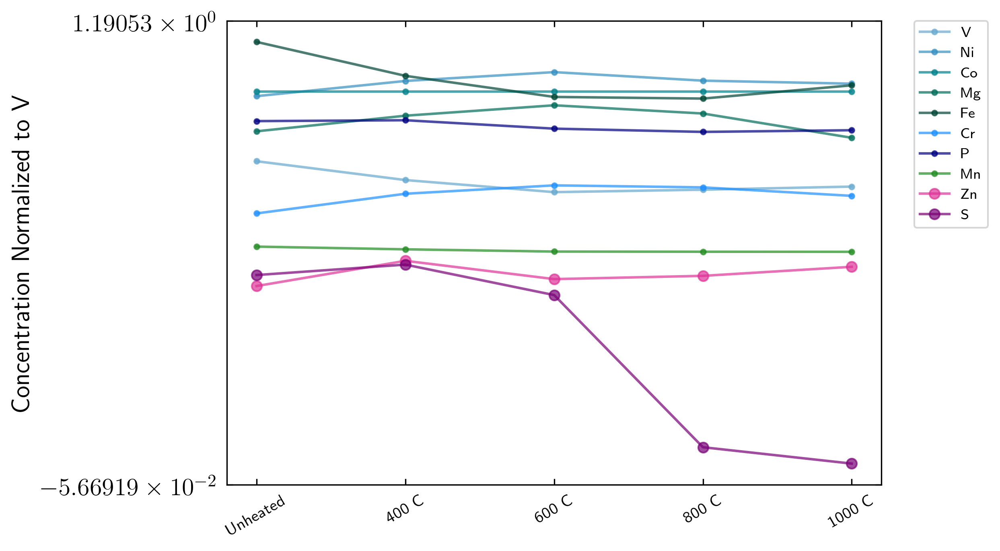

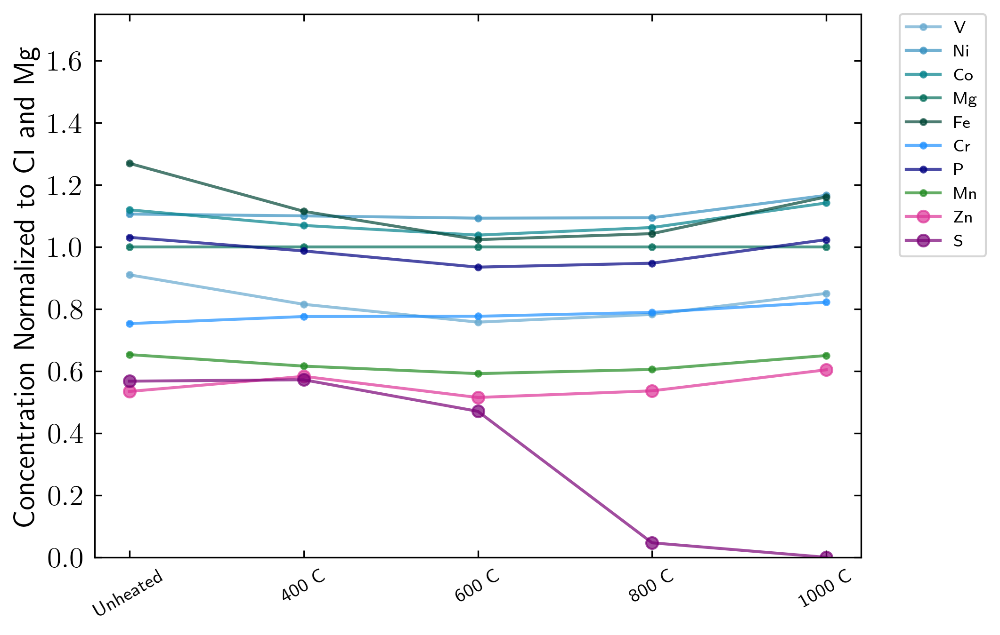

In [56]:
plot_results_normV(SC_blank_atm_normup, '', 'BIRunknown_withblank_MainResults_NormAtmUpdateCo.jpg')

plot_results_norm(SC_blank_atm_norm, '', 'BIRunknown_withblank_MainResults_NormAtmUpdateMg.jpg')


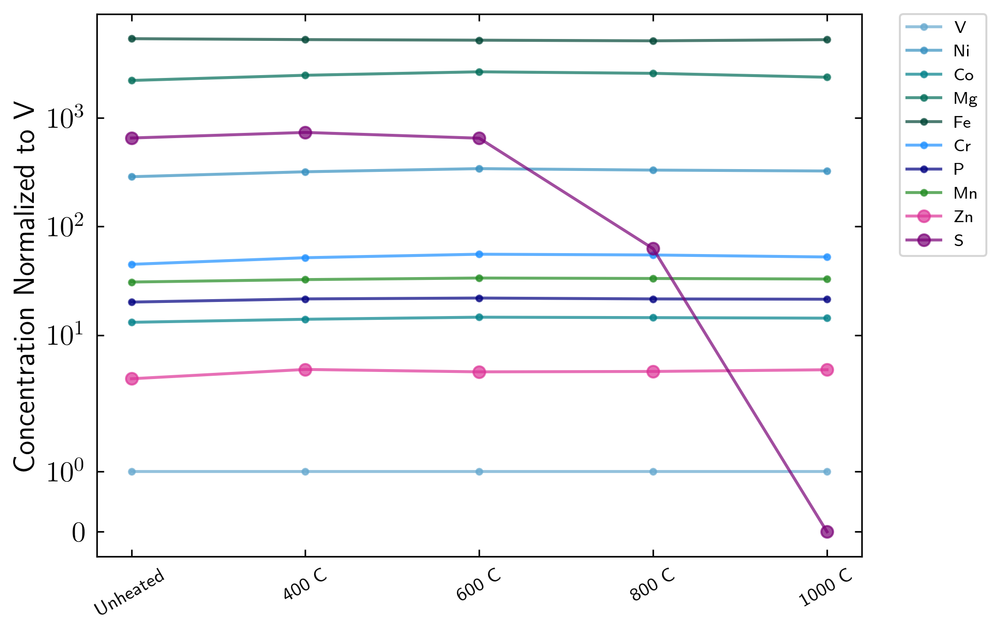

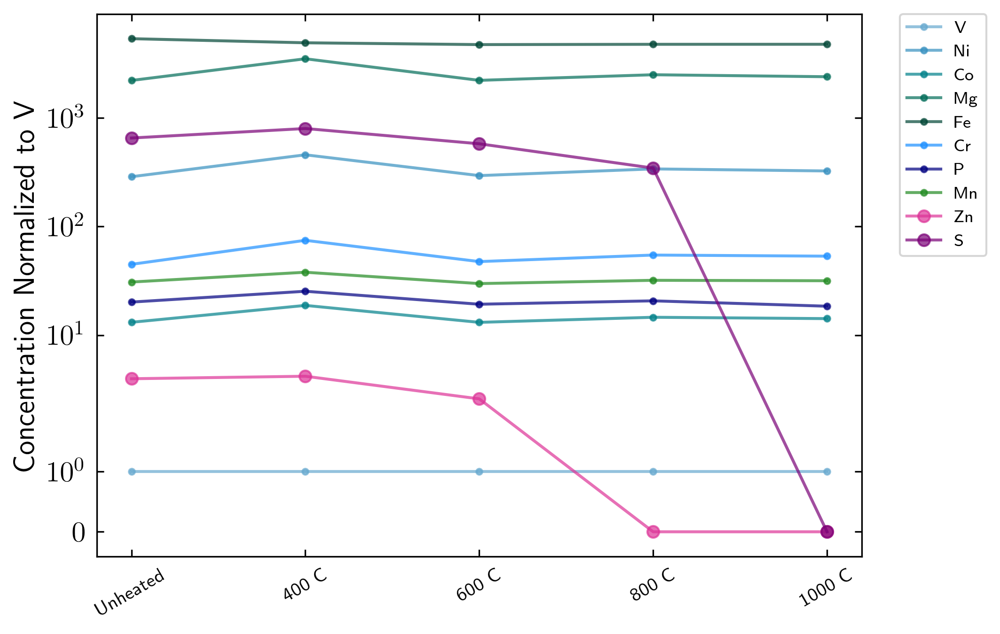

In [57]:
plot_results_normV(SC_blank_atm_normV, '', 'BIRunknown_withblank_MainResults_NormAtmV.jpg')
plot_results_normV(SC_blank_vac_normV, '', 'BIRunknown_withblank_MainResults_NormVacV.jpg')


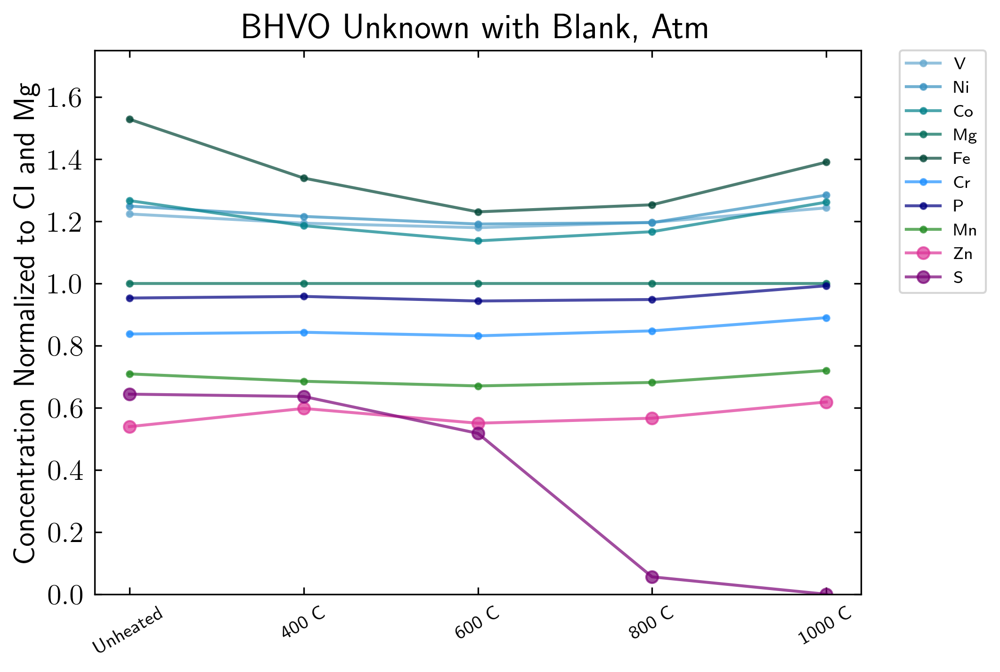

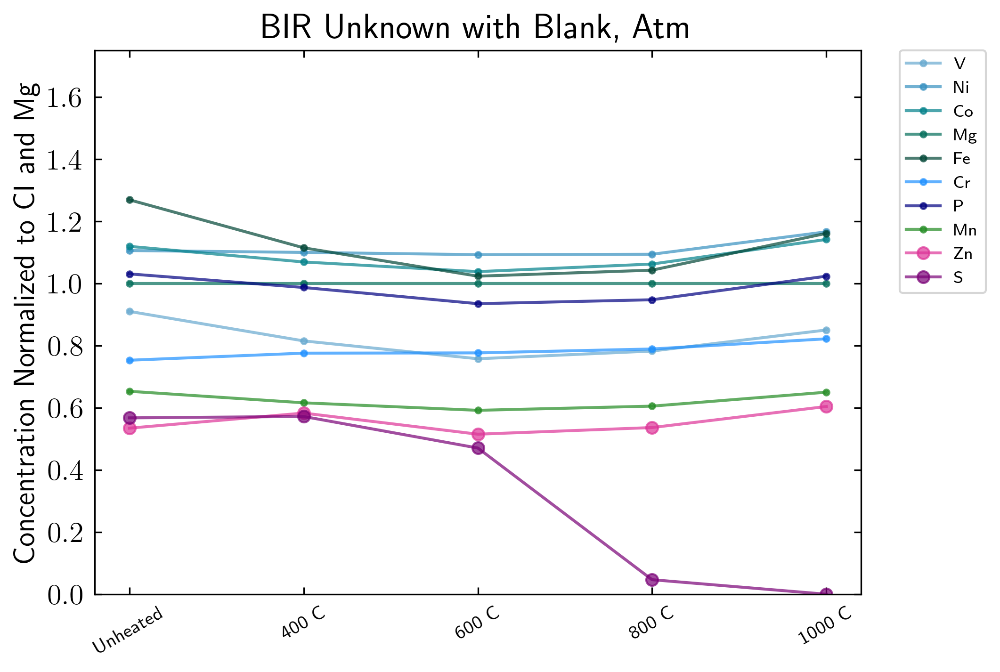

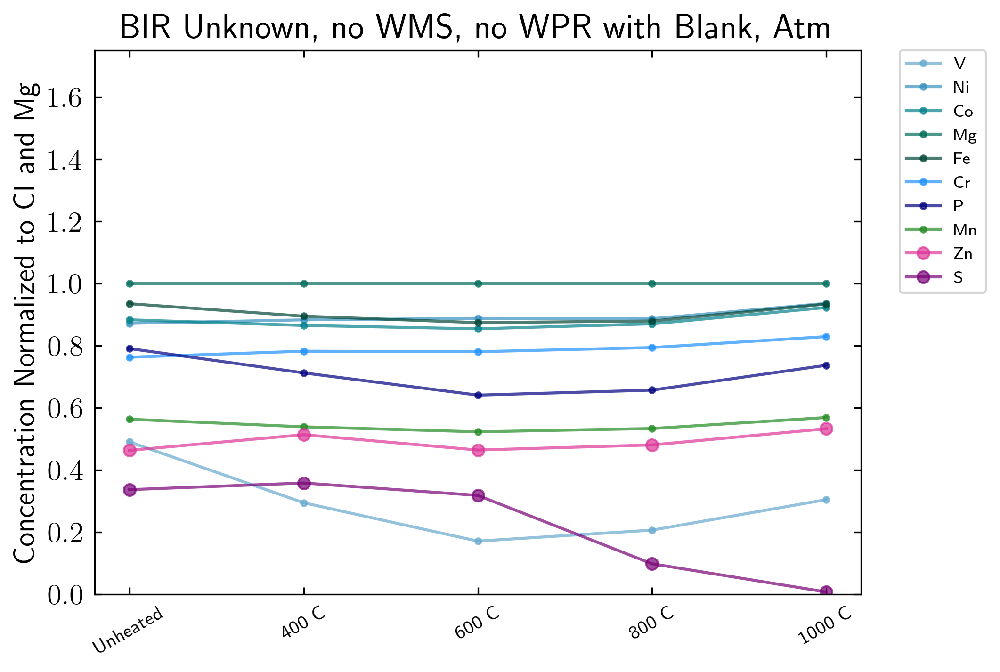

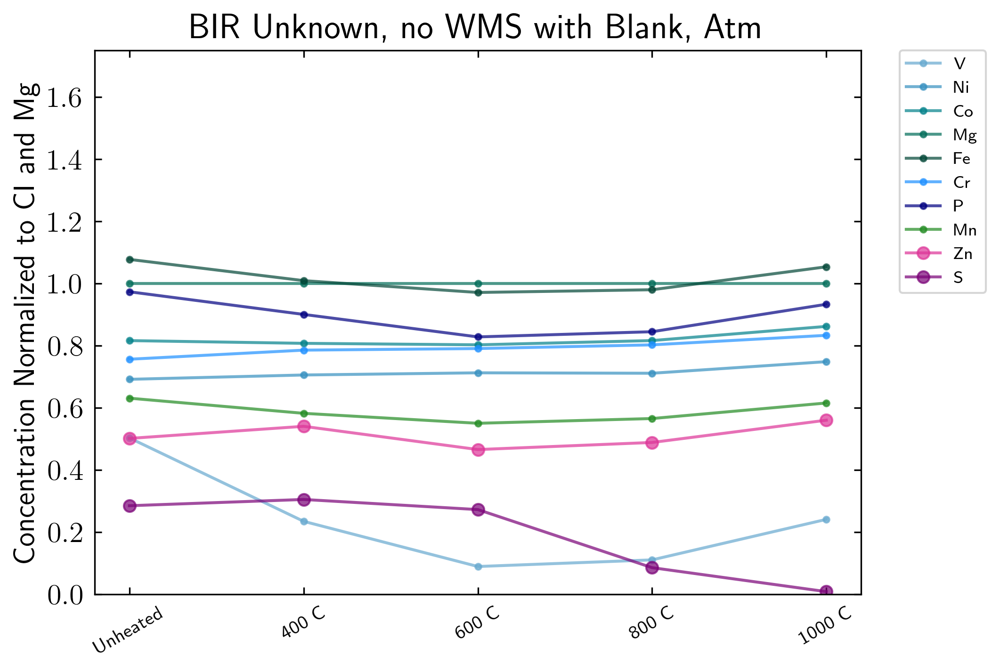

In [58]:
plot_results_norm(SC_blank_BHVOu_atm_norm, 'BHVO Unknown with Blank, Atm', 'BHVOUnknown_wblank_MainResults_NormAtm.jpg')
plot_results_norm(SC_blank_atm_norm, 'BIR Unknown with Blank, Atm', 'BIRunknown_withblank_MainResults_NormAtm.jpg')
plot_results_norm(SC_blank_noW_atm_norm, 'BIR Unknown, no WMS, no WPR with Blank, Atm', 'BIRunknownnoW_withblank_MainResults_NormAtm.jpg')
plot_results_norm(SC_blank_BIRnoWMS_atm_norm, 'BIR Unknown, no WMS with Blank, Atm', 'BIRunknownnoWMS_withblank_MainResults_NormAtm.jpg')



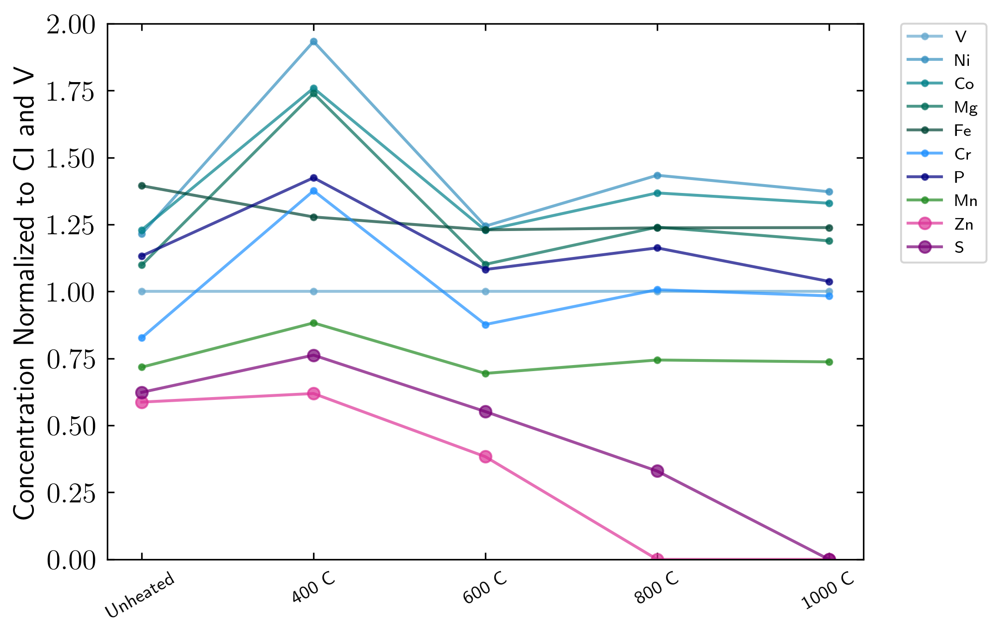

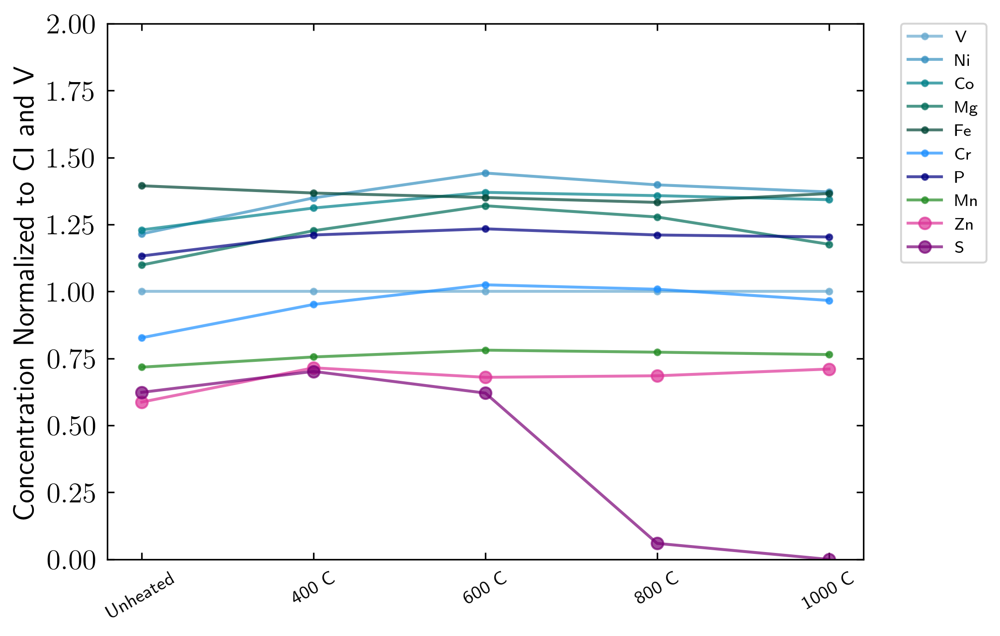

In [83]:
plot_results_normCIV(SC_blank_vac_normup, '', 'BIRunknown_withblank_MainResults_NormVacUpdateV.jpg')
plot_results_normCIV(SC_blank_atm_normup, '', 'BIRunknown_withblank_MainResults_NormAtmUpdateV.jpg')

#plot_results_norm(SC_blank_vac_norm, '', 'BIRunknown_withblank_MainResults_NormVacUpdateMg.jpg')


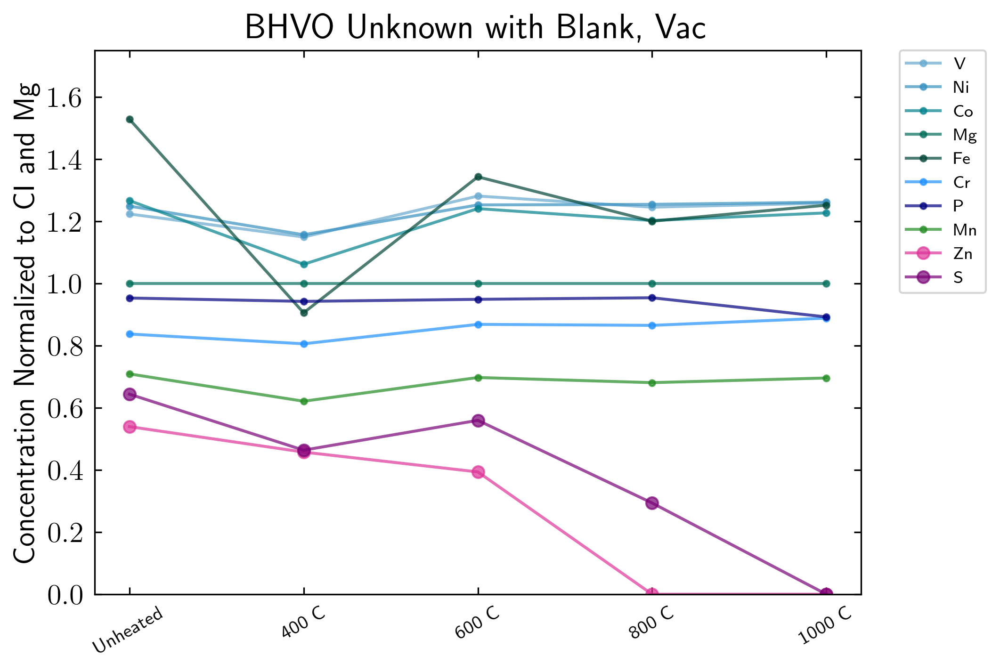

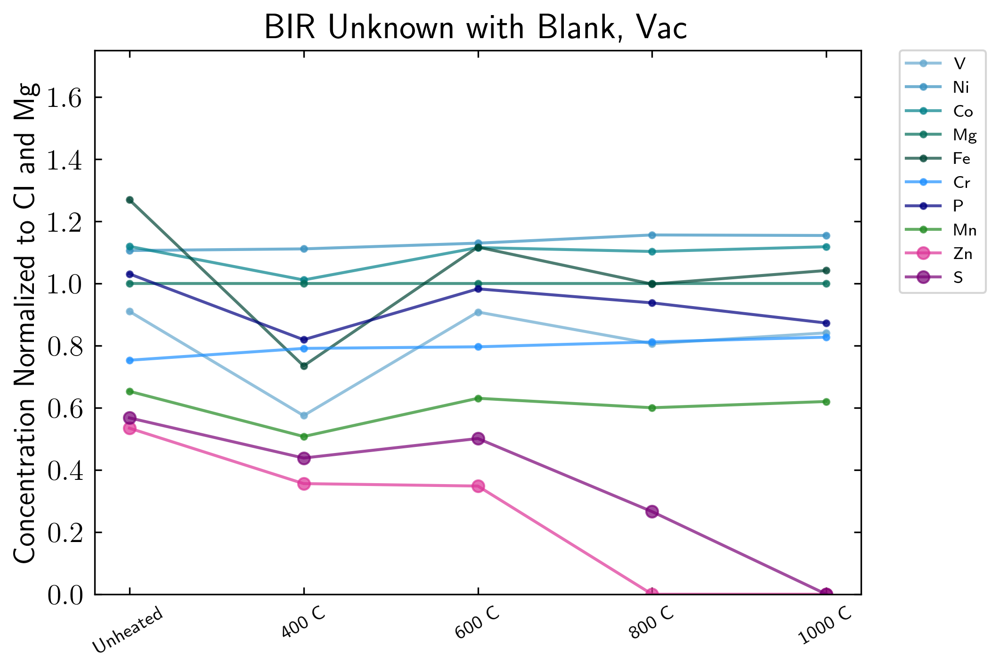

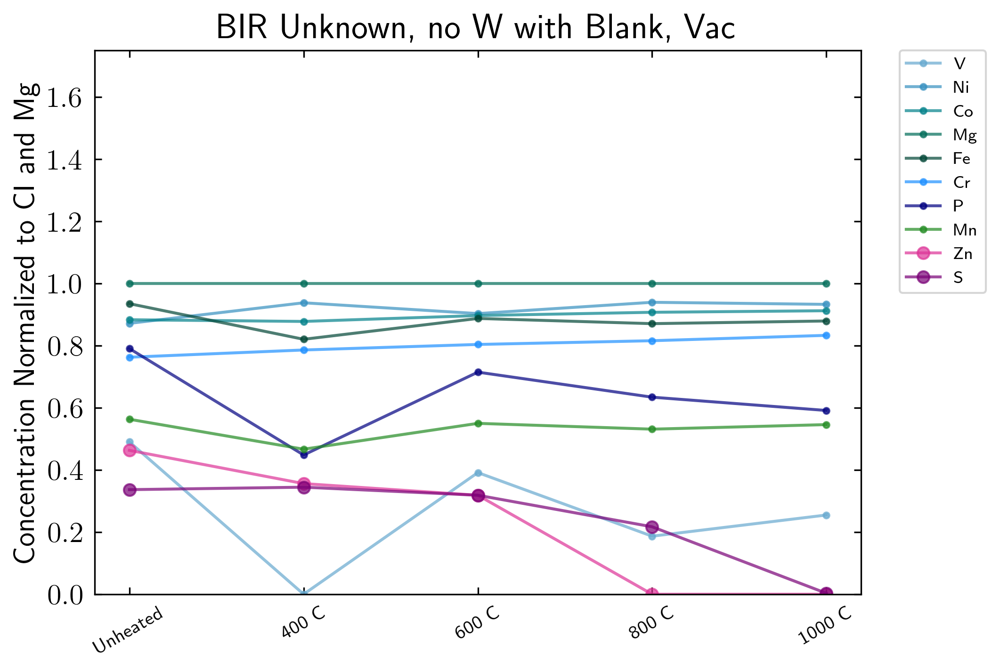

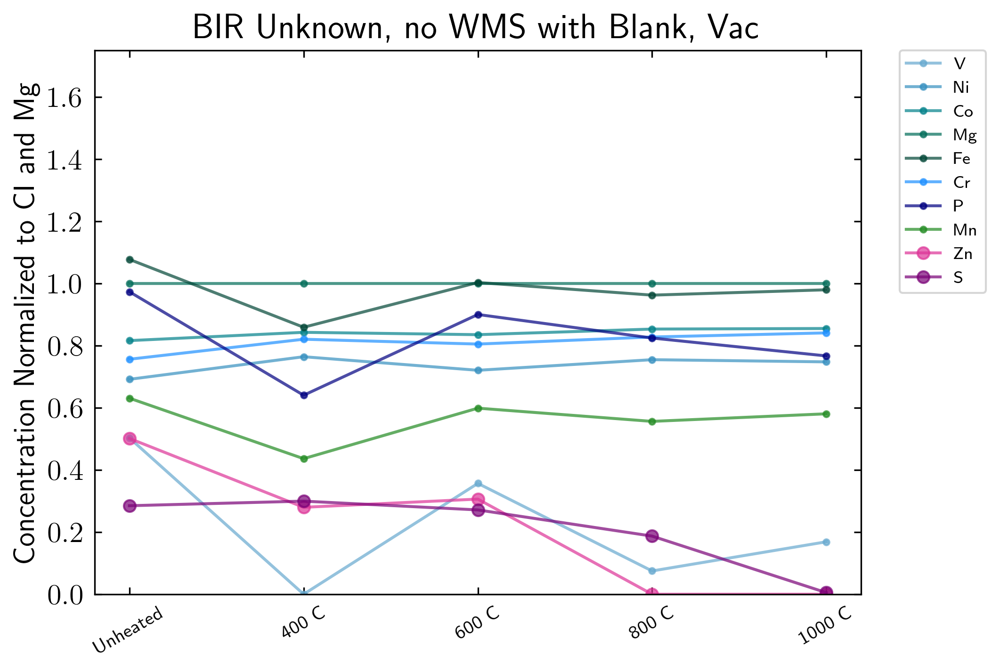

In [60]:
plot_results_norm(SC_blank_BHVOu_vac_norm, 'BHVO Unknown with Blank, Vac', 'BHVOUnknown_wblank_MainResults_NormVac.jpg')
plot_results_norm(SC_blank_vac_norm, 'BIR Unknown with Blank, Vac', 'BIRunknown_withblank_MainResults_NormVac.jpg')
plot_results_norm(SC_blank_noW_vac_norm, 'BIR Unknown, no W with Blank, Vac', 'BIRunknownnoW_withblank_MainResults_NormVac.jpg')
plot_results_norm(SC_blank_BIRnoWMS_vac_norm, 'BIR Unknown, no WMS with Blank, Vac', 'BIRunknownnoWMS_withblank_MainResults_NormVac.jpg')



## Comparing Atmospheric DataSets (Relative Difference)

In [61]:
def reldiff(val1, val2): #reldiff = Percent Difference 
    top = np.abs(val1-val2)
    bottom = (val1+val2)/2.0
    #print('average:', bottom)
    reldiff = top/bottom
    return reldiff

def reldiff_dataframe(data):
    RD_UH = []
    RD_1000 = []
    RD_800 = []
    RD_600 = []
    RD_400 = []
    for i in X_compare:
        UH_reldiff = reldiff(data['M_UH_1'][i], data['M_UH_2'][i])
        Avg1000_reldiff = reldiff(data['M_1000_1'][i], data['M_1000_2'][i])
        Avg800_reldiff = reldiff(data['M_800_1'][i],data['M_800_2'][i])
        Avg600_reldiff = reldiff(data['M_600_1'][i],data['M_600_2'][i])
        Avg400_reldiff = reldiff(data['M_400_1'][i],data['M_400_2'][i])
        RD_UH.append(UH_reldiff)
        RD_1000.append(Avg1000_reldiff)
        RD_800.append(Avg800_reldiff)
        RD_600.append(Avg600_reldiff)
        RD_400.append(Avg400_reldiff)
    d = {'UH': RD_UH, '400': RD_400, '600': RD_600, '800': RD_800, '1000': RD_1000}
    RelDiff = pd.DataFrame(data=d)
    RelDiff.index=X_compare
    Samples_RelDiff = RelDiff.T
    return Samples_RelDiff


In [62]:
SCwblank_RelDiff = reldiff_dataframe(SampleConcentrations_wblank)
SCwblankBHVO_RelDiff = reldiff_dataframe(SampleConcentrations_wblank_BHVO)

/var/folders/48/rykhh41s6ds_xk4143_5pyv00000gn/T/ipykernel_5005/1606199042.py:5: RuntimeWarning: invalid value encountered in double_scalars
  reldiff = top/bottom
/var/folders/48/rykhh41s6ds_xk4143_5pyv00000gn/T/ipykernel_5005/1606199042.py:5: RuntimeWarning: invalid value encountered in double_scalars
  reldiff = top/bottom


In [63]:
for i in X_compare:
    print(i, 100*reldiff(SampleConcentrations_wblank['M_UH_1'][i], SampleConcentrations_wblank['M_UH_2'][i]))

Al27 9.212060010182094
Ti47 nan
Ca43 7.81622234279637
V51 5.604476680184711
Ni61 7.9839017755730355
Co59 7.454568689618974
Mg26 7.041106620114351
Fe57 5.90031268981948
Cr52 6.260468262060251
P31 7.790073470269688
Mn55 6.260285372647595
Na23 2.8476274291384094
Zn66 7.260452121826333
S32 8.331046917696467


/var/folders/48/rykhh41s6ds_xk4143_5pyv00000gn/T/ipykernel_5005/1606199042.py:5: RuntimeWarning: invalid value encountered in double_scalars
  reldiff = top/bottom


In [64]:
X_axis = ['Unheated', '400 C', '600 C', '800 C', '1000 C']

def plot_reldiff(SC_RD_plt, title):
    fig, ax = plt.subplots()
    #plt.plot(list(range(1,6)), SC_RD_plt.Al27, '.-', alpha=0.7, color='black', label='Al')
    #plt.plot(list(range(1,6)), SC_RD_plt.Ti47, '.-', alpha=0.7, color='darkgrey', label='Ti')
    #plt.plot(list(range(1,6)), SC_RD_plt.Ca43, '.-', alpha=0.7, color='#a6bddb', label='Ca')
    plt.plot(list(range(1,6)), SC_RD_plt.V51, '.-', alpha=0.7, color='#67a9cf', label='V')
    plt.plot(list(range(1,6)), SC_RD_plt.Ni61, '.-', alpha=0.7, color='#3690c0', label='Ni')
    plt.plot(list(range(1,6)), SC_RD_plt.Co59, '.-', alpha=0.7, color='#02818a', label='Co')
    plt.plot(list(range(1,6)), SC_RD_plt.Mg26, '.-', alpha=0.7, color='#016c59', label='Mg')
    plt.plot(list(range(1,6)), SC_RD_plt.Fe57, '.-', alpha=0.7, color='#014636', label='Fe')
    plt.plot(list(range(1,6)), SC_RD_plt.Cr52, '.-', alpha=0.7, color='dodgerblue', label='Cr')
    plt.plot(list(range(1,6)), SC_RD_plt.P31, '.-', alpha=0.7, color='navy', label='P')
    plt.plot(list(range(1,6)), SC_RD_plt.Mn55, '.-', alpha=0.7, color='forestgreen', label='Mn')
    #plt.plot(list(range(1,6)), SC_RD_plt.Na23, '-o', alpha=0.7, color='fuchsia', label='Na')
    plt.plot(list(range(1,6)), SC_RD_plt.Zn66, '-o', alpha=0.7, color='#dd3497', label='Zn')
    plt.plot(list(range(1,6)), SC_RD_plt.S32, '-o', alpha=0.7, color='#7a0177', label='S')
    ax.tick_params(top=True, right=True)
    #plt.yscale('log')
    plt.ylim(0,100)
    ax.set_xticks(list(range(1,6)))
    ax.set_xticklabels(X_axis, rotation=30, fontsize=10)
    plt.axhline(y=0, linestyle='--', color='gray')
    plt.title(title)
    plt.ylabel(r'Percent Difference (\%)')
    plt.legend(fontsize='xx-small', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    #plt.savefig('RelativeDifferences_AtmFurnaceConcentrations_NoCaAl.jpg', dpi=1000, bbox_inches='tight')
    plt.show()

In [65]:
#for i in X_compare_up:
#    print(SCwblank_RelDiff[i]*100)
print(SCwblank_RelDiff*100)
#print(SampleConcentrations_wblank)

            Al27  Ti47       Ca43        V51       Ni61       Co59       Mg26  \
UH      9.212060   NaN   7.816222   5.604477   7.983902   7.454569   7.041107   
400    25.896399   NaN   7.790579   9.488362   0.428325   0.604365   7.698714   
600   200.000000   NaN   8.939003  11.393774  16.011614  13.323635  25.142076   
800   115.339575   NaN  18.947330  20.697515  16.522732  13.788990  26.476277   
1000    5.710293   NaN   8.695591  10.891206   1.187919   2.857246   4.641265   

          Fe57       Cr52       P31       Mn55      Na23       Zn66  \
UH    5.900313   6.260468  7.790073   6.260285  2.847627   7.260452   
400   4.819726   1.273737  4.556557   0.739928       NaN  36.075752   
600   1.880377  18.947889  5.398822   7.157857       NaN  18.577240   
800   2.160006  19.605323  6.694291  11.021346       NaN  17.866439   
1000  1.687361   4.047395  1.094416   0.345959       NaN  10.990484   

             S32  
UH      8.331047  
400     1.828156  
600     4.135035  
800   169.

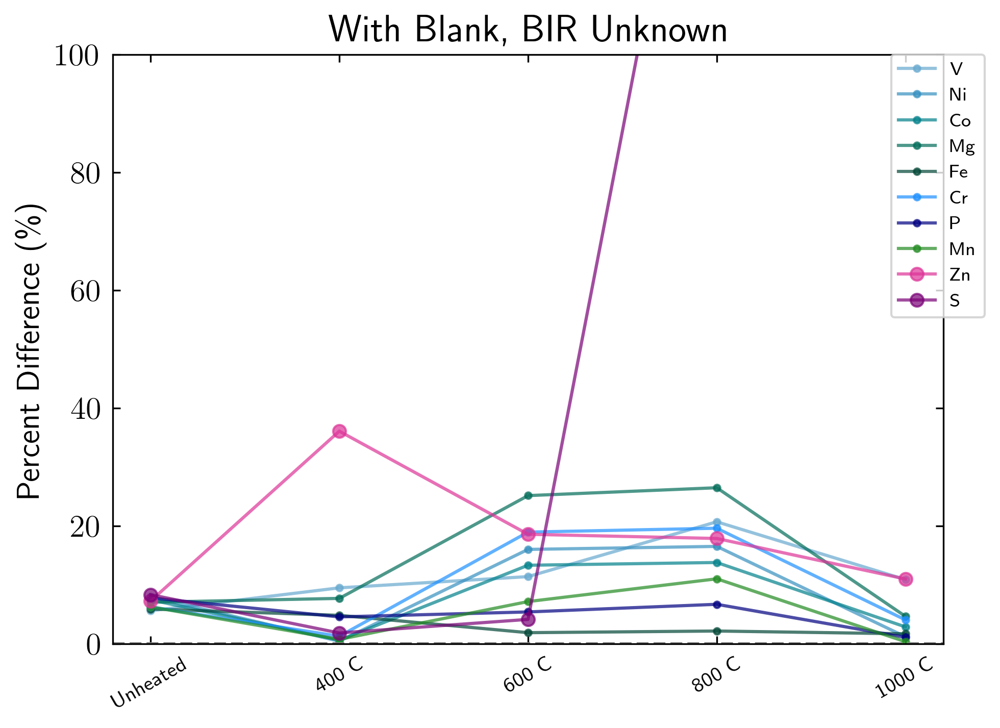

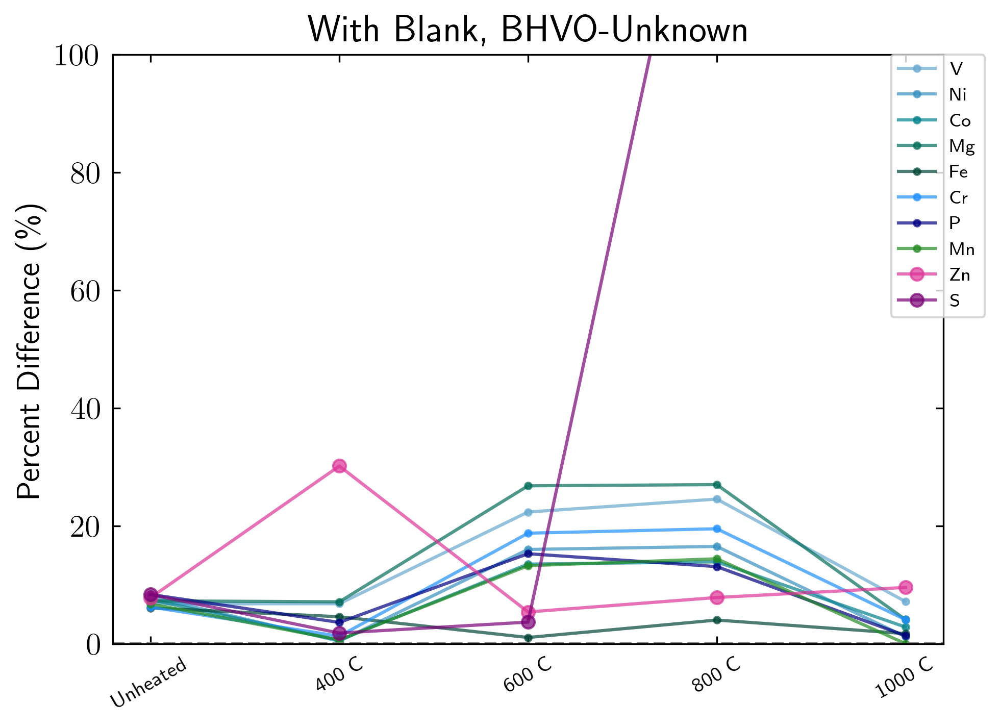

In [66]:

plot_reldiff(100*SCwblank_RelDiff, 'With Blank, BIR Unknown')
plot_reldiff(100*SCwblankBHVO_RelDiff, 'With Blank, BHVO-Unknown')

In [67]:
print(SampleConcentrations_wblank_BHVO['M_1000_1'])
print(SampleConcentrations_wblank_BHVO['M_1000_2'])
print(SCwblankBHVO_RelDiff)

Na23          1032.632185
Mg26        102373.117411
Al27          8725.178218
P31            924.395477
S32              0.000000
Ca43          6051.938251
Ti47           688.782837
V51             62.325827
Cr52          2457.143842
Mn55          1608.193007
Fe57        279916.880350
Co59           690.274659
Ni61         15687.393781
Zn66           227.746124
In115                 NaN
K39_HR           0.000000
In115_HR         2.543474
Name: M_1000_1, dtype: float64
Na23          1088.198884
Mg26        106659.202478
Al27          8389.483246
P31            911.830096
S32              0.000000
Ca43          6867.641002
Ti47           750.471899
V51             66.951913
Cr52          2559.625761
Mn55          1607.820842
Fe57        275138.820412
Co59           710.101798
Ni61         15875.041162
Zn66           206.975775
In115                 NaN
K39_HR           0.000000
In115_HR         1.259641
Name: M_1000_2, dtype: float64
          Al27      Ti47      Ca43       V51      Ni61

In [68]:
#Determining which Element has the least variation among the different heating steps (BHVO Unknown):

SC_blank_BHVOu_atm_T = SC_blank_BHVOu_atm.T
print('BHVO Unknown, With Blank, Under Atm:')
print(reldiff(SC_blank_BHVOu_atm_T['UH'], SC_blank_BHVOu_atm_T['400'])*100)
print('')
print(reldiff(SC_blank_BHVOu_atm_T['400'], SC_blank_BHVOu_atm_T['600'])*100)
print('')
print(reldiff(SC_blank_BHVOu_atm_T['600'], SC_blank_BHVOu_atm_T['800'])*100)
print('')
print(reldiff(SC_blank_BHVOu_atm_T['800'], SC_blank_BHVOu_atm_T['1000'])*100)


SC_blank_BHVOu_vac_T = SC_blank_BHVOu_vac.T
print('BHVO Unknown, With Blank, Under Vacuum:')
print(reldiff(SC_blank_BHVOu_vac_T['UH'], SC_blank_BHVOu_vac_T['400'])*100)
print('')
print(reldiff(SC_blank_BHVOu_vac_T['400'], SC_blank_BHVOu_vac_T['600'])*100)
print('')
print(reldiff(SC_blank_BHVOu_vac_T['600'], SC_blank_BHVOu_vac_T['800'])*100)
print('')
print(reldiff(SC_blank_BHVOu_vac_T['800'], SC_blank_BHVOu_vac_T['1000'])*100)

BHVO Unknown, With Blank, Under Atm:
Na23         35.970199
Mg26          7.322039
Al27         14.964917
P31           7.863027
S32           6.157916
Ca43         20.211291
Ti47         11.368160
V51           4.877890
Cr52          7.991163
Mn55          3.926700
Fe57          5.907676
Co59          0.746214
Ni61          4.631164
Zn66         17.574715
In115              NaN
K39_HR      136.933662
In115_HR     15.656450
dtype: float64

Na23          5.988117
Mg26          5.089827
Al27         12.613443
P31           3.535258
S32          15.509140
Ca43         11.191066
Ti47          7.437212
V51           3.872974
Cr52          3.724318
Mn55          2.876707
Fe57          3.369748
Co59          0.887412
Ni61          3.052123
Zn66          3.181311
In115              NaN
K39_HR      200.000000
In115_HR      2.190932
dtype: float64

Na23         14.203139
Mg26         14.200569
Al27         17.765739
P31          14.708058
S32         155.716565
Ca43         14.242712
Ti47       

In [69]:
#Determining which Element has the least variation among the different heating steps (BIR Unknown):

SC_blank_atm_T = SC_blank_atm.T
RelDiff_UH400 = reldiff(SC_blank_atm_T['UH'], SC_blank_atm_T['400'])*100
RelDiff_400600 = reldiff(SC_blank_atm_T['400'], SC_blank_atm_T['600'])*100
RelDiff_600800 = reldiff(SC_blank_atm_T['600'], SC_blank_atm_T['800'])*100
RelDiff_8001000 = reldiff(SC_blank_atm_T['800'], SC_blank_atm_T['1000'])*100

SC_blank_vac_T = SC_blank_vac.T
RelDiff_UH400v = reldiff(SC_blank_vac_T['UH'], SC_blank_vac_T['400'])*100
RelDiff_400600v = reldiff(SC_blank_vac_T['400'], SC_blank_vac_T['600'])*100
RelDiff_600800v = reldiff(SC_blank_vac_T['600'], SC_blank_vac_T['800'])*100
RelDiff_8001000v = reldiff(SC_blank_vac_T['800'], SC_blank_vac_T['1000'])*100 

for i in X_compare:
    RelDiff_atm_sum = RelDiff_UH400[i]+RelDiff_400600[i]+RelDiff_600800[i]+RelDiff_8001000[i]
    RelDiff_vac_sum = RelDiff_UH400v[i]+RelDiff_400600v[i]+RelDiff_600800v[i]+RelDiff_8001000v[i]

    print(i, RelDiff_atm_sum+RelDiff_vac_sum)
    


Al27 838.0566109683617
Ti47 nan
Ca43 186.01478519737188
V51 203.9724572489991
Ni61 145.4730077049369
Co59 136.1414743183828
Mg26 148.73327460350114
Fe57 208.83017031788768
Cr52 158.51939812562884
P31 143.26065233255952
Mn55 158.1863653700773
Na23 nan
Zn66 nan
S32 639.3192666980975


## Braukmuller Comparison 

In [70]:
## Load Braukmuller et al 2018 heating experiment results:

B_O2_400 = {'Na23': [942], 'Mg26': [124638], 'Al27': [12805], 'P31': [1116], 'Ca43': [12481], 'Ti47': [611], 'V51': [74.3], 'Cr52':[3500], 'Mn55': [1957], 'Fe57':[239744], 'Co59':[627], 'Zn66':[201], 'Ni61': [14109], 'S32':[26659] }
df_B_O2_400 = pd.DataFrame(data=B_O2_400)

B_Ar_400 = {'Na23': [957], 'Mg26': [135975], 'Al27': [12586], 'P31': [1157], 'Ca43': [12647], 'Ti47': [630], 'V51': [76.4], 'Cr52':[3531], 'Mn55': [1984], 'Fe57':[241646], 'Co59':[641], 'Zn66':[203], 'Ni61': [14253], 'S32':[27498] }
df_B_Ar_400 = pd.DataFrame(data=B_Ar_400)

B_O2_600 = {'Na23': [981], 'Mg26': [130679], 'Al27': [8154], 'P31': [1134], 'Ca43': [12713], 'Ti47': [619], 'V51': [76.3], 'Cr52':[3579], 'Mn55': [2009], 'Fe57':[241974], 'Co59':[640], 'Zn66':[202], 'Ni61': [14366], 'S32':[24890] }
df_B_O2_600 = pd.DataFrame(data=B_O2_600)

B_Ar_600 = {'Na23': [1008], 'Mg26': [142288], 'Al27': [10882], 'P31': [1178], 'Ca43': [13351], 'Ti47': [645], 'V51': [79.5], 'Cr52':[3697], 'Mn55': [2106], 'Fe57':[254361], 'Co59':[666], 'Zn66':[211], 'Ni61': [14914], 'S32':[25868] }
df_B_Ar_600 = pd.DataFrame(data=B_Ar_600)

B_O2_800 = {'Na23': [996], 'Mg26': [136321], 'Al27': [13461], 'P31': [1189], 'Ca43': [13062], 'Ti47': [654], 'V51': [79.1], 'Cr52':[3657], 'Mn55': [2020], 'Fe57':[246229], 'Co59':[662], 'Zn66':[208], 'Ni61': [14758], 'S32':[9089] }
df_B_O2_800 = pd.DataFrame(data=B_O2_800)

B_Ar_800 = {'Na23': [1041], 'Mg26': [147386], 'Al27': [12177], 'P31': [1218], 'Ca43': [14121], 'Ti47': [674], 'V51': [81.8], 'Cr52':[3952], 'Mn55': [2218], 'Fe57':[270428], 'Co59':[700], 'Zn66':[135], 'Ni61': [15901], 'S32':[14104] }
df_B_Ar_800 = pd.DataFrame(data=B_Ar_800)

B_O2_1000 = {'Na23': [1058], 'Mg26': [139584], 'Al27': [9496], 'P31': [1188], 'Ca43': [13449], 'Ti47': [661], 'V51': [80.7], 'Cr52':[3797], 'Mn55': [2120], 'Fe57':[252860], 'Co59':[674], 'Zn66':[214], 'Ni61': [15247], 'S32':[2225] }
df_B_O2_1000 = pd.DataFrame(data=B_O2_1000)

B_Ar_1000 = {'Na23': [941], 'Mg26': [144832], 'Al27': [9990], 'P31': [1261], 'Ca43': [13918], 'Ti47': [691], 'V51': [84.9], 'Cr52':[3876], 'Mn55': [2158], 'Fe57':[256946], 'Co59':[705], 'Zn66':[5], 'Ni61': [15664], 'S32':[27691] }
df_B_Ar_1000 = pd.DataFrame(data=B_Ar_1000)


B_BHVO = {'Na23': [14638], 'Mg26': [42960], 'Al27': [67873], 'P31': [1062], 'Ca43': [73752], 'Ti47': [15109], 'V51': [309], 'Cr52':[286], 'Mn55': [1284], 'Fe57':[83902], 'Co59':[44], 'Zn66':[105], 'Ni61': [124], 'S32':[166] }


In [71]:
#Normalize Braukmuller's results to CI and Mg:

def normCIMg_B(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i]/df_CI_onerow[i]/(file['Mg26']/df_CI_onerow.Mg26)
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_Norm = Norm_Data.T
    return Samples_Norm


def normCICo_B(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i]/df_CI_onerow[i]/(file['Co59']/df_CI_onerow.Co59)
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_Norm = Norm_Data.T
    return Samples_Norm

def normV_B(file):
    data_norm = []
    for i in X_compare:
        d_norm = file[i][0]/(file['V51'][0])
        data_norm.append(d_norm)
    Norm_Data = pd.DataFrame(data=data_norm)
    Norm_Data.index=X_compare
    Samples_Norm = Norm_Data.T
    return Samples_Norm


def normUH_B(file, UHfile):
    data_norm = []
    for i in X_compare:
        d_norm = file[i][0]/UHfile[i][0]
        data_norm.append(d_norm)
    Norm_Data=pd.DataFrame(data=data_norm)
    Norm_Data.index = X_compare
    Samples_Norm = Norm_Data.T
    return Samples_Norm
    


#Normalize B to CI and Mg:
B_O2_400_norm =normCIMg_B(B_O2_400)
B_O2_600_norm =normCIMg_B(B_O2_600)
B_O2_800_norm =normCIMg_B(B_O2_800)
B_O2_1000_norm =normCIMg_B(B_O2_1000)

B_MurchNC_norm = normCIMg_B(df_B_MurchNC)

B_Ar_400_norm =normCIMg_B(B_Ar_400)
B_Ar_600_norm =normCIMg_B(B_Ar_600)
B_Ar_800_norm =normCIMg_B(B_Ar_800)
B_Ar_1000_norm =normCIMg_B(B_Ar_1000)

print(B_MurchNC_norm.values[0])

#Normalize B to CI and Co:
B_O2_400_normup =normCICo_B(B_O2_400)
B_O2_600_normup =normCICo_B(B_O2_600)
B_O2_800_normup =normCICo_B(B_O2_800)
B_O2_1000_normup =normCICo_B(B_O2_1000)

B_MurchNC_normup = normCICo_B(df_B_MurchNC)

B_Ar_400_normup =normCICo_B(B_Ar_400)
B_Ar_600_normup =normCICo_B(B_Ar_600)
B_Ar_800_normup =normCICo_B(B_Ar_800)
B_Ar_1000_normup =normCICo_B(B_Ar_1000)

#Normalize B to V:

B_O2_400_normV =normV_B(B_O2_400)
B_O2_600_normV =normV_B(B_O2_600)
B_O2_800_normV =normV_B(B_O2_800)
B_O2_1000_normV =normV_B(B_O2_1000)

B_MurchNC_normV = normV_B(df_B_MurchNC)

B_Ar_400_normV =normV_B(B_Ar_400)
B_Ar_600_normV =normV_B(B_Ar_600)
B_Ar_800_normV =normV_B(B_Ar_800)
B_Ar_1000_normV =normV_B(B_Ar_1000)

#Normalize B to V and UH:

B_O2_400_normVUH =normUH_B(B_O2_400_normV, B_MurchNC_normV)
B_O2_600_normVUH =normUH_B(B_O2_600_normV, B_MurchNC_normV)
B_O2_800_normVUH =normUH_B(B_O2_800_normV, B_MurchNC_normV)
B_O2_1000_normVUH =normUH_B(B_O2_1000_normV, B_MurchNC_normV)

B_Ar_400_normVUH =normUH_B(B_Ar_400_normV, B_MurchNC_normV)
B_Ar_600_normVUH =normUH_B(B_Ar_600_normV, B_MurchNC_normV)
B_Ar_800_normVUH =normUH_B(B_Ar_800_normV, B_MurchNC_normV)
B_Ar_1000_normVUH =normUH_B(B_Ar_1000_normV, B_MurchNC_normV)




[1.17685055 1.17844006 0.9977742  1.14603376 0.92396417 0.93604639
 1.         0.96283181 0.99378083 1.01680333 0.70702812 0.13694589
 0.48556227 0.41119805]


In [72]:
d_B_O2_norm = [B_MurchNC_norm.values[0], B_O2_400_norm.values[0], B_O2_600_norm.values[0], B_O2_800_norm.values[0], B_O2_1000_norm.values[0]]
B_O2_norm_df = pd.DataFrame(data=d_B_O2_norm, index=['UH', '400', '600', '800', '1000'], columns=X_compare)
print(B_O2_norm_df)
print('')
print(df_B_MurchNC)
print('')
print(df_CI_onerow)

d_B_O2_normup = [B_MurchNC_normup.values[0], B_O2_400_normup.values[0], B_O2_600_normup.values[0], B_O2_800_normup.values[0], B_O2_1000_normup.values[0]]
B_O2_normup_df = pd.DataFrame(data=d_B_O2_normup, index=['UH', '400', '600', '800', '1000'], columns=X_compare)



          Al27      Ti47      Ca43       V51      Ni61      Co59  Mg26  \
UH    1.176851  1.178440  0.997774  1.146034  0.923964  0.936046   1.0   
400   1.231097  1.228354  1.067319  1.198126  0.962672  0.947255   1.0   
600   0.747701  1.186910  1.036901  1.173500  0.934895  0.922198   1.0   
800   1.183253  1.202120  1.021274  1.166213  0.920656  0.914419   1.0   
1000  0.815207  1.186584  1.026951  1.161989  0.928927  0.909231   1.0   

          Fe57      Cr52       P31      Mn55      Na23      Zn66       S32  
UH    0.962832  0.993781  1.016803  0.707028  0.136946  0.485562  0.411198  
400   1.007057  1.041114  1.011614  0.734798  0.146297  0.479621  0.410977  
600   0.969437  1.015398  0.980411  0.719452  0.145311  0.459725  0.365968  
800   0.945656  0.994587  0.985417  0.693452  0.141427  0.453788  0.128108  
1000  0.948421  1.008522  0.961572  0.710768  0.146718  0.455964  0.030628  

   Na23    Mg26   Al27   P31   Ca43  Ti47   V51  Cr52  Mn55    Fe57  Co59  \
0   871  123113

In [73]:
d_B_O2_normV = [B_MurchNC_normV.values[0], B_O2_400_normV.values[0], B_O2_600_normV.values[0], B_O2_800_normV.values[0], B_O2_1000_normV.values[0]]
B_O2_normV_df = pd.DataFrame(data=d_B_O2_normV, index=['UH', '400', '600', '800', '1000'], columns=X_compare)

d_B_Ar_normV = [B_MurchNC_normV.values[0], B_Ar_400_normV.values[0], B_Ar_600_normV.values[0], B_Ar_800_normV.values[0], B_Ar_1000_normV.values[0]]
B_Ar_normV_df = pd.DataFrame(data=d_B_Ar_normV, index=['UH', '400', '600', '800', '1000'], columns=X_compare)

print('Braukmuller O2 Normalized to V:')
print(B_O2_normV_df)
print('')
print('Braukmuller Ar Normalized to V:')
print(B_Ar_normV_df)


Braukmuller O2 Normalized to V:
            Al27      Ti47        Ca43  V51        Ni61      Co59  \
UH    172.236467  8.247863  164.173789  1.0  190.541311  8.717949   
400   172.341857  8.223419  167.981157  1.0  189.892328  8.438762   
600   106.867628  8.112713  166.618611  1.0  188.283093  8.387942   
800   170.176991  8.268015  165.132743  1.0  186.573957  8.369153   
1000  117.670384  8.190830  166.654275  1.0  188.934325  8.351921   

             Mg26         Fe57       Cr52        P31       Mn55       Na23  \
UH    1753.746439  3225.227920  47.008547  15.783476  26.495726  12.407407   
400   1677.496635  3226.702557  47.106326  15.020188  26.339166  12.678331   
600   1712.699869  3171.349934  46.906946  14.862385  26.330275  12.857143   
800   1723.400759  3112.882427  46.232617  15.031606  25.537295  12.591656   
1000  1729.665428  3133.333333  47.050805  14.721190  26.270136  13.110285   

          Zn66         S32  
UH    2.863248  375.313390  
400   2.705249  358.802153

In [74]:
def plot_compare_heatedvsunheated(file1, file2, file3, file4, title, title2):
    fig, ax = plt.subplots()
    plt.axhline(y=1.0, ls='--', color='gray', alpha=0.5)
    for (i,j) in zip(X_compare ,Y_compare):
        plt.scatter(j, file1[i], color='#377eb8', marker='o', s=50, alpha=0.7)
        #plt.errorbar(y=file1[i], x=j, yerr=file1_err[i][0], color='darkviolet', alpha=0.3)
        plt.scatter(j, file2[i], color='#ff7f00', marker='X', s=50, alpha=0.7)
        plt.scatter(j, file3[i], color='#4daf4a', marker='*', s=60,  alpha=0.7)
        plt.scatter(j, file4[i], color='#f781bf', marker='v', s=50, alpha=0.7)
    plt.yscale('log')
    plt.ylim(1e-2, 5)
    ax.set_xticks(Y_compare)
    ax.set_xticklabels(X_compare_names, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.legend(('Heated=Unheated', 'Our Results (Atm)', 'Our Results (Vacuum)', 'B18 O2', 'B18 Ar'), fontsize='medium', loc=8)
    plt.title(title)
    plt.ylabel('Heated/Unheated')
    #plt.savefig(title2, dpi=1000)
    
def plot_compare_heatedvsunheated_update(file1, file2, file3, file4, title, title2):
    fig, ax = plt.subplots()
    plt.axhline(y=1.0, ls='--', color='gray', alpha=0.5)
    for (i,j) in zip(X_compare_up ,Y_compare_up):
        plt.scatter(j, file1[i], color='#377eb8', marker='o', s=50, alpha=0.7)
        #plt.errorbar(y=file1[i], x=j, yerr=file1_err[i][0], color='darkviolet', alpha=0.3)
        plt.scatter(j, file2[i], color='#ff7f00', marker='X', s=50, alpha=0.7)
        plt.scatter(j, file3[i], color='#4daf4a', marker='*', s=60,  alpha=0.7)
        plt.scatter(j, file4[i], color='#f781bf', marker='v', s=50, alpha=0.7)
    plt.yscale('log')
    plt.ylim(1e-2, 5)
    ax.set_xticks(Y_compare_up)
    ax.set_xticklabels(X_compare_names_up, rotation=30, fontsize=10)
    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    plt.legend(('Heated=Unheated', 'Our Results (Atm)', 'Our Results (Vacuum)', 'B18 O2', 'B18 Ar'), fontsize=12, loc=8)
    plt.title(title)
    plt.ylabel('Heated/Unheated')
    plt.savefig(title2, dpi=1000)
    
    

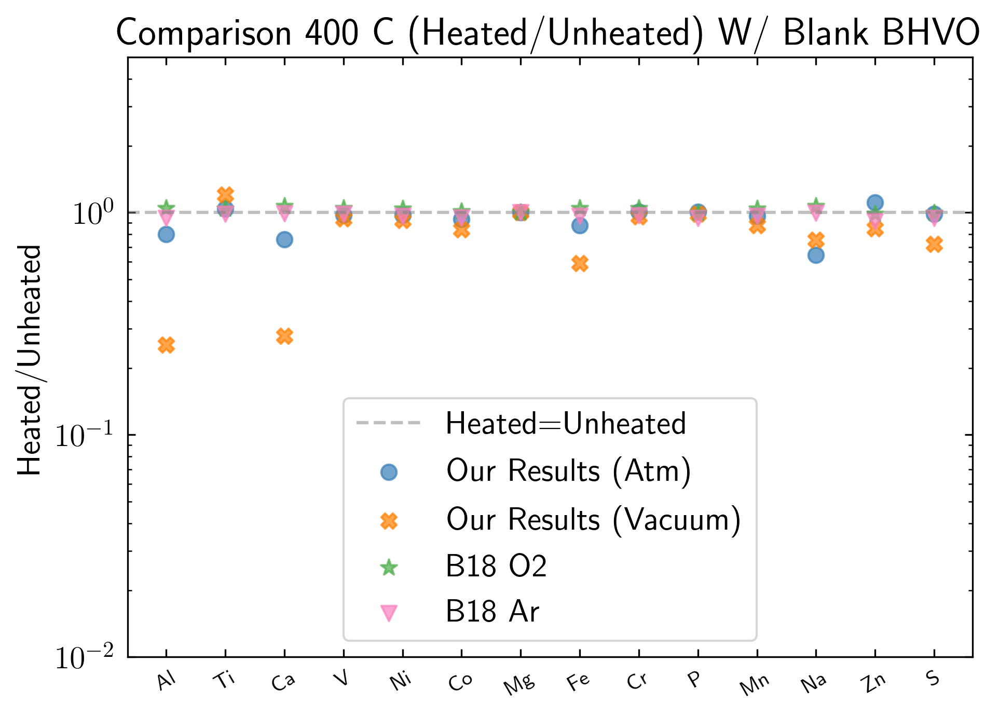

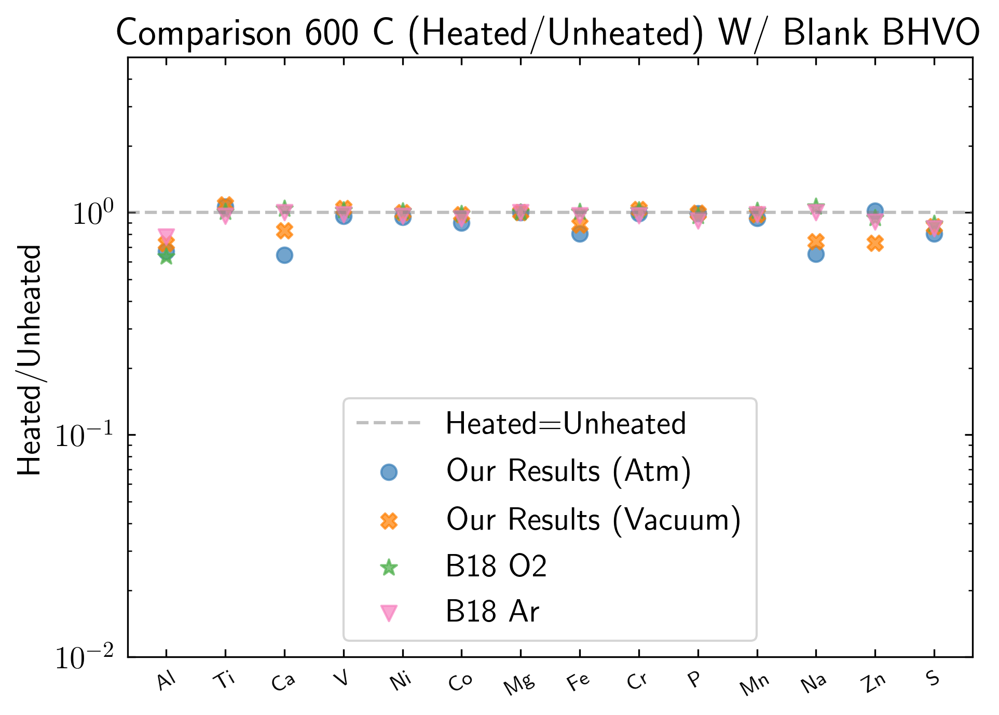

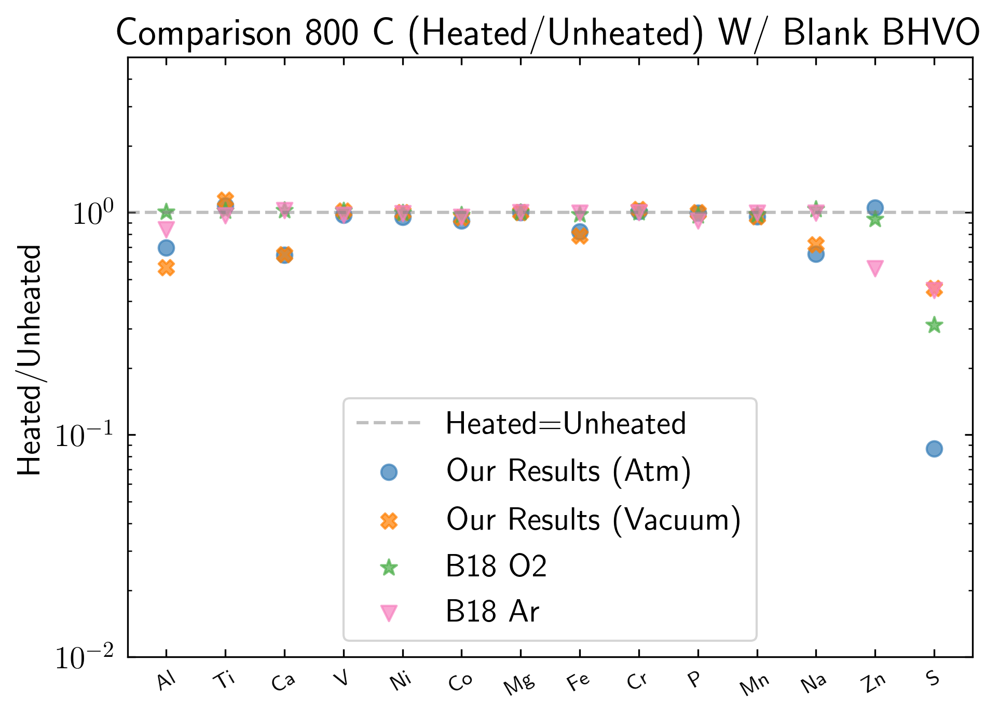

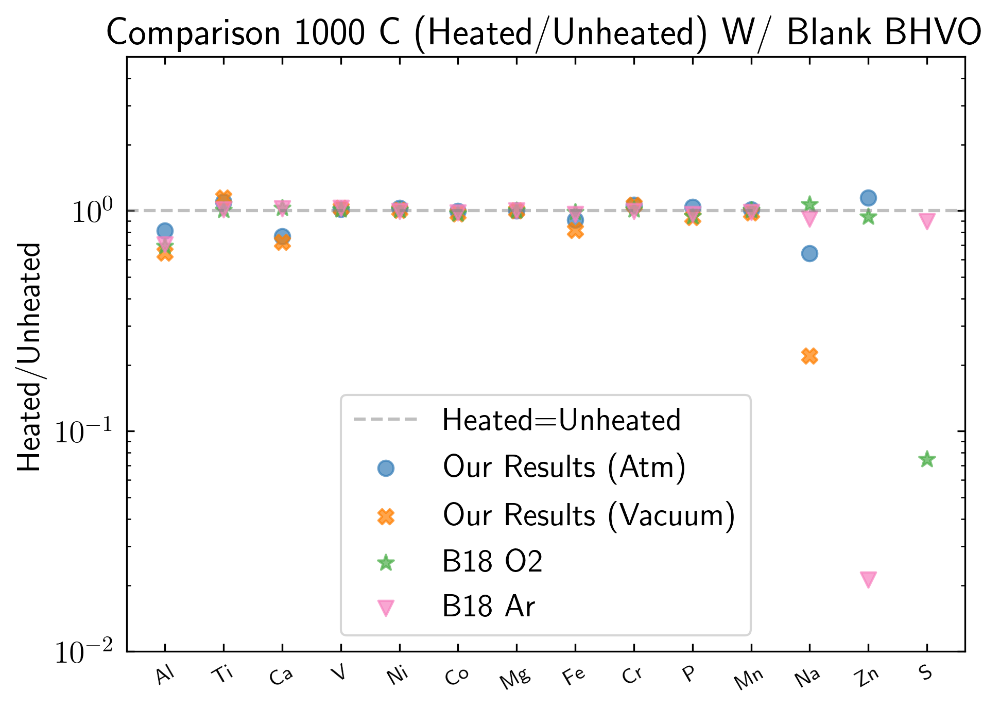

In [75]:
plot_compare_heatedvsunheated(SC_blank_BHVOu_atm_norm.loc['400']/SC_blank_BHVOu_atm_norm.loc['UH'], SC_blank_BHVOu_vac_norm.loc['400']/SC_blank_BHVOu_vac_norm.loc['UH'], B_O2_400_norm/B_MurchNC_norm, B_Ar_400_norm/B_MurchNC_norm, 'Comparison 400 C (Heated/Unheated) W/ Blank BHVO', 'comparedata400C_heatedvsunheated.jpg')
plot_compare_heatedvsunheated(SC_blank_BHVOu_atm_norm.loc['600']/SC_blank_BHVOu_atm_norm.loc['UH'], SC_blank_BHVOu_vac_norm.loc['600']/SC_blank_BHVOu_vac_norm.loc['UH'], B_O2_600_norm/B_MurchNC_norm, B_Ar_600_norm/B_MurchNC_norm, 'Comparison 600 C (Heated/Unheated) W/ Blank BHVO', 'comparedata600C_heatedvsunheated.jpg')
plot_compare_heatedvsunheated(SC_blank_BHVOu_atm_norm.loc['800']/SC_blank_BHVOu_atm_norm.loc['UH'], SC_blank_BHVOu_vac_norm.loc['800']/SC_blank_BHVOu_vac_norm.loc['UH'], B_O2_800_norm/B_MurchNC_norm, B_Ar_800_norm/B_MurchNC_norm, 'Comparison 800 C (Heated/Unheated) W/ Blank BHVO', 'comparedata800C_heatedvsunheated.jpg')
plot_compare_heatedvsunheated(SC_blank_BHVOu_atm_norm.loc['1000']/SC_blank_BHVOu_atm_norm.loc['UH'], SC_blank_BHVOu_vac_norm.loc['1000']/SC_blank_BHVOu_vac_norm.loc['UH'], B_O2_1000_norm/B_MurchNC_norm, B_Ar_1000_norm/B_MurchNC_norm, 'Comparison 1000 C (Heated/Unheated) W/ Blank BHVO', 'comparedata1000C_heatedvsunheated.jpg')





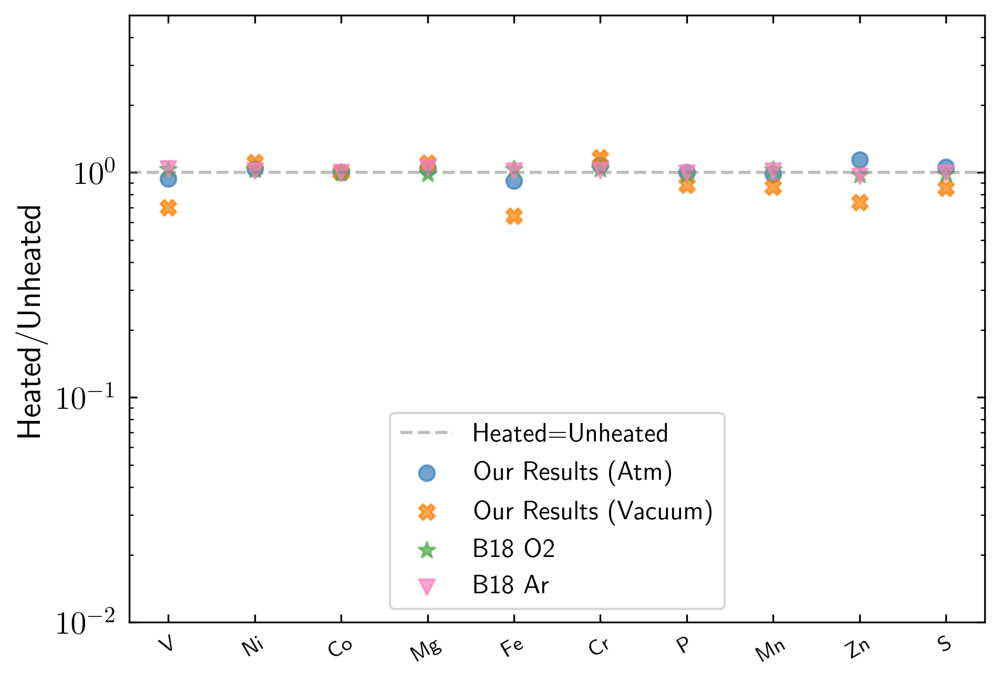

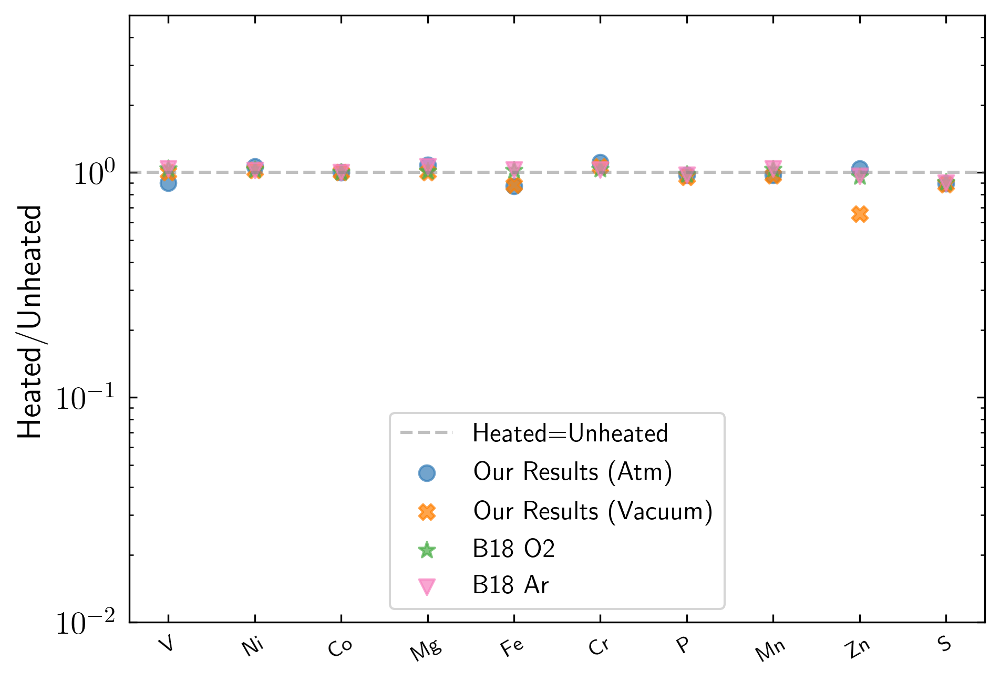

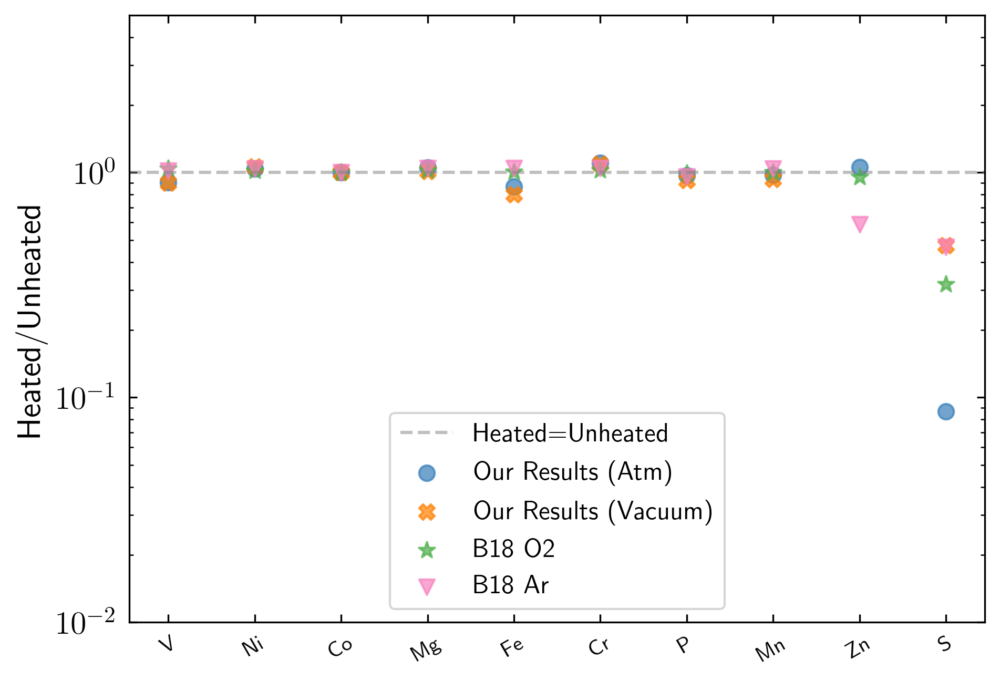

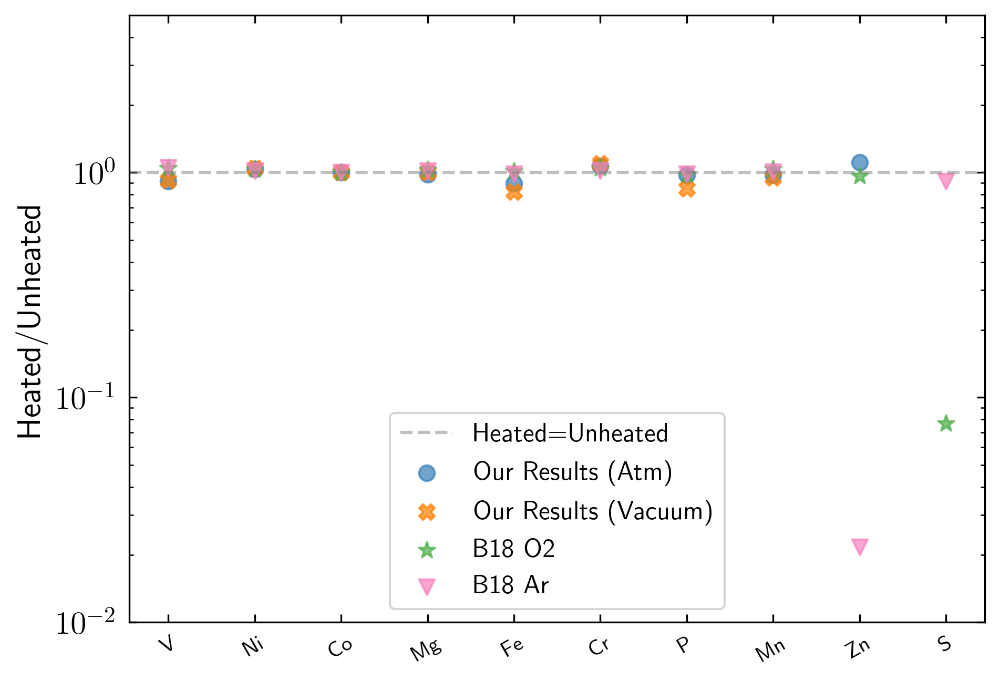

In [76]:
plot_compare_heatedvsunheated_update(SC_blank_atm_normup.loc['400']/SC_blank_atm_normup.loc['UH'], SC_blank_vac_normup.loc['400']/SC_blank_vac_normup.loc['UH'], B_O2_400_normup/B_MurchNC_normup, B_Ar_400_normup/B_MurchNC_normup, '', 'comparedata400C_heatedvsunheated_update.jpg')
plot_compare_heatedvsunheated_update(SC_blank_atm_normup.loc['600']/SC_blank_atm_normup.loc['UH'], SC_blank_vac_normup.loc['600']/SC_blank_vac_normup.loc['UH'], B_O2_600_normup/B_MurchNC_normup, B_Ar_600_normup/B_MurchNC_normup, '', 'comparedata600C_heatedvsunheated_update.jpg')
plot_compare_heatedvsunheated_update(SC_blank_atm_normup.loc['800']/SC_blank_atm_normup.loc['UH'], SC_blank_vac_normup.loc['800']/SC_blank_vac_normup.loc['UH'], B_O2_800_normup/B_MurchNC_normup, B_Ar_800_normup/B_MurchNC_normup, '', 'comparedata800C_heatedvsunheated_update.jpg')
plot_compare_heatedvsunheated_update(SC_blank_atm_normup.loc['1000']/SC_blank_atm_normup.loc['UH'], SC_blank_vac_normup.loc['1000']/SC_blank_vac_normup.loc['UH'], B_O2_1000_normup/B_MurchNC_normup, B_Ar_1000_normup/B_MurchNC_normup, '', 'comparedata1000C_heatedvsunheated_update.jpg')



